In [1]:
import numpy as np
import pandas as pd
import os
import re
from sklearn.base import clone
from sklearn.metrics import cohen_kappa_score
from sklearn.model_selection import StratifiedKFold, ShuffleSplit
from scipy.optimize import minimize
from concurrent.futures import ThreadPoolExecutor
from tqdm import tqdm
import polars as pl
import polars.selectors as cs
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator, FormatStrFormatter, PercentFormatter
import seaborn as sns

from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim

from colorama import Fore, Style
from IPython.display import clear_output
import warnings
import lightgbm as lgb
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.ensemble import VotingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.pipeline import Pipeline
from pytorch_tabnet.tab_model import TabNetRegressor

import optuna
from optuna.visualization import plot_contour
from optuna.visualization import plot_edf
from optuna.visualization import plot_intermediate_values
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_rank
from optuna.visualization import plot_slice
from optuna.visualization import plot_timeline

import gc
gc.enable()
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', None)

pl.Config.set_tbl_rows(-1)
pl.Config.set_tbl_cols(-1)
pl.Config.set_fmt_str_lengths(10000)

polars.config.Config

# Preprocessing & Feature Engineering

In [2]:
#from IPython.display import display as ipydisplay, HTML
#ipydisplay(HTML("<style>.jp-CodeCell.jp-mod-outputsScrolled .jp-Cell-outputArea { max-height: 80em; }</style>"))

In [3]:
SEED = 42
n_splits = 5

In [4]:
path = "I:/Kaggle/child-mind-institute-problematic-internet-use/"

In [5]:
train = pd.read_csv(path + 'train.csv', dtype={'id': str})
test = pd.read_csv(path + 'test.csv', dtype={'id': str})
#sample = pd.read_csv(path + 'sample_submission.csv', dtype={'id': str})

In [6]:
data_dict = pd.read_csv(path + 'data_dictionary.csv')

In [7]:
train_target = train[test.columns]

In [8]:
concat_df = pd.concat([train_target, test], ignore_index=True)

In [9]:
concat_df['total_num_nan'] = concat_df.isna().sum(axis=1)

In [10]:
del train_target
gc.collect()

0

In [11]:
nan_df = concat_df[concat_df['total_num_nan'] == concat_df['total_num_nan'].max()]

In [12]:
for col in concat_df.columns:
    if col == 'id':
        continue
    new_col_name = col + '_isnan'
    concat_df[new_col_name] = concat_df[col].isna().astype(int)

In [13]:
instruments = data_dict['Instrument'].unique().tolist()
instruments.remove('Identifier')

In [14]:
for instrument in instruments:
    if 'Parent-Child Internet Addiction Test' == instrument:
        continue
    instrument_df = data_dict[data_dict['Instrument'] == instrument]
    field_list = instrument_df['Field'].unique().tolist()
    concat_df[instrument + '_num_nan'] = concat_df[field_list].isna().sum(axis=1)

del instrument_df, field_list
gc.collect()

0

In [15]:
train_parquet_id_folders_list = os.listdir(path + 'series_train.parquet/')

In [16]:
train_parquet_id_list = [v.replace('id=', '') for v in train_parquet_id_folders_list]

In [17]:
test_parquet_id_folders_list = os.listdir(path + 'series_test.parquet/')

In [18]:
test_parquet_id_list = [v.replace('id=', '') for v in test_parquet_id_folders_list]

In [19]:
train_temp_df = concat_df.head(train.shape[0]).reset_index(drop=True)

In [20]:
test_temp_df = concat_df.tail(test.shape[0]).reset_index(drop=True)

In [21]:
del concat_df
gc.collect()

0

In [22]:
train_temp_df['has_parquet'] = train_temp_df['id'].isin(train_parquet_id_list).astype(int)

In [23]:
test_temp_df['has_parquet'] = test_temp_df['id'].isin(test_parquet_id_list).astype(int)

In [24]:
# https://www.kaggle.com/code/antoninadolgorukova/cmi-piu-actigraphy-data-eda
entropy = lambda x: -(x / x.sum() * np.log(x / x.sum() + 1e-9)).sum()

In [25]:
def feat_engi(df, target_cols):
    stats_df = df[target_cols].describe(percentiles=[0.01, 0.03] + [(i+1)*0.05 for i in range(19)] + [0.97, 0.99]).T
    count = stats_df['count'][0]
    stats_df.drop('count', axis=1, inplace=True)
    
    column_names_list = []
    for idx in stats_df.index:
        for col in stats_df.columns:
            column_names_list.append(str(idx) + '_' + str(col))

    reshaped_df = pd.DataFrame(stats_df.values.reshape(-1)).T.reset_index(drop=True)
    reshaped_df.columns = column_names_list

    reshaped_df['count'] = count

    return reshaped_df

In [26]:
def groupby_feat_engi(df, col_to_group, target_col):
    stats_df = pd.DataFrame(
        df.groupby(col_to_group)[target_col].describe(percentiles=[0.01, 0.03] + [(i+1)*0.05 for i in range(19)] + [0.97, 0.99])
    )

    stats_df['sum'] = df.groupby(col_to_group)[target_col].sum()
    stats_df['entropy'] = df.groupby(col_to_group)[target_col].apply(entropy)
    
    column_names_list = []
    for idx in stats_df.index:
        for col in stats_df.columns:
            column_names_list.append(target_col + '_' + col_to_group + '_' + str(idx) + '_' + str(col))

    reshaped_df = pd.DataFrame(stats_df.values.reshape(-1)).T.reset_index(drop=True)
    reshaped_df.columns = column_names_list

    return reshaped_df

In [27]:
def uncommon_groupby_feat_engi(df, col_to_group, target_col):
    stats_df = pd.DataFrame(
        df.groupby(col_to_group)[target_col].describe()
        #df.groupby(col_to_group)[target_col].describe(percentiles=[0.01, 0.03] + [(i+1)*0.05 for i in range(19)] + [0.97, 0.99])
    )

    stats_df['sum'] = df.groupby(col_to_group)[target_col].sum()
    stats_df['entropy'] = df.groupby(col_to_group)[target_col].apply(entropy)

    
    #stats_stats_df = stats_df.describe(percentiles=[0.01, 0.03] + [(i+1)*0.05 for i in range(19)] + [0.97, 0.99])
    stats_stats_df = stats_df.describe()
    stats_stats_count = stats_stats_df['count'][0]
    stats_stats_df.drop('count', axis=0, inplace=True)
    stats_stats_df = stats_stats_df.T
    
    column_names_list = []
    for idx in stats_stats_df.index:
        for col in stats_stats_df.columns:
            column_names_list.append(target_col + '_' + col_to_group + '_' + str(idx) + '_' + str(col))
    
    reshaped_df = pd.DataFrame(stats_stats_df.values.reshape(-1)).T.reset_index(drop=True)
    reshaped_df.columns = column_names_list

    current_cols = reshaped_df.columns.tolist()
    count_col_name = target_col + '_' + col_to_group + '_count'
    reshaped_df[count_col_name] = stats_stats_count

    reshaped_df = reshaped_df[[count_col_name] + current_cols]

    return reshaped_df

In [28]:
def read_parquet(dataset='train'):
    parquet_id_folders_list = os.listdir(path + 'series_' + dataset + '.parquet/')
    ts_list = []
    ts_features_list = []
    for id_folder in tqdm(parquet_id_folders_list):
        iid = id_folder.replace('id=', '')
    
        parquet_files_path = path + 'series_' + dataset + '.parquet/' + id_folder + '/'
        parquet_files_list = os.listdir(parquet_files_path)
    
        dfs_list = []
        for parquet_filename in parquet_files_list:
            if '.parquet' in parquet_filename:
                parquet_df = pd.read_parquet(parquet_files_path + parquet_filename)
                dfs_list.append(parquet_df)
        parquet_concat_df = pd.concat(dfs_list, ignore_index=True)
        current_cols = parquet_concat_df.columns.tolist()
        
        parquet_concat_df['id'] = iid
        
        parquet_concat_df = parquet_concat_df[['id'] + current_cols]
        
        parquet_concat_df['day_since_wear'] = (parquet_concat_df['relative_date_PCIAT'] - parquet_concat_df['relative_date_PCIAT'].min()).astype(int)
        parquet_concat_df['time_of_day_sec'] = parquet_concat_df['time_of_day'] / 1e9
        parquet_concat_df.drop('time_of_day', axis=1, inplace=True)
        parquet_concat_df['time_of_day_min'] = parquet_concat_df['time_of_day_sec'] / 60
        parquet_concat_df['time_of_day_hour'] = parquet_concat_df['time_of_day_min'] / 60
        parquet_concat_df['time_of_day_day'] = parquet_concat_df['time_of_day_hour'] / 24
        parquet_concat_df['time_of_day_hour_window'] = parquet_concat_df['time_of_day_hour'].astype(int)
        parquet_concat_df['time_of_day_min_window'] = parquet_concat_df['time_of_day_min'].astype(int)
        parquet_concat_df['time_of_day_15_min_window'] = (parquet_concat_df['time_of_day_min'] / 15).astype(int)
        parquet_concat_df['timestamp_day'] = parquet_concat_df['day_since_wear'] + parquet_concat_df['time_of_day_day']
    
        if parquet_concat_df['timestamp_day'].nunique() != parquet_concat_df.shape[0]:
            print('yes')
    
        parquet_concat_df['timestamp_hour'] = parquet_concat_df['timestamp_day'] * 24
        parquet_concat_df['timestamp_min'] = parquet_concat_df['timestamp_day'] * 24 * 60
        parquet_concat_df['timestamp_sec'] = parquet_concat_df['timestamp_day'] * 24 * 60 * 60
        parquet_concat_df['timestamp_15_min'] = parquet_concat_df['timestamp_day'] * 24 * (60/15)
    
        parquet_concat_df['timestamp_hour_window'] = parquet_concat_df['timestamp_hour'].astype(int)
        parquet_concat_df['timestamp_min_window'] = parquet_concat_df['timestamp_min'].astype(int)
        parquet_concat_df['timestamp_15_min_window'] = parquet_concat_df['timestamp_15_min'].astype(int)
    
        battery_voltage_start = parquet_concat_df['battery_voltage'][0]
        parquet_concat_df['battery_use_since_wear'] = -(parquet_concat_df['battery_voltage'] - battery_voltage_start)
        
    
        worn_df = parquet_concat_df[parquet_concat_df['non-wear_flag'] == 0].reset_index(drop=True)
    
        
        feature_cols = ['X', 'Y', 'Z', 'enmo', 'anglez', 'light', 'battery_use_since_wear']
    
        features_df = feat_engi(worn_df, feature_cols)
    
        groupby_cols = ['weekday', 'time_of_day_hour_window']#, 'time_of_day_15_min_window']
    
        groupby_df_list = []
        for groupby_col in groupby_cols:
            for feature_col in feature_cols:
                groupby_features_df = groupby_feat_engi(worn_df, groupby_col, feature_col)
                groupby_df_list.append(groupby_features_df)
    
        groupby_concat_df = pd.concat(groupby_df_list, axis=1)
    
        uncommon_groupby_cols = ['day_since_wear', 'timestamp_hour_window']#, 'timestamp_15_min_window']#, 'timestamp_min_window']
    
        uncommon_groupby_df_list = []
        for uncommon_groupby_col in uncommon_groupby_cols:
            for unc_feature_col in feature_cols:
                uncommon_groupby_df = uncommon_groupby_feat_engi(worn_df, uncommon_groupby_col, unc_feature_col)
                uncommon_groupby_df_list.append(uncommon_groupby_df)
    
        features_concat_df = pd.concat([features_df, groupby_concat_df, uncommon_groupby_df], axis=1)
        features_current_cols = features_concat_df.columns.tolist()
        features_concat_df['id'] = iid
        features_concat_df = features_concat_df[['id'] + features_current_cols]
    
        for q in [1,2,3,4]:
            if q in worn_df['quarter'].tolist():
                features_concat_df['data_collected_in_quarter_' + str(q)] = 1
            else:
                features_concat_df['data_collected_in_quarter_' + str(q)] = 0

        features_concat_df['id'] = features_concat_df['id'].astype(str)

        #features_concat_df.to_csv(path + 'series_' + dataset + '.parquet/id=' + iid + '/features.csv', index=False)
        
        ts_list.append(parquet_concat_df)
        ts_features_list.append(features_concat_df)

        gc.collect()
    gc.collect()
    
    return ts_list, ts_features_list

In [29]:
def read_features_files():
    temp_dfs_list = []
    ts_features_folders_list = os.listdir(path + 'train_ts_features/')
    for temp_id_folder in tqdm(ts_features_folders_list):
        temp_files_list = os.listdir(path + 'train_ts_features/' + temp_id_folder + '/')
        for temp_filename in temp_files_list:
            if '.csv' in temp_filename:
                temp_df = pd.read_csv(path + 'train_ts_features/' + temp_id_folder + '/' + temp_filename, dtype={'id': str})
                temp_dfs_list.append(temp_df)
    gc.collect()
    return temp_dfs_list

In [30]:
train_ts_features_list = read_features_files()

100%|████████████████████████████████████████████████████████████████████████████████| 996/996 [04:39<00:00,  3.56it/s]


In [31]:
test_ts_list, test_ts_features_list = read_parquet(dataset='test')

100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.40s/it]


In [32]:
train_ts_features_concat_df = pd.concat(train_ts_features_list, ignore_index=True)
test_ts_features_concat_df = pd.concat(test_ts_features_list, ignore_index=True)

In [33]:
del train_ts_features_list, test_ts_features_list
gc.collect()

0

In [34]:
train_merge_df = train_temp_df.merge(train_ts_features_concat_df, how='left', on='id')
test_merge_df = test_temp_df.merge(test_ts_features_concat_df, how='left', on='id')

In [35]:
del train_ts_features_concat_df, test_ts_features_concat_df
gc.collect()

0

In [36]:
cat_cols = []
for i in range(data_dict.shape[0]):
    col = data_dict['Field'][i]
    if col == 'id':
        continue
    if (data_dict['Type'][i] == 'str') | ('categori' in data_dict['Type'][i]):
        cat_cols.append(col)

In [37]:
ordinal_variables = ['FGC-FGC_CU_Zone', 'FGC-FGC_CU_Zone', 'FGC-FGC_GSND_Zone', 'FGC-FGC_GSD_Zone', 'FGC-FGC_PU_Zone',
                     'FGC-FGC_SRL_Zone', 'FGC-FGC_SRR_Zone', 'FGC-FGC_TL_Zone', 'BIA-BIA_Activity_Level_num', 'BIA-BIA_Frame_num',
                     'PreInt_EduHx-computerinternet_hoursday']

ordinal_variables += [col for col in cat_cols if (('PCIAT' in col)&('Season' not in col))]

In [38]:
cat_cols = list(set(cat_cols) - set(ordinal_variables))
cat_cols = [col for col in cat_cols if 'PCIAT' not in col]

In [39]:
merge_concat_df = pd.concat([train_merge_df, test_merge_df], ignore_index=True)

In [40]:
del train_merge_df, test_merge_df
gc.collect()

0

In [41]:
def remove_pciat_cols(df):
    cols_to_drop = []
    for col in df.columns:
        if 'PCIAT' in col:
            cols_to_drop.append(col)

    df.drop(cols_to_drop, axis=1, inplace=True)
    
    return df

In [42]:
merge_concat_df = remove_pciat_cols(merge_concat_df)

In [43]:
def one_hot_cat_cols(df):
    for col in tqdm(cat_cols):
        df[col] = df[col].fillna('Missing').apply(str)
        unique_list = sorted(df[col].unique().tolist())

        for v in unique_list:
            new_col_name = col + '_' + v
            df[new_col_name] = (df[col] == v).astype(int)
    
    df = df.drop(cat_cols, axis=1)

    return df

In [44]:
merge_concat_df = one_hot_cat_cols(merge_concat_df)

100%|█████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 305.56it/s]


In [45]:
# https://www.kaggle.com/code/ichigoe/lb0-494-with-tabnet
def feature_engineering(df):
    df['BMI_Age'] = df['Physical-BMI'] * df['Basic_Demos-Age']
    df['Internet_Hours_Age'] = df['PreInt_EduHx-computerinternet_hoursday'] * df['Basic_Demos-Age']
    df['BMI_Internet_Hours'] = df['Physical-BMI'] * df['PreInt_EduHx-computerinternet_hoursday']
    df['BFP_BMI'] = df['BIA-BIA_Fat'] / df['BIA-BIA_BMI']
    df['FFMI_BFP'] = df['BIA-BIA_FFMI'] / df['BIA-BIA_Fat']
    df['FMI_BFP'] = df['BIA-BIA_FMI'] / df['BIA-BIA_Fat']
    df['LST_TBW'] = df['BIA-BIA_LST'] / df['BIA-BIA_TBW']
    df['BFP_BMR'] = df['BIA-BIA_Fat'] * df['BIA-BIA_BMR']
    df['BFP_DEE'] = df['BIA-BIA_Fat'] * df['BIA-BIA_DEE']
    df['BMR_Weight'] = df['BIA-BIA_BMR'] / df['Physical-Weight']
    df['DEE_Weight'] = df['BIA-BIA_DEE'] / df['Physical-Weight']
    df['SMM_Height'] = df['BIA-BIA_SMM'] / df['Physical-Height']
    df['Muscle_to_Fat'] = df['BIA-BIA_SMM'] / df['BIA-BIA_FMI']
    df['Hydration_Status'] = df['BIA-BIA_TBW'] / df['Physical-Weight']
    df['ICW_TBW'] = df['BIA-BIA_ICW'] / df['BIA-BIA_TBW']
    
    return df

In [46]:
merge_concat_df = feature_engineering(merge_concat_df)

In [47]:
no_id_cols = [col for col in merge_concat_df.columns if col != 'id']

In [48]:
if np.any(np.isinf(merge_concat_df[no_id_cols])):
    print('inf in data')
    merge_concat_df[no_id_cols] = merge_concat_df[no_id_cols].replace([np.inf, -np.inf], np.nan)

inf in data


In [49]:
imputer = KNNImputer(n_neighbors=5)
merge_concat_df[no_id_cols] = imputer.fit_transform(merge_concat_df[no_id_cols])

In [50]:
del imputer
gc.collect()

0

In [51]:
train_df = merge_concat_df.head(train.shape[0]).reset_index(drop=True)
test_df = merge_concat_df.tail(test.shape[0]).reset_index(drop=True)

In [52]:
train_df['sii'] = train['sii']

In [53]:
del train, test
gc.collect()

0

In [54]:
train_nonan_df = train_df[~train_df['sii'].isna()].reset_index(drop=True)

In [55]:
del train_df
gc.collect()

0

In [56]:
#selected_features_df = pd.read_csv(path + 'selected_features.csv')

In [57]:
#train_cols = selected_features_df['selected_features'].tolist()

In [58]:
#del selected_features_df
#gc.collect()

In [59]:
#test_cols = train_cols.copy()
#test_cols.remove('sii')

In [60]:
#train_final_df = train_nonan_df[train_cols].copy()
#test_final_df = test_df[test_cols].copy()

In [61]:
train_final_df = train_nonan_df.copy()
test_final_df = test_df.copy()

In [62]:
del train_nonan_df, test_df
gc.collect()

0

In [63]:
corr_df = train_final_df.drop(['id', 'sii'], axis=1).corr()

In [64]:
# Find features with high correlation
high_corr = np.where(corr_df > 0.9)
high_corr_pairs = [
    (corr_df.index[x], corr_df.columns[y])
    for x, y in zip(*high_corr)
    if x != y and x < y
]

In [65]:
second_v_list = []
for v in high_corr_pairs:
    second_v = v[1]
    second_v_list.append(second_v)

In [66]:
redundant_features = list(set(second_v_list))

In [67]:
train_final_df = train_final_df.drop(redundant_features, axis=1)
print(train_final_df.shape)
train_final_df.head()

(2736, 1420)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Max_Stage,Fitness_Endurance-Time_Mins,Fitness_Endurance-Time_Sec,FGC-FGC_CU,FGC-FGC_CU_Zone,FGC-FGC_GSND,FGC-FGC_GSND_Zone,FGC-FGC_GSD,FGC-FGC_GSD_Zone,FGC-FGC_PU,FGC-FGC_PU_Zone,FGC-FGC_SRL,FGC-FGC_SRL_Zone,FGC-FGC_SRR_Zone,FGC-FGC_TL,FGC-FGC_TL_Zone,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,total_num_nan,Basic_Demos-Enroll_Season_isnan,Basic_Demos-Age_isnan,Basic_Demos-Sex_isnan,CGAS-Season_isnan,Physical-Season_isnan,Physical-BMI_isnan,Physical-Waist_Circumference_isnan,Physical-Diastolic_BP_isnan,Fitness_Endurance-Season_isnan,Fitness_Endurance-Max_Stage_isnan,FGC-Season_isnan,FGC-FGC_CU_isnan,FGC-FGC_GSND_isnan,BIA-Season_isnan,PAQ_A-Season_isnan,PAQ_C-Season_isnan,SDS-Season_isnan,PreInt_EduHx-Season_isnan,PreInt_EduHx-computerinternet_hoursday_isnan,total_num_nan_isnan,Demographics_num_nan,has_parquet,X_mean,X_std,X_min,X_1%,X_99%,X_max,Y_mean,Y_std,Y_min,Y_1%,Y_3%,Y_95%,Y_99%,Y_max,Z_mean,Z_std,Z_min,Z_1%,Z_3%,Z_99%,Z_max,enmo_mean,enmo_std,enmo_min,enmo_1%,enmo_10%,enmo_max,anglez_min,anglez_1%,anglez_max,light_mean,light_min,light_1%,light_10%,light_max,battery_use_since_wear_mean,battery_use_since_wear_std,battery_use_since_wear_min,battery_use_since_wear_1%,battery_use_since_wear_3%,battery_use_since_wear_10%,battery_use_since_wear_max,count,X_weekday_1_mean,X_weekday_1_std,X_weekday_1_min,X_weekday_1_1%,X_weekday_1_max,X_weekday_1_sum,X_weekday_1_entropy,X_weekday_2_mean,X_weekday_2_std,X_weekday_2_min,X_weekday_2_1%,X_weekday_2_max,X_weekday_2_sum,X_weekday_2_entropy,X_weekday_3_mean,X_weekday_3_std,X_weekday_3_min,X_weekday_3_1%,X_weekday_3_3%,X_weekday_3_max,X_weekday_3_sum,X_weekday_3_entropy,X_weekday_4_mean,X_weekday_4_std,X_weekday_4_min,X_weekday_4_1%,X_weekday_4_max,X_weekday_4_sum,X_weekday_4_entropy,X_weekday_5_mean,X_weekday_5_std,X_weekday_5_min,X_weekday_5_1%,X_weekday_5_max,X_weekday_5_sum,X_weekday_5_entropy,X_weekday_6_mean,X_weekday_6_std,X_weekday_6_min,X_weekday_6_1%,X_weekday_6_max,X_weekday_6_sum,X_weekday_6_entropy,X_weekday_7_mean,X_weekday_7_std,X_weekday_7_min,X_weekday_7_1%,X_weekday_7_max,X_weekday_7_sum,X_weekday_7_entropy,Y_weekday_1_mean,Y_weekday_1_std,Y_weekday_1_min,Y_weekday_1_1%,Y_weekday_1_max,Y_weekday_1_sum,Y_weekday_1_entropy,Y_weekday_2_mean,Y_weekday_2_std,Y_weekday_2_min,Y_weekday_2_1%,Y_weekday_2_max,Y_weekday_2_sum,Y_weekday_2_entropy,Y_weekday_3_mean,Y_weekday_3_std,Y_weekday_3_min,Y_weekday_3_1%,Y_weekday_3_max,Y_weekday_3_sum,Y_weekday_3_entropy,Y_weekday_4_mean,Y_weekday_4_std,Y_weekday_4_min,Y_weekday_4_1%,Y_weekday_4_max,Y_weekday_4_sum,Y_weekday_4_entropy,Y_weekday_5_mean,Y_weekday_5_std,Y_weekday_5_min,Y_weekday_5_1%,Y_weekday_5_70%,Y_weekday_5_max,Y_weekday_5_sum,Y_weekday_5_entropy,Y_weekday_6_mean,Y_weekday_6_std,Y_weekday_6_min,Y_weekday_6_1%,Y_weekday_6_max,Y_weekday_6_sum,Y_weekday_6_entropy,Y_weekday_7_mean,Y_weekday_7_std,Y_weekday_7_min,Y_weekday_7_1%,Y_weekday_7_max,Y_weekday_7_sum,Y_weekday_7_entropy,Z_weekday_1_mean,Z_weekday_1_std,Z_weekday_1_min,Z_weekday_1_15%,Z_weekday_1_max,Z_weekday_1_sum,Z_weekday_1_entropy,Z_weekday_2_mean,Z_weekday_2_std,Z_weekday_2_min,Z_weekday_2_1%,Z_weekday_2_3%,Z_weekday_2_15%,Z_weekday_2_90%,Z_weekday_2_max,Z_weekday_2_sum,Z_weekday_2_entropy,Z_weekday_3_mean,Z_weekday_3_std,Z_weekday_3_min,Z_weekday_3_1%,Z_weekday_3_max,Z_weekday_3_sum,Z_weekday_3_entropy,Z_weekday_4_mean,Z_weekday_4_std,Z_weekday_4_min,Z_weekday_4_1%,Z_weekday_4_25%,Z_weekday_4_max,Z_weekday_4_sum,Z_weekday_4_entropy,Z_weekday_5_mean,Z_weekday_5_std,Z_weekday_5_min,Z_weekday_5_1%,Z_weekday_5_max,Z_weekday_5_sum,Z_weekday_5_entropy,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_min,Z_weekday_6_95%,Z_weekday_6_max

In [68]:
test_final_df = test_final_df.drop(redundant_features, axis=1)
print(test_final_df.shape)
test_final_df.head()

(20, 1419)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Max_Stage,Fitness_Endurance-Time_Mins,Fitness_Endurance-Time_Sec,FGC-FGC_CU,FGC-FGC_CU_Zone,FGC-FGC_GSND,FGC-FGC_GSND_Zone,FGC-FGC_GSD,FGC-FGC_GSD_Zone,FGC-FGC_PU,FGC-FGC_PU_Zone,FGC-FGC_SRL,FGC-FGC_SRL_Zone,FGC-FGC_SRR_Zone,FGC-FGC_TL,FGC-FGC_TL_Zone,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,total_num_nan,Basic_Demos-Enroll_Season_isnan,Basic_Demos-Age_isnan,Basic_Demos-Sex_isnan,CGAS-Season_isnan,Physical-Season_isnan,Physical-BMI_isnan,Physical-Waist_Circumference_isnan,Physical-Diastolic_BP_isnan,Fitness_Endurance-Season_isnan,Fitness_Endurance-Max_Stage_isnan,FGC-Season_isnan,FGC-FGC_CU_isnan,FGC-FGC_GSND_isnan,BIA-Season_isnan,PAQ_A-Season_isnan,PAQ_C-Season_isnan,SDS-Season_isnan,PreInt_EduHx-Season_isnan,PreInt_EduHx-computerinternet_hoursday_isnan,total_num_nan_isnan,Demographics_num_nan,has_parquet,X_mean,X_std,X_min,X_1%,X_99%,X_max,Y_mean,Y_std,Y_min,Y_1%,Y_3%,Y_95%,Y_99%,Y_max,Z_mean,Z_std,Z_min,Z_1%,Z_3%,Z_99%,Z_max,enmo_mean,enmo_std,enmo_min,enmo_1%,enmo_10%,enmo_max,anglez_min,anglez_1%,anglez_max,light_mean,light_min,light_1%,light_10%,light_max,battery_use_since_wear_mean,battery_use_since_wear_std,battery_use_since_wear_min,battery_use_since_wear_1%,battery_use_since_wear_3%,battery_use_since_wear_10%,battery_use_since_wear_max,count,X_weekday_1_mean,X_weekday_1_std,X_weekday_1_min,X_weekday_1_1%,X_weekday_1_max,X_weekday_1_sum,X_weekday_1_entropy,X_weekday_2_mean,X_weekday_2_std,X_weekday_2_min,X_weekday_2_1%,X_weekday_2_max,X_weekday_2_sum,X_weekday_2_entropy,X_weekday_3_mean,X_weekday_3_std,X_weekday_3_min,X_weekday_3_1%,X_weekday_3_3%,X_weekday_3_max,X_weekday_3_sum,X_weekday_3_entropy,X_weekday_4_mean,X_weekday_4_std,X_weekday_4_min,X_weekday_4_1%,X_weekday_4_max,X_weekday_4_sum,X_weekday_4_entropy,X_weekday_5_mean,X_weekday_5_std,X_weekday_5_min,X_weekday_5_1%,X_weekday_5_max,X_weekday_5_sum,X_weekday_5_entropy,X_weekday_6_mean,X_weekday_6_std,X_weekday_6_min,X_weekday_6_1%,X_weekday_6_max,X_weekday_6_sum,X_weekday_6_entropy,X_weekday_7_mean,X_weekday_7_std,X_weekday_7_min,X_weekday_7_1%,X_weekday_7_max,X_weekday_7_sum,X_weekday_7_entropy,Y_weekday_1_mean,Y_weekday_1_std,Y_weekday_1_min,Y_weekday_1_1%,Y_weekday_1_max,Y_weekday_1_sum,Y_weekday_1_entropy,Y_weekday_2_mean,Y_weekday_2_std,Y_weekday_2_min,Y_weekday_2_1%,Y_weekday_2_max,Y_weekday_2_sum,Y_weekday_2_entropy,Y_weekday_3_mean,Y_weekday_3_std,Y_weekday_3_min,Y_weekday_3_1%,Y_weekday_3_max,Y_weekday_3_sum,Y_weekday_3_entropy,Y_weekday_4_mean,Y_weekday_4_std,Y_weekday_4_min,Y_weekday_4_1%,Y_weekday_4_max,Y_weekday_4_sum,Y_weekday_4_entropy,Y_weekday_5_mean,Y_weekday_5_std,Y_weekday_5_min,Y_weekday_5_1%,Y_weekday_5_70%,Y_weekday_5_max,Y_weekday_5_sum,Y_weekday_5_entropy,Y_weekday_6_mean,Y_weekday_6_std,Y_weekday_6_min,Y_weekday_6_1%,Y_weekday_6_max,Y_weekday_6_sum,Y_weekday_6_entropy,Y_weekday_7_mean,Y_weekday_7_std,Y_weekday_7_min,Y_weekday_7_1%,Y_weekday_7_max,Y_weekday_7_sum,Y_weekday_7_entropy,Z_weekday_1_mean,Z_weekday_1_std,Z_weekday_1_min,Z_weekday_1_15%,Z_weekday_1_max,Z_weekday_1_sum,Z_weekday_1_entropy,Z_weekday_2_mean,Z_weekday_2_std,Z_weekday_2_min,Z_weekday_2_1%,Z_weekday_2_3%,Z_weekday_2_15%,Z_weekday_2_90%,Z_weekday_2_max,Z_weekday_2_sum,Z_weekday_2_entropy,Z_weekday_3_mean,Z_weekday_3_std,Z_weekday_3_min,Z_weekday_3_1%,Z_weekday_3_max,Z_weekday_3_sum,Z_weekday_3_entropy,Z_weekday_4_mean,Z_weekday_4_std,Z_weekday_4_min,Z_weekday_4_1%,Z_weekday_4_25%,Z_weekday_4_max,Z_weekday_4_sum,Z_weekday_4_entropy,Z_weekday_5_mean,Z_weekday_5_std,Z_weekday_5_min,Z_weekday_5_1%,Z_weekday_5_max,Z_weekday_5_sum,Z_weekday_5_entropy,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_min,Z_weekday_6_95%,Z_weekday_6_max

# Parameter tuning, training, prediction & submission

In [69]:
# https://www.kaggle.com/code/ichigoe/lb0-494-with-tabnet
def quadratic_weighted_kappa(y_true, y_pred):
    return cohen_kappa_score(y_true, y_pred, weights='quadratic')

def threshold_Rounder(oof_non_rounded, thresholds):
    return np.where(oof_non_rounded < thresholds[0], 0,
                    np.where(oof_non_rounded < thresholds[1], 1,
                             np.where(oof_non_rounded < thresholds[2], 2, 3)))

def evaluate_predictions(thresholds, y_true, oof_non_rounded):
    rounded_p = threshold_Rounder(oof_non_rounded, thresholds)
    return -quadratic_weighted_kappa(y_true, rounded_p)

In [79]:
optuna.logging.set_verbosity(optuna.logging.WARNING)

In [181]:
# https://www.kaggle.com/code/ichigoe/lb0-494-with-tabnet
# Edited by Max (Jongyun Han)

def lgb_feature_selection(train_data, test_data, optuna_n_trials):
    X = train_data.drop(['id', 'sii'], axis=1)
    y = train_data['sii']

    test_data_copy = test_data.copy()
    test_data = test_data.drop('id', axis=1)

    SKF = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=SEED)
    
    train_S = []
    test_S = []
    
    oof_non_rounded = np.zeros(len(y), dtype=float) 
    oof_rounded = np.zeros(len(y), dtype=int) 
    test_preds = np.zeros((len(test_data), n_splits))

    models_list = []

    base_params = {
        'verbosity': -1,
        'seed': SEED,
        'num_iterations': 10000,
        'feature_fraction': 0.8,
        'device': 'gpu'
    }

    def objective(trial):

        params_to_tune = {
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
            'early_stopping_round': trial.suggest_int('early_stopping_round', 10, 60),
            'max_depth': trial.suggest_int('max_depth', 6, 50),
            'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 20, 300),
            'num_leaves': trial.suggest_int('num_leaves', 50, 10000),
            'min_gain_to_split': trial.suggest_float('min_gain_to_split', 0, 0.3),
            'lambda_l1': trial.suggest_float('lambda_l1', 0, 10),
            'lambda_l2': trial.suggest_float('lambda_l2', 50, 2000)
        }

        #for fold, (train_idx, test_idx) in enumerate(tqdm(SKF.split(X, y), desc="Training Folds", total=n_splits)):
        for fold, (train_idx, test_idx) in enumerate(SKF.split(X, y)):
            X_train, X_val = X.iloc[train_idx], X.iloc[test_idx]
            y_train, y_val = y.iloc[train_idx], y.iloc[test_idx]
            
            lgb_callbacks = [
                lgb.log_evaluation(period=20)
            ]
    
            model = LGBMRegressor(
                **base_params,
                **params_to_tune
            )
            
            model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_val, y_val)])#, callbacks=lgb_callbacks)
    
            #plt.figure()
            #lgb.plot_metric(model)
            #plt.show()
            
            y_train_pred = model.predict(X_train)
            y_val_pred = model.predict(X_val)
    
            oof_non_rounded[test_idx] = y_val_pred
            y_val_pred_rounded = y_val_pred.round(0).astype(int)
            oof_rounded[test_idx] = y_val_pred_rounded
    
        #print(f"Mean Train QWK --> {np.mean(train_S):.4f}")
        #print(f"Mean Validation QWK ---> {np.mean(test_S):.4f}")

        # https://www.kaggle.com/competitions/child-mind-institute-problematic-internet-use/discussion/551533
        #y_preds_df = pd.DataFrame({'y':y, 'preds':oof_non_rounded})
        #oof_initial_thresholds = y_preds_df.groupby('y')['preds'].mean().iloc[1:].values.tolist()
    
        KappaOPtimizer = minimize(evaluate_predictions,
                                  x0=[0.5, 1.5, 2.5], args=(y, oof_non_rounded), 
                                  method='Nelder-Mead')
        assert KappaOPtimizer.success, "Optimization did not converge."
        
        oof_tuned = threshold_Rounder(oof_non_rounded, KappaOPtimizer.x)
        tKappa = quadratic_weighted_kappa(y, oof_tuned)
    
        #print(f"----> || Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {tKappa:.3f}{Style.RESET_ALL}")
    
        return tKappa

    with tqdm(total=optuna_n_trials, desc="Optimizing", unit="trial") as pbar:
        
        # Define a callback function to update the progress bar
        def progress_bar_callback(study, trial):
            pbar.update(1)
    
        study = optuna.create_study(direction="maximize")
        study.optimize(objective, n_trials=optuna_n_trials, callbacks=[progress_bar_callback])

    '''pbar = tqdm(total=optuna_n_trials, desc="Optimizing", unit="trial")
        
    # Define a callback function to update the progress bar
    def progress_bar_callback(study, trial):
        pbar.update(1)

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=optuna_n_trials, callbacks=[progress_bar_callback])

    pbar.close()'''

    best_params = study.best_params

    train_S = []
    test_S = []
    
    oof_non_rounded = np.zeros(len(y), dtype=float) 
    oof_rounded = np.zeros(len(y), dtype=int) 
    test_preds = np.zeros((len(test_data), n_splits))

    models_list = []

    for fold, (train_idx, test_idx) in enumerate(SKF.split(X, y)):
        X_train, X_val = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[test_idx]
        
        lgb_callbacks = [
            lgb.log_evaluation(period=20)
        ]

        model = LGBMRegressor(
            **base_params,
            **best_params
        )
        
        model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_val, y_val)])#, callbacks=lgb_callbacks)

        plt.figure()
        lgb.plot_metric(model)
        plt.show()
        
        y_train_pred = model.predict(X_train)
        y_val_pred = model.predict(X_val)

        oof_non_rounded[test_idx] = y_val_pred
        y_val_pred_rounded = y_val_pred.round(0).astype(int)
        oof_rounded[test_idx] = y_val_pred_rounded

        train_y_preds_df = pd.DataFrame({'y':y_train, 'preds':y_train_pred})
        train_oof_initial_thresholds = train_y_preds_df.groupby('y')['preds'].mean().iloc[1:].values.tolist()

        train_KappaOPtimizer = minimize(evaluate_predictions,
                                  x0=train_oof_initial_thresholds, args=(y_train, y_train_pred), 
                                  method='Nelder-Mead')
        assert train_KappaOPtimizer.success, "Train Optimization did not converge."

        train_pred_tuned = threshold_Rounder(y_train_pred, train_KappaOPtimizer.x)
        train_Kappa = quadratic_weighted_kappa(y_train, train_pred_tuned)

        print(f"----> || Train Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {train_Kappa:.3f}{Style.RESET_ALL}")

        val_y_preds_df = pd.DataFrame({'y':y_val, 'preds':y_val_pred})
        val_oof_initial_thresholds = val_y_preds_df.groupby('y')['preds'].mean().iloc[1:].values.tolist()

        val_KappaOPtimizer = minimize(evaluate_predictions,
                                  x0=val_oof_initial_thresholds, args=(y_val, y_val_pred), 
                                  method='Nelder-Mead')
        assert val_KappaOPtimizer.success, "Val Optimization did not converge."

        val_pred_tuned = threshold_Rounder(y_val_pred, val_KappaOPtimizer.x)
        val_Kappa = quadratic_weighted_kappa(y_val, val_pred_tuned)

        print(f"----> || Val Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {val_Kappa:.3f}{Style.RESET_ALL}")

        train_optimized_val_pred_tuned = threshold_Rounder(y_val_pred, train_KappaOPtimizer.x)
        train_optimized_val_Kappa = quadratic_weighted_kappa(y_val, train_optimized_val_pred_tuned)

        print(f"----> || Train Optimized Val QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {train_optimized_val_Kappa:.3f}{Style.RESET_ALL}")

        val_optimized_train_pred_tuned = threshold_Rounder(y_train_pred, val_KappaOPtimizer.x)
        val_optimized_train_Kappa = quadratic_weighted_kappa(y_train, val_optimized_train_pred_tuned)

        print(f"----> || Val Optimized Train QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {val_optimized_train_Kappa:.3f}{Style.RESET_ALL}")

        rounded_train_kappa = quadratic_weighted_kappa(y_train, y_train_pred.round(0).astype(int))
        rounded_val_kappa = quadratic_weighted_kappa(y_val, y_val_pred_rounded)        

        train_S.append(train_Kappa)
        test_S.append(val_Kappa)
        
        test_preds[:, fold] = model.predict(test_data)
        
        print(f"Fold {fold+1} - Rounded Train QWK: {rounded_train_kappa:.4f}, Rounded Validation QWK: {rounded_val_kappa:.4f}")
        #clear_output(wait=True)

        models_list.append(model)

    print(f"Mean Train QWK --> {np.mean(train_S):.4f}")
    print(f"Mean Validation QWK ---> {np.mean(test_S):.4f}")

    y_preds_df = pd.DataFrame({'y':y, 'preds':oof_non_rounded})
    oof_initial_thresholds = y_preds_df.groupby('y')['preds'].mean().iloc[1:].values.tolist()

    KappaOPtimizer = minimize(evaluate_predictions,
                              x0=oof_initial_thresholds, args=(y, oof_non_rounded), 
                              method='Nelder-Mead')
    assert KappaOPtimizer.success, "Optimization did not converge."
    
    oof_tuned = threshold_Rounder(oof_non_rounded, KappaOPtimizer.x)
    tKappa = quadratic_weighted_kappa(y, oof_tuned)

    print(f"----> || Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {tKappa:.3f}{Style.RESET_ALL}")

    tpm = test_preds.mean(axis=1)
    tpTuned = threshold_Rounder(tpm, KappaOPtimizer.x)
    
    submission = pd.DataFrame({
        'id': test_data_copy['id'],
        'sii': tpTuned
    })

    return models_list, submission, oof_non_rounded, tpm, study

[I 2024-12-15 12:20:41,309] A new study created in memory with name: no-name-f4eea17d-ab27-480b-bba6-c9c8f67f3c0a
[I 2024-12-15 12:20:53,326] Trial 0 finished with value: 0.46078484673850406 and parameters: {'learning_rate': 0.2059118164954052, 'early_stopping_round': 215, 'max_depth': 23, 'min_data_in_leaf': 92, 'num_leaves': 1872, 'min_gain_to_split': 0.19550241536910984, 'lambda_l1': 1.991933269042988, 'lambda_l2': 381.0268399124832}. Best is trial 0 with value: 0.46078484673850406.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:21:02,571] Trial 1 finished with value: 0.4624209709635352 and parameters: {'learning_rate': 0.21266605330833446, 'early_stopping_round': 183, 'max_depth': 28, 'min_data_in_leaf': 146, 'num_leaves': 780, 'min_gain_to_split': 0.06648250339415944, 'lambda_l1': 2.8254140152776475, 'lambda_l2': 1450.0228322762987}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:21:16,265] Trial 2 finished with value: 0.4557397425373738 and parameters: {'learning_rate': 0.1786857990773541, 'early_stopping_round': 297, 'max_depth': 28, 'min_data_in_leaf': 230, 'num_leaves': 2810, 'min_gain_to_split': 0.1978294651533681, 'lambda_l1': 5.491516960145971, 'lambda_l2': 473.7897541501394}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-15 12:21:40,642] Trial 3 finished with value: 0.4620698694799532 and parameters: {'learning_rate': 0.022388838128018673, 'early_stopping_round': 85, 'max_depth': 21, 'min_data_in_leaf': 131, 'num_leaves': 1850, 'min_gain_to_split': 0.014651448522262888, 'lambda_l1': 7.4718531679701155, 'lambda_l2': 917.585115093064}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:21:53,573] Trial 4 finished with value: 0.4601371648616458 and parameters: {'learning_rate': 0.1338712678912942, 'early_stopping_round': 279, 'max_depth': 25, 'min_data_in_leaf': 45, 'num_leaves': 2061, 'min_gain_to_split': 0.1815564540300588, 'lambda_l1': 9.817251306940166, 'lambda_l2': 1794.4920514385367}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:22:05,498] Trial 5 finished with value: 0.3585229520063882 and parameters: {'learning_rate': 0.10458365313687461, 'early_stopping_round': 189, 'max_depth': 14, 'min_data_in_leaf': 279, 'num_leaves': 2100, 'min_gain_to_split': 0.1930841545119288, 'lambda_l1': 4.730187530688056, 'lambda_l2': 962.6742819424126}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.359


[I 2024-12-15 12:22:24,231] Trial 6 finished with value: 0.45426503999425094 and parameters: {'learning_rate': 0.16763422222630123, 'early_stopping_round': 297, 'max_depth': 19, 'min_data_in_leaf': 88, 'num_leaves': 1621, 'min_gain_to_split': 0.018540886155345625, 'lambda_l1': 7.942189605391736, 'lambda_l2': 1944.5467298247224}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.454


[I 2024-12-15 12:22:40,281] Trial 7 finished with value: 0.4574090107052511 and parameters: {'learning_rate': 0.18201029472878158, 'early_stopping_round': 298, 'max_depth': 10, 'min_data_in_leaf': 286, 'num_leaves': 2698, 'min_gain_to_split': 0.007431234410833864, 'lambda_l1': 8.86089480856738, 'lambda_l2': 1107.7199550272514}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-15 12:22:56,582] Trial 8 finished with value: 0.45725379300441293 and parameters: {'learning_rate': 0.04102932340714991, 'early_stopping_round': 196, 'max_depth': 13, 'min_data_in_leaf': 290, 'num_leaves': 2517, 'min_gain_to_split': 0.24014292945670138, 'lambda_l1': 8.510096771886628, 'lambda_l2': 1246.6464132127928}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-15 12:23:04,736] Trial 9 finished with value: 0.45836657564912975 and parameters: {'learning_rate': 0.2412688074517487, 'early_stopping_round': 84, 'max_depth': 17, 'min_data_in_leaf': 256, 'num_leaves': 1739, 'min_gain_to_split': 0.23670949674103264, 'lambda_l1': 6.59081837183916, 'lambda_l2': 415.49549798316343}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:23:10,121] Trial 10 finished with value: 0.4609290678331368 and parameters: {'learning_rate': 0.28086468382744456, 'early_stopping_round': 24, 'max_depth': 7, 'min_data_in_leaf': 196, 'num_leaves': 592, 'min_gain_to_split': 0.09726500636282892, 'lambda_l1': 0.2935914316470414, 'lambda_l2': 1496.0876849631295}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:23:28,518] Trial 11 finished with value: 0.46113631573309743 and parameters: {'learning_rate': 0.023461986182748522, 'early_stopping_round': 111, 'max_depth': 30, 'min_data_in_leaf': 143, 'num_leaves': 908, 'min_gain_to_split': 0.08073953132170439, 'lambda_l1': 2.7443840758971056, 'lambda_l2': 767.5393574705604}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:23:40,747] Trial 12 finished with value: 0.4533844047427674 and parameters: {'learning_rate': 0.0874082742475453, 'early_stopping_round': 120, 'max_depth': 22, 'min_data_in_leaf': 155, 'num_leaves': 1095, 'min_gain_to_split': 0.0657939171082063, 'lambda_l1': 3.8164806514563274, 'lambda_l2': 1608.1623040776935}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.453


[I 2024-12-15 12:23:45,290] Trial 13 finished with value: 0.45153836300755734 and parameters: {'learning_rate': 0.2345453704166577, 'early_stopping_round': 43, 'max_depth': 26, 'min_data_in_leaf': 113, 'num_leaves': 68, 'min_gain_to_split': 0.12308318845221568, 'lambda_l1': 6.6691365147177155, 'lambda_l2': 1349.2740407106767}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.452


[I 2024-12-15 12:23:59,129] Trial 14 finished with value: 0.46064541933310876 and parameters: {'learning_rate': 0.059239565289513324, 'early_stopping_round': 154, 'max_depth': 20, 'min_data_in_leaf': 173, 'num_leaves': 1227, 'min_gain_to_split': 0.04655618238120382, 'lambda_l1': 2.3113099925707106, 'lambda_l2': 781.0868922156224}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:24:06,625] Trial 15 finished with value: 0.4621182070606902 and parameters: {'learning_rate': 0.2938678848669659, 'early_stopping_round': 65, 'max_depth': 30, 'min_data_in_leaf': 27, 'num_leaves': 505, 'min_gain_to_split': 0.12758835652295594, 'lambda_l1': 0.4996981419530875, 'lambda_l2': 765.99801726492}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:24:12,812] Trial 16 finished with value: 0.4484217846613672 and parameters: {'learning_rate': 0.2990782292990727, 'early_stopping_round': 241, 'max_depth': 30, 'min_data_in_leaf': 26, 'num_leaves': 421, 'min_gain_to_split': 0.29833792539186865, 'lambda_l1': 0.47986624764535263, 'lambda_l2': 743.8131845138277}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.448


[I 2024-12-15 12:24:19,932] Trial 17 finished with value: 0.45233597449943397 and parameters: {'learning_rate': 0.2411484365968767, 'early_stopping_round': 157, 'max_depth': 26, 'min_data_in_leaf': 63, 'num_leaves': 596, 'min_gain_to_split': 0.1281323059380429, 'lambda_l1': 1.5244705344692893, 'lambda_l2': 97.48672286456792}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.452


[I 2024-12-15 12:24:24,035] Trial 18 finished with value: 0.45204954334670666 and parameters: {'learning_rate': 0.2693204186947497, 'early_stopping_round': 59, 'max_depth': 28, 'min_data_in_leaf': 207, 'num_leaves': 109, 'min_gain_to_split': 0.14846859065972295, 'lambda_l1': 3.5149404482797695, 'lambda_l2': 1608.388234470369}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.452


[I 2024-12-15 12:24:37,102] Trial 19 finished with value: 0.45308102418598273 and parameters: {'learning_rate': 0.22019067131320938, 'early_stopping_round': 143, 'max_depth': 24, 'min_data_in_leaf': 23, 'num_leaves': 1331, 'min_gain_to_split': 0.10763277143693126, 'lambda_l1': 1.194412701153099, 'lambda_l2': 1168.1727947542518}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.453


[I 2024-12-15 12:24:43,493] Trial 20 finished with value: 0.4599994987464019 and parameters: {'learning_rate': 0.2629270271470121, 'early_stopping_round': 13, 'max_depth': 17, 'min_data_in_leaf': 78, 'num_leaves': 863, 'min_gain_to_split': 0.05173949530295967, 'lambda_l1': 3.262668390448153, 'lambda_l2': 1363.600405970232}. Best is trial 1 with value: 0.4624209709635352.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:24:51,175] Trial 21 finished with value: 0.4635342586688901 and parameters: {'learning_rate': 0.1507524573187706, 'early_stopping_round': 78, 'max_depth': 28, 'min_data_in_leaf': 129, 'num_leaves': 476, 'min_gain_to_split': 0.02979293954496469, 'lambda_l1': 4.722911224541818, 'lambda_l2': 954.517863260857}. Best is trial 21 with value: 0.4635342586688901.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:24:58,878] Trial 22 finished with value: 0.4645951566663653 and parameters: {'learning_rate': 0.13470667506156542, 'early_stopping_round': 76, 'max_depth': 28, 'min_data_in_leaf': 119, 'num_leaves': 402, 'min_gain_to_split': 0.03821103811275243, 'lambda_l1': 4.9740466865661634, 'lambda_l2': 630.9452075978427}. Best is trial 22 with value: 0.4645951566663653.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-15 12:25:06,346] Trial 23 finished with value: 0.4589322260364741 and parameters: {'learning_rate': 0.13837929281523959, 'early_stopping_round': 113, 'max_depth': 27, 'min_data_in_leaf': 115, 'num_leaves': 262, 'min_gain_to_split': 0.03751359722912626, 'lambda_l1': 4.908858799794487, 'lambda_l2': 550.9510318640549}. Best is trial 22 with value: 0.4645951566663653.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-15 12:25:15,017] Trial 24 finished with value: 0.4511231489331171 and parameters: {'learning_rate': 0.12121229687009892, 'early_stopping_round': 178, 'max_depth': 28, 'min_data_in_leaf': 178, 'num_leaves': 884, 'min_gain_to_split': 0.08491035630116216, 'lambda_l1': 4.293304253992147, 'lambda_l2': 184.47517109428333}. Best is trial 22 with value: 0.4645951566663653.


----> || Optimized QWK SCORE ::  0.451


[I 2024-12-15 12:25:22,915] Trial 25 finished with value: 0.46247836664247444 and parameters: {'learning_rate': 0.19819683876783398, 'early_stopping_round': 87, 'max_depth': 24, 'min_data_in_leaf': 115, 'num_leaves': 755, 'min_gain_to_split': 0.034318954889253434, 'lambda_l1': 5.816058426405977, 'lambda_l2': 634.4844120182363}. Best is trial 22 with value: 0.4645951566663653.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:25:30,221] Trial 26 finished with value: 0.45964462293920116 and parameters: {'learning_rate': 0.1569553045435827, 'early_stopping_round': 88, 'max_depth': 24, 'min_data_in_leaf': 113, 'num_leaves': 364, 'min_gain_to_split': 0.03176116818247274, 'lambda_l1': 5.964533750917847, 'lambda_l2': 646.5108160095829}. Best is trial 22 with value: 0.4645951566663653.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:25:36,723] Trial 27 finished with value: 0.46688641322646107 and parameters: {'learning_rate': 0.19196446705175702, 'early_stopping_round': 59, 'max_depth': 23, 'min_data_in_leaf': 123, 'num_leaves': 646, 'min_gain_to_split': 0.0049760297482268345, 'lambda_l1': 5.505233195308774, 'lambda_l2': 271.29888219568295}. Best is trial 27 with value: 0.46688641322646107.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-15 12:25:47,594] Trial 28 finished with value: 0.46049932131357574 and parameters: {'learning_rate': 0.08527960754894258, 'early_stopping_round': 44, 'max_depth': 21, 'min_data_in_leaf': 66, 'num_leaves': 1089, 'min_gain_to_split': 0.0009284730144488856, 'lambda_l1': 4.248670237244611, 'lambda_l2': 248.05785873741087}. Best is trial 27 with value: 0.46688641322646107.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:25:52,904] Trial 29 finished with value: 0.46175287314515356 and parameters: {'learning_rate': 0.1449718721290156, 'early_stopping_round': 39, 'max_depth': 23, 'min_data_in_leaf': 97, 'num_leaves': 230, 'min_gain_to_split': 0.06900248444208945, 'lambda_l1': 6.653262172171899, 'lambda_l2': 288.10628226880885}. Best is trial 27 with value: 0.46688641322646107.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:26:02,661] Trial 30 finished with value: 0.45942250966597065 and parameters: {'learning_rate': 0.19210456425530942, 'early_stopping_round': 134, 'max_depth': 26, 'min_data_in_leaf': 168, 'num_leaves': 1438, 'min_gain_to_split': 0.0012114840249391953, 'lambda_l1': 5.374109935796932, 'lambda_l2': 331.1909043479039}. Best is trial 27 with value: 0.46688641322646107.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-15 12:26:10,113] Trial 31 finished with value: 0.45154625344982335 and parameters: {'learning_rate': 0.19787046832337407, 'early_stopping_round': 68, 'max_depth': 25, 'min_data_in_leaf': 135, 'num_leaves': 723, 'min_gain_to_split': 0.026392016947174426, 'lambda_l1': 5.808726557101614, 'lambda_l2': 570.5467319061916}. Best is trial 27 with value: 0.46688641322646107.


----> || Optimized QWK SCORE ::  0.452


[I 2024-12-15 12:26:17,853] Trial 32 finished with value: 0.46336258893291227 and parameters: {'learning_rate': 0.16157282012668234, 'early_stopping_round': 98, 'max_depth': 23, 'min_data_in_leaf': 123, 'num_leaves': 615, 'min_gain_to_split': 0.05536158683431632, 'lambda_l1': 6.08235834064278, 'lambda_l2': 913.059864863378}. Best is trial 27 with value: 0.46688641322646107.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-15 12:26:25,258] Trial 33 finished with value: 0.4593844668928001 and parameters: {'learning_rate': 0.16159857606634767, 'early_stopping_round': 103, 'max_depth': 22, 'min_data_in_leaf': 100, 'num_leaves': 334, 'min_gain_to_split': 0.05348143102605916, 'lambda_l1': 7.20080981691972, 'lambda_l2': 871.2503816254329}. Best is trial 27 with value: 0.46688641322646107.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-15 12:26:33,182] Trial 34 finished with value: 0.4595581846617238 and parameters: {'learning_rate': 0.11128756053404942, 'early_stopping_round': 67, 'max_depth': 29, 'min_data_in_leaf': 132, 'num_leaves': 571, 'min_gain_to_split': 0.06041643417206714, 'lambda_l1': 4.995672808811255, 'lambda_l2': 1033.35184807805}. Best is trial 27 with value: 0.46688641322646107.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:26:41,766] Trial 35 finished with value: 0.46445715705881774 and parameters: {'learning_rate': 0.176483914405957, 'early_stopping_round': 101, 'max_depth': 18, 'min_data_in_leaf': 151, 'num_leaves': 1043, 'min_gain_to_split': 0.020421794997135364, 'lambda_l1': 4.26944047711029, 'lambda_l2': 464.1055740979085}. Best is trial 27 with value: 0.46688641322646107.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:26:50,406] Trial 36 finished with value: 0.4661089584986694 and parameters: {'learning_rate': 0.21399130784666012, 'early_stopping_round': 128, 'max_depth': 15, 'min_data_in_leaf': 155, 'num_leaves': 1038, 'min_gain_to_split': 0.01607046093904879, 'lambda_l1': 4.203842983783884, 'lambda_l2': 471.72609807205646}. Best is trial 27 with value: 0.46688641322646107.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 12:26:58,700] Trial 37 finished with value: 0.4716155282110094 and parameters: {'learning_rate': 0.2095569665250619, 'early_stopping_round': 134, 'max_depth': 15, 'min_data_in_leaf': 188, 'num_leaves': 1025, 'min_gain_to_split': 0.018625012698220558, 'lambda_l1': 4.091605628287121, 'lambda_l2': 452.647603773053}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-15 12:27:07,336] Trial 38 finished with value: 0.4538428334274557 and parameters: {'learning_rate': 0.21845200949797883, 'early_stopping_round': 132, 'max_depth': 15, 'min_data_in_leaf': 196, 'num_leaves': 1246, 'min_gain_to_split': 0.01506401074249238, 'lambda_l1': 3.0936655133850555, 'lambda_l2': 113.99957981423586}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.454


[I 2024-12-15 12:27:15,737] Trial 39 finished with value: 0.4468223358765826 and parameters: {'learning_rate': 0.20903143847741623, 'early_stopping_round': 168, 'max_depth': 11, 'min_data_in_leaf': 232, 'num_leaves': 984, 'min_gain_to_split': 0.0016499084542772116, 'lambda_l1': 3.9246351963071837, 'lambda_l2': 386.40514903489276}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.447


[I 2024-12-15 12:27:25,323] Trial 40 finished with value: 0.458418105166013 and parameters: {'learning_rate': 0.22660501907293268, 'early_stopping_round': 209, 'max_depth': 15, 'min_data_in_leaf': 223, 'num_leaves': 1530, 'min_gain_to_split': 0.16901511210514109, 'lambda_l1': 2.6365477540365867, 'lambda_l2': 503.2808923561631}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:27:34,648] Trial 41 finished with value: 0.45829646948876224 and parameters: {'learning_rate': 0.1746247334545164, 'early_stopping_round': 120, 'max_depth': 18, 'min_data_in_leaf': 145, 'num_leaves': 1052, 'min_gain_to_split': 0.019112857578336875, 'lambda_l1': 4.545162441961036, 'lambda_l2': 459.00208263761044}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:27:42,176] Trial 42 finished with value: 0.46811315822374777 and parameters: {'learning_rate': 0.18169514163743114, 'early_stopping_round': 133, 'max_depth': 13, 'min_data_in_leaf': 159, 'num_leaves': 755, 'min_gain_to_split': 0.040748434057174016, 'lambda_l1': 5.329614706961546, 'lambda_l2': 201.53376812767118}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-15 12:27:49,471] Trial 43 finished with value: 0.4540952302512311 and parameters: {'learning_rate': 0.1849432025566365, 'early_stopping_round': 142, 'max_depth': 10, 'min_data_in_leaf': 186, 'num_leaves': 738, 'min_gain_to_split': 0.039349493564282315, 'lambda_l1': 5.15590419272575, 'lambda_l2': 187.0320742359822}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.454


[I 2024-12-15 12:27:59,647] Trial 44 finished with value: 0.44170074168481055 and parameters: {'learning_rate': 0.24815852692853188, 'early_stopping_round': 127, 'max_depth': 13, 'min_data_in_leaf': 214, 'num_leaves': 1989, 'min_gain_to_split': 0.07992329229667705, 'lambda_l1': 3.7531324992759183, 'lambda_l2': 58.11209401083511}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.442


[I 2024-12-15 12:28:11,882] Trial 45 finished with value: 0.4634775320740119 and parameters: {'learning_rate': 0.12533669543163242, 'early_stopping_round': 239, 'max_depth': 16, 'min_data_in_leaf': 161, 'num_leaves': 1248, 'min_gain_to_split': 0.018402567819530605, 'lambda_l1': 5.553433855998142, 'lambda_l2': 355.02639717480866}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-15 12:28:23,570] Trial 46 finished with value: 0.4580050751650043 and parameters: {'learning_rate': 0.20126779155448965, 'early_stopping_round': 165, 'max_depth': 11, 'min_data_in_leaf': 185, 'num_leaves': 2330, 'min_gain_to_split': 0.042808313561162666, 'lambda_l1': 7.340746571903712, 'lambda_l2': 233.35993273937254}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:28:29,128] Trial 47 finished with value: 0.4585848322021636 and parameters: {'learning_rate': 0.252938683053144, 'early_stopping_round': 50, 'max_depth': 13, 'min_data_in_leaf': 251, 'num_leaves': 711, 'min_gain_to_split': 0.07099597413623854, 'lambda_l1': 5.222790429683479, 'lambda_l2': 672.6009218593122}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-15 12:28:37,148] Trial 48 finished with value: 0.45863180777030477 and parameters: {'learning_rate': 0.22556443943222132, 'early_stopping_round': 31, 'max_depth': 7, 'min_data_in_leaf': 154, 'num_leaves': 1680, 'min_gain_to_split': 0.21860301304657784, 'lambda_l1': 6.407947609937549, 'lambda_l2': 401.9754930997973}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-15 12:28:45,363] Trial 49 finished with value: 0.4575487449004776 and parameters: {'learning_rate': 0.18793143500661194, 'early_stopping_round': 143, 'max_depth': 14, 'min_data_in_leaf': 166, 'num_leaves': 861, 'min_gain_to_split': 0.010410859253109393, 'lambda_l1': 3.988773906825848, 'lambda_l2': 171.89814958738248}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:28:50,694] Trial 50 finished with value: 0.4633261233950512 and parameters: {'learning_rate': 0.17095996493421742, 'early_stopping_round': 77, 'max_depth': 9, 'min_data_in_leaf': 145, 'num_leaves': 193, 'min_gain_to_split': 0.04538338099741816, 'lambda_l1': 4.560331479522685, 'lambda_l2': 294.7264532767367}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-15 12:28:58,374] Trial 51 finished with value: 0.4636369261063601 and parameters: {'learning_rate': 0.20963484279436112, 'early_stopping_round': 101, 'max_depth': 19, 'min_data_in_leaf': 153, 'num_leaves': 987, 'min_gain_to_split': 0.019469551617759845, 'lambda_l1': 3.3832186327956335, 'lambda_l2': 473.2031586106647}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:29:06,641] Trial 52 finished with value: 0.45359031518701765 and parameters: {'learning_rate': 0.17778654960770165, 'early_stopping_round': 96, 'max_depth': 17, 'min_data_in_leaf': 194, 'num_leaves': 1176, 'min_gain_to_split': 0.020245218420411715, 'lambda_l1': 4.160941781652347, 'lambda_l2': 501.3056028318168}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.454


[I 2024-12-15 12:29:15,526] Trial 53 finished with value: 0.463902261810748 and parameters: {'learning_rate': 0.18369960133734858, 'early_stopping_round': 112, 'max_depth': 18, 'min_data_in_leaf': 178, 'num_leaves': 1436, 'min_gain_to_split': 0.09992855401158868, 'lambda_l1': 9.762071219021081, 'lambda_l2': 585.888341912532}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:29:24,387] Trial 54 finished with value: 0.45547919829307637 and parameters: {'learning_rate': 0.14240189409085097, 'early_stopping_round': 55, 'max_depth': 15, 'min_data_in_leaf': 85, 'num_leaves': 972, 'min_gain_to_split': 0.01166616234291637, 'lambda_l1': 2.169987933826202, 'lambda_l2': 389.4426703132016}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.455


[I 2024-12-15 12:29:33,737] Trial 55 finished with value: 0.46092588451044414 and parameters: {'learning_rate': 0.2331232843313156, 'early_stopping_round': 155, 'max_depth': 20, 'min_data_in_leaf': 140, 'num_leaves': 834, 'min_gain_to_split': 0.029091727836915396, 'lambda_l1': 4.480816896494117, 'lambda_l2': 707.0795840515373}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:29:42,088] Trial 56 finished with value: 0.46094181280843116 and parameters: {'learning_rate': 0.09295373102990523, 'early_stopping_round': 74, 'max_depth': 12, 'min_data_in_leaf': 104, 'num_leaves': 639, 'min_gain_to_split': 0.04413984266568755, 'lambda_l1': 5.429900328331403, 'lambda_l2': 266.94159778976945}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:29:50,443] Trial 57 finished with value: 0.46081772188520254 and parameters: {'learning_rate': 0.12820271967827526, 'early_stopping_round': 117, 'max_depth': 16, 'min_data_in_leaf': 157, 'num_leaves': 454, 'min_gain_to_split': 0.00801160475961686, 'lambda_l1': 3.5925042357817176, 'lambda_l2': 846.7602852515068}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:29:59,975] Trial 58 finished with value: 0.4609471469223637 and parameters: {'learning_rate': 0.1660946608162739, 'early_stopping_round': 89, 'max_depth': 14, 'min_data_in_leaf': 125, 'num_leaves': 1351, 'min_gain_to_split': 0.02678494349571453, 'lambda_l1': 2.948105612313917, 'lambda_l2': 444.36425711583377}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:30:15,436] Trial 59 finished with value: 0.46074873807393657 and parameters: {'learning_rate': 0.21019158784263015, 'early_stopping_round': 182, 'max_depth': 19, 'min_data_in_leaf': 172, 'num_leaves': 2983, 'min_gain_to_split': 0.05840105588969931, 'lambda_l1': 4.890479427054056, 'lambda_l2': 569.9444577432288}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:30:27,034] Trial 60 finished with value: 0.45777904525949453 and parameters: {'learning_rate': 0.15165737130595272, 'early_stopping_round': 126, 'max_depth': 16, 'min_data_in_leaf': 209, 'num_leaves': 1797, 'min_gain_to_split': 0.08835648417311237, 'lambda_l1': 6.230512319613901, 'lambda_l2': 1922.1523568924708}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:30:35,455] Trial 61 finished with value: 0.46200574976042663 and parameters: {'learning_rate': 0.1840131711458727, 'early_stopping_round': 110, 'max_depth': 18, 'min_data_in_leaf': 191, 'num_leaves': 1139, 'min_gain_to_split': 0.14117896824598947, 'lambda_l1': 1.7741527854990764, 'lambda_l2': 596.550517148407}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:30:43,728] Trial 62 finished with value: 0.4632134774955997 and parameters: {'learning_rate': 0.19515464466564858, 'early_stopping_round': 107, 'max_depth': 17, 'min_data_in_leaf': 180, 'num_leaves': 1391, 'min_gain_to_split': 0.1047567237163504, 'lambda_l1': 8.702509510335897, 'lambda_l2': 544.3159814136943}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-15 12:30:51,643] Trial 63 finished with value: 0.46370162107115787 and parameters: {'learning_rate': 0.1762180670927953, 'early_stopping_round': 147, 'max_depth': 20, 'min_data_in_leaf': 150, 'num_leaves': 936, 'min_gain_to_split': 0.06863316878045155, 'lambda_l1': 9.784021614426509, 'lambda_l2': 332.0180384940662}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:30:59,372] Trial 64 finished with value: 0.4583541742606031 and parameters: {'learning_rate': 0.20374845764716917, 'early_stopping_round': 96, 'max_depth': 19, 'min_data_in_leaf': 203, 'num_leaves': 1515, 'min_gain_to_split': 0.27656184683978274, 'lambda_l1': 8.009960153241146, 'lambda_l2': 161.6656777804318}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:31:06,443] Trial 65 finished with value: 0.4617715170942801 and parameters: {'learning_rate': 0.18995591889938027, 'early_stopping_round': 137, 'max_depth': 21, 'min_data_in_leaf': 163, 'num_leaves': 529, 'min_gain_to_split': 0.031136643891571267, 'lambda_l1': 9.620813066868308, 'lambda_l2': 723.5682789915452}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:31:14,601] Trial 66 finished with value: 0.4577809112794369 and parameters: {'learning_rate': 0.15301612054563477, 'early_stopping_round': 125, 'max_depth': 18, 'min_data_in_leaf': 137, 'num_leaves': 1052, 'min_gain_to_split': 0.16634059700840106, 'lambda_l1': 6.9538564725712675, 'lambda_l2': 609.8309239518438}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:31:21,423] Trial 67 finished with value: 0.4555716353111432 and parameters: {'learning_rate': 0.21785826491078314, 'early_stopping_round': 59, 'max_depth': 13, 'min_data_in_leaf': 119, 'num_leaves': 803, 'min_gain_to_split': 0.1170973061129749, 'lambda_l1': 2.5772017227543733, 'lambda_l2': 810.5472629487056}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-15 12:31:28,604] Trial 68 finished with value: 0.4589281268155033 and parameters: {'learning_rate': 0.23608049981067888, 'early_stopping_round': 82, 'max_depth': 16, 'min_data_in_leaf': 107, 'num_leaves': 666, 'min_gain_to_split': 0.07720715620404878, 'lambda_l1': 0.004046636551663596, 'lambda_l2': 516.0891532403566}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-15 12:31:38,536] Trial 69 finished with value: 0.4556714871931832 and parameters: {'learning_rate': 0.13620939079570274, 'early_stopping_round': 170, 'max_depth': 22, 'min_data_in_leaf': 171, 'num_leaves': 1231, 'min_gain_to_split': 0.047580790112609184, 'lambda_l1': 7.840477350184819, 'lambda_l2': 415.43709452636364}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-15 12:31:43,113] Trial 70 finished with value: 0.4678460123847574 and parameters: {'learning_rate': 0.11560083545904543, 'early_stopping_round': 12, 'max_depth': 15, 'min_data_in_leaf': 181, 'num_leaves': 362, 'min_gain_to_split': 0.09276207336631079, 'lambda_l1': 9.336280194529564, 'lambda_l2': 317.1463686497656}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-15 12:31:47,869] Trial 71 finished with value: 0.4662529262449219 and parameters: {'learning_rate': 0.10714371670827304, 'early_stopping_round': 18, 'max_depth': 14, 'min_data_in_leaf': 177, 'num_leaves': 405, 'min_gain_to_split': 0.0966201263011164, 'lambda_l1': 9.403971770465851, 'lambda_l2': 322.5358263577285}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 12:31:52,872] Trial 72 finished with value: 0.4649203122613277 and parameters: {'learning_rate': 0.11117293641523081, 'early_stopping_round': 11, 'max_depth': 12, 'min_data_in_leaf': 163, 'num_leaves': 458, 'min_gain_to_split': 0.0901858108039059, 'lambda_l1': 9.05426369221086, 'lambda_l2': 225.61593930321123}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-15 12:31:57,275] Trial 73 finished with value: 0.46542195709634415 and parameters: {'learning_rate': 0.11110749600503554, 'early_stopping_round': 16, 'max_depth': 12, 'min_data_in_leaf': 198, 'num_leaves': 379, 'min_gain_to_split': 0.08833287676976417, 'lambda_l1': 9.414664927808053, 'lambda_l2': 122.72811003416047}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-15 12:32:01,581] Trial 74 finished with value: 0.45678655815174585 and parameters: {'learning_rate': 0.07253540420326929, 'early_stopping_round': 10, 'max_depth': 12, 'min_data_in_leaf': 222, 'num_leaves': 322, 'min_gain_to_split': 0.0920702468901566, 'lambda_l1': 9.253683793128545, 'lambda_l2': 123.2487189749754}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-15 12:32:05,149] Trial 75 finished with value: 0.46570547772457327 and parameters: {'learning_rate': 0.11178487487445365, 'early_stopping_round': 23, 'max_depth': 12, 'min_data_in_leaf': 201, 'num_leaves': 143, 'min_gain_to_split': 0.11594243852844052, 'lambda_l1': 9.07883995340932, 'lambda_l2': 53.765054320959365}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 12:32:09,023] Trial 76 finished with value: 0.4614072374888817 and parameters: {'learning_rate': 0.09840300191702794, 'early_stopping_round': 27, 'max_depth': 9, 'min_data_in_leaf': 198, 'num_leaves': 118, 'min_gain_to_split': 0.11552579004965798, 'lambda_l1': 8.365365370307709, 'lambda_l2': 75.86424258979288}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:32:13,295] Trial 77 finished with value: 0.4557039169111141 and parameters: {'learning_rate': 0.07850379266795807, 'early_stopping_round': 22, 'max_depth': 14, 'min_data_in_leaf': 244, 'num_leaves': 179, 'min_gain_to_split': 0.1143204316319991, 'lambda_l1': 9.35906248547824, 'lambda_l2': 305.89243096793916}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-15 12:32:17,331] Trial 78 finished with value: 0.3660773119388344 and parameters: {'learning_rate': 0.12034159369933103, 'early_stopping_round': 37, 'max_depth': 11, 'min_data_in_leaf': 276, 'num_leaves': 282, 'min_gain_to_split': 0.13712442413055353, 'lambda_l1': 8.284722588972054, 'lambda_l2': 142.84305844974045}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.366


[I 2024-12-15 12:32:21,647] Trial 79 finished with value: 0.4613160160669266 and parameters: {'learning_rate': 0.10434670140237516, 'early_stopping_round': 21, 'max_depth': 14, 'min_data_in_leaf': 216, 'num_leaves': 394, 'min_gain_to_split': 0.10545915063358907, 'lambda_l1': 9.974933194683626, 'lambda_l2': 51.70082439587543}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:32:26,367] Trial 80 finished with value: 0.36857357478535646 and parameters: {'learning_rate': 0.054893041809706764, 'early_stopping_round': 18, 'max_depth': 15, 'min_data_in_leaf': 185, 'num_leaves': 106, 'min_gain_to_split': 0.12714545356737691, 'lambda_l1': 8.793938363520903, 'lambda_l2': 216.38571257639558}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.369


[I 2024-12-15 12:32:31,476] Trial 81 finished with value: 0.46159883144485814 and parameters: {'learning_rate': 0.11223442049602692, 'early_stopping_round': 33, 'max_depth': 12, 'min_data_in_leaf': 203, 'num_leaves': 508, 'min_gain_to_split': 0.09282112435174887, 'lambda_l1': 9.1931829810657, 'lambda_l2': 221.19734807559644}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:32:36,076] Trial 82 finished with value: 0.46625369156522356 and parameters: {'learning_rate': 0.1094710718556845, 'early_stopping_round': 15, 'max_depth': 10, 'min_data_in_leaf': 174, 'num_leaves': 365, 'min_gain_to_split': 0.07617796584341675, 'lambda_l1': 9.458374445157132, 'lambda_l2': 258.8841263618685}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 12:32:41,782] Trial 83 finished with value: 0.45742928756819 and parameters: {'learning_rate': 0.10182003186005689, 'early_stopping_round': 45, 'max_depth': 10, 'min_data_in_leaf': 178, 'num_leaves': 349, 'min_gain_to_split': 0.07564758438032726, 'lambda_l1': 9.409939254678042, 'lambda_l2': 272.8896274852056}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-15 12:32:47,012] Trial 84 finished with value: 0.46025079322649565 and parameters: {'learning_rate': 0.1147606272141212, 'early_stopping_round': 18, 'max_depth': 8, 'min_data_in_leaf': 200, 'num_leaves': 584, 'min_gain_to_split': 0.06587951333388083, 'lambda_l1': 9.57189299860317, 'lambda_l2': 356.4027209037279}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:32:51,777] Trial 85 finished with value: 0.46506131478637314 and parameters: {'learning_rate': 0.07688433561306926, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 191, 'num_leaves': 206, 'min_gain_to_split': 0.0605330455481297, 'lambda_l1': 9.02175498366231, 'lambda_l2': 172.85284335701985}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-15 12:32:56,340] Trial 86 finished with value: 0.46506989304681146 and parameters: {'learning_rate': 0.0867549181582325, 'early_stopping_round': 32, 'max_depth': 11, 'min_data_in_leaf': 186, 'num_leaves': 274, 'min_gain_to_split': 0.09577163680214361, 'lambda_l1': 8.673371191836795, 'lambda_l2': 97.67745937146657}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-15 12:33:01,433] Trial 87 finished with value: 0.45830392690324706 and parameters: {'learning_rate': 0.128908664476019, 'early_stopping_round': 39, 'max_depth': 6, 'min_data_in_leaf': 178, 'num_leaves': 416, 'min_gain_to_split': 0.08270958887748409, 'lambda_l1': 7.721693785852651, 'lambda_l2': 313.7868566169906}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:33:08,612] Trial 88 finished with value: 0.4620577360154686 and parameters: {'learning_rate': 0.05855867570612972, 'early_stopping_round': 47, 'max_depth': 10, 'min_data_in_leaf': 170, 'num_leaves': 687, 'min_gain_to_split': 0.0011041302398063953, 'lambda_l1': 8.977513298318723, 'lambda_l2': 126.69162535440049}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:33:14,269] Trial 89 finished with value: 0.4605544088756576 and parameters: {'learning_rate': 0.0963835646868904, 'early_stopping_round': 17, 'max_depth': 15, 'min_data_in_leaf': 210, 'num_leaves': 778, 'min_gain_to_split': 0.10185231459012009, 'lambda_l1': 8.466902948490869, 'lambda_l2': 256.43376925244627}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:33:18,587] Trial 90 finished with value: 0.44638261093788045 and parameters: {'learning_rate': 0.11619480930008175, 'early_stopping_round': 52, 'max_depth': 14, 'min_data_in_leaf': 233, 'num_leaves': 60, 'min_gain_to_split': 0.051558300990753064, 'lambda_l1': 9.996359828163172, 'lambda_l2': 349.84963705836924}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.446


[I 2024-12-15 12:33:22,967] Trial 91 finished with value: 0.4685986147751037 and parameters: {'learning_rate': 0.08414771225838727, 'early_stopping_round': 29, 'max_depth': 11, 'min_data_in_leaf': 187, 'num_leaves': 256, 'min_gain_to_split': 0.09491117851158706, 'lambda_l1': 8.757428415725567, 'lambda_l2': 103.4614719540773}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-15 12:33:27,689] Trial 92 finished with value: 0.460455886150793 and parameters: {'learning_rate': 0.10521962378666476, 'early_stopping_round': 10, 'max_depth': 9, 'min_data_in_leaf': 190, 'num_leaves': 542, 'min_gain_to_split': 0.10891087291367987, 'lambda_l1': 9.445276531857793, 'lambda_l2': 198.40713212827444}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:33:32,044] Trial 93 finished with value: 0.46618605843575256 and parameters: {'learning_rate': 0.08901172099413801, 'early_stopping_round': 27, 'max_depth': 13, 'min_data_in_leaf': 157, 'num_leaves': 169, 'min_gain_to_split': 0.07658433819596118, 'lambda_l1': 8.245366139185693, 'lambda_l2': 89.53879572530774}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 12:33:36,861] Trial 94 finished with value: 0.45735210026727213 and parameters: {'learning_rate': 0.06767263076955403, 'early_stopping_round': 37, 'max_depth': 13, 'min_data_in_leaf': 167, 'num_leaves': 164, 'min_gain_to_split': 0.07357634558724743, 'lambda_l1': 8.044109773204115, 'lambda_l2': 72.39090857915127}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-15 12:33:42,039] Trial 95 finished with value: 0.46051027021307556 and parameters: {'learning_rate': 0.09024113391794884, 'early_stopping_round': 24, 'max_depth': 11, 'min_data_in_leaf': 160, 'num_leaves': 299, 'min_gain_to_split': 0.12370270144657305, 'lambda_l1': 8.183103427225962, 'lambda_l2': 426.93843413528646}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:33:46,732] Trial 96 finished with value: 0.46391680756255915 and parameters: {'learning_rate': 0.08038836809762556, 'early_stopping_round': 26, 'max_depth': 15, 'min_data_in_leaf': 131, 'num_leaves': 52, 'min_gain_to_split': 0.13556979708342168, 'lambda_l1': 7.542660318662958, 'lambda_l2': 264.48849012569667}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:33:56,120] Trial 97 finished with value: 0.4594499886710032 and parameters: {'learning_rate': 0.04338542953040414, 'early_stopping_round': 191, 'max_depth': 14, 'min_data_in_leaf': 146, 'num_leaves': 141, 'min_gain_to_split': 0.0640147621688614, 'lambda_l1': 8.561580252337858, 'lambda_l2': 180.0509035600621}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-15 12:34:03,539] Trial 98 finished with value: 0.46179237880101576 and parameters: {'learning_rate': 0.0671215169578842, 'early_stopping_round': 31, 'max_depth': 13, 'min_data_in_leaf': 176, 'num_leaves': 256, 'min_gain_to_split': 0.08418400072293312, 'lambda_l1': 8.868491008237923, 'lambda_l2': 1212.9900590620346}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:34:08,640] Trial 99 finished with value: 0.46012044862073154 and parameters: {'learning_rate': 0.22411398999417181, 'early_stopping_round': 59, 'max_depth': 16, 'min_data_in_leaf': 157, 'num_leaves': 450, 'min_gain_to_split': 0.15259154261579366, 'lambda_l1': 5.663868235906681, 'lambda_l2': 390.147591911557}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:34:27,153] Trial 100 finished with value: 0.45447243533300274 and parameters: {'learning_rate': 0.018195701633490935, 'early_stopping_round': 271, 'max_depth': 12, 'min_data_in_leaf': 183, 'num_leaves': 591, 'min_gain_to_split': 0.03636940943585461, 'lambda_l1': 9.128445744115504, 'lambda_l2': 309.56227219447953}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.454


[I 2024-12-15 12:34:31,474] Trial 101 finished with value: 0.45090430511648105 and parameters: {'learning_rate': 0.10705357080121664, 'early_stopping_round': 15, 'max_depth': 12, 'min_data_in_leaf': 196, 'num_leaves': 385, 'min_gain_to_split': 0.09868829626552846, 'lambda_l1': 9.627834616110043, 'lambda_l2': 127.91024620920595}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.451


[I 2024-12-15 12:34:35,911] Trial 102 finished with value: 0.46416747557586335 and parameters: {'learning_rate': 0.1227811166766673, 'early_stopping_round': 16, 'max_depth': 11, 'min_data_in_leaf': 174, 'num_leaves': 342, 'min_gain_to_split': 0.0061755075887121175, 'lambda_l1': 4.731290923733445, 'lambda_l2': 107.77681985336613}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:34:40,167] Trial 103 finished with value: 0.4640219624384124 and parameters: {'learning_rate': 0.09504325967053416, 'early_stopping_round': 42, 'max_depth': 10, 'min_data_in_leaf': 204, 'num_leaves': 226, 'min_gain_to_split': 0.11122624241820409, 'lambda_l1': 9.32286099624178, 'lambda_l2': 51.182788269869256}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:34:47,012] Trial 104 finished with value: 0.46120831042591626 and parameters: {'learning_rate': 0.08421857456629853, 'early_stopping_round': 149, 'max_depth': 13, 'min_data_in_leaf': 190, 'num_leaves': 497, 'min_gain_to_split': 0.08710892480022495, 'lambda_l1': 8.868743164062204, 'lambda_l2': 149.73872374462928}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:34:52,059] Trial 105 finished with value: 0.45314940843064166 and parameters: {'learning_rate': 0.14223901510190928, 'early_stopping_round': 29, 'max_depth': 12, 'min_data_in_leaf': 214, 'num_leaves': 630, 'min_gain_to_split': 0.014722057544171212, 'lambda_l1': 4.108705773644198, 'lambda_l2': 242.12066529264487}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.453


[I 2024-12-15 12:34:58,371] Trial 106 finished with value: 0.46689901012496704 and parameters: {'learning_rate': 0.10110648369529361, 'early_stopping_round': 35, 'max_depth': 14, 'min_data_in_leaf': 167, 'num_leaves': 901, 'min_gain_to_split': 0.120499334949718, 'lambda_l1': 9.768644379573427, 'lambda_l2': 191.2161729276778}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-15 12:35:05,096] Trial 107 finished with value: 0.46447056127103614 and parameters: {'learning_rate': 0.13098756970005204, 'early_stopping_round': 38, 'max_depth': 17, 'min_data_in_leaf': 148, 'num_leaves': 917, 'min_gain_to_split': 0.13198808696695669, 'lambda_l1': 0.9832670888076578, 'lambda_l2': 204.4452766709092}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:35:10,604] Trial 108 finished with value: 0.4584102003167192 and parameters: {'learning_rate': 0.2161446472938797, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 138, 'num_leaves': 846, 'min_gain_to_split': 0.14482258229073125, 'lambda_l1': 9.728273773709727, 'lambda_l2': 369.0228712338783}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:35:17,124] Trial 109 finished with value: 0.463197132239188 and parameters: {'learning_rate': 0.2032050483647877, 'early_stopping_round': 54, 'max_depth': 14, 'min_data_in_leaf': 165, 'num_leaves': 716, 'min_gain_to_split': 0.12161178910872165, 'lambda_l1': 5.260971144343469, 'lambda_l2': 1610.2194384754214}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-15 12:35:27,971] Trial 110 finished with value: 0.4588035408467125 and parameters: {'learning_rate': 0.09076642996991845, 'early_stopping_round': 161, 'max_depth': 14, 'min_data_in_leaf': 155, 'num_leaves': 1114, 'min_gain_to_split': 0.02420147536129964, 'lambda_l1': 3.7336307604282686, 'lambda_l2': 290.55354867763185}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-15 12:35:32,371] Trial 111 finished with value: 0.46421190640208 and parameters: {'learning_rate': 0.09938754678226341, 'early_stopping_round': 33, 'max_depth': 13, 'min_data_in_leaf': 184, 'num_leaves': 227, 'min_gain_to_split': 0.0974704351128947, 'lambda_l1': 9.5156486714617, 'lambda_l2': 94.23061596302327}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:35:38,496] Trial 112 finished with value: 0.45593860935495634 and parameters: {'learning_rate': 0.11895073559204121, 'early_stopping_round': 15, 'max_depth': 11, 'min_data_in_leaf': 171, 'num_leaves': 1004, 'min_gain_to_split': 0.08161922410258902, 'lambda_l1': 9.820045809614658, 'lambda_l2': 159.91078437188105}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-15 12:35:42,881] Trial 113 finished with value: 0.466701463413728 and parameters: {'learning_rate': 0.10959573229753274, 'early_stopping_round': 10, 'max_depth': 16, 'min_data_in_leaf': 181, 'num_leaves': 388, 'min_gain_to_split': 0.10787965839613628, 'lambda_l1': 8.648751725645589, 'lambda_l2': 197.24852253220593}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-15 12:35:48,870] Trial 114 finished with value: 0.4600382146827079 and parameters: {'learning_rate': 0.10886247171598147, 'early_stopping_round': 23, 'max_depth': 16, 'min_data_in_leaf': 166, 'num_leaves': 792, 'min_gain_to_split': 0.12120733521945097, 'lambda_l1': 8.582972407793267, 'lambda_l2': 230.67457368475834}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:35:54,825] Trial 115 finished with value: 0.45896655386675766 and parameters: {'learning_rate': 0.19480297955558573, 'early_stopping_round': 137, 'max_depth': 15, 'min_data_in_leaf': 159, 'num_leaves': 459, 'min_gain_to_split': 0.10493038603720554, 'lambda_l1': 9.201403924277368, 'lambda_l2': 343.1586249364206}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-15 12:35:59,547] Trial 116 finished with value: 0.4579304242940133 and parameters: {'learning_rate': 0.0979830793538083, 'early_stopping_round': 41, 'max_depth': 15, 'min_data_in_leaf': 181, 'num_leaves': 123, 'min_gain_to_split': 0.11097743785795627, 'lambda_l1': 7.106448074043993, 'lambda_l2': 280.5381959511635}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:36:04,370] Trial 117 finished with value: 0.357958990445168 and parameters: {'learning_rate': 0.10216645214171513, 'early_stopping_round': 10, 'max_depth': 16, 'min_data_in_leaf': 150, 'num_leaves': 308, 'min_gain_to_split': 0.07398521879114446, 'lambda_l1': 8.737604591809097, 'lambda_l2': 436.0581469330591}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.358


[I 2024-12-15 12:36:17,596] Trial 118 finished with value: 0.4590686795662343 and parameters: {'learning_rate': 0.08300715563586095, 'early_stopping_round': 216, 'max_depth': 17, 'min_data_in_leaf': 141, 'num_leaves': 547, 'min_gain_to_split': 0.008812224624635934, 'lambda_l1': 8.208187593238476, 'lambda_l2': 1087.59840600986}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-15 12:36:26,228] Trial 119 finished with value: 0.4565827740291113 and parameters: {'learning_rate': 0.0721670342425442, 'early_stopping_round': 67, 'max_depth': 14, 'min_data_in_leaf': 172, 'num_leaves': 1181, 'min_gain_to_split': 0.09573806669405151, 'lambda_l1': 4.448765194458881, 'lambda_l2': 198.22462718115656}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-15 12:36:37,191] Trial 120 finished with value: 0.46527427421960266 and parameters: {'learning_rate': 0.12567611119787842, 'early_stopping_round': 28, 'max_depth': 13, 'min_data_in_leaf': 192, 'num_leaves': 2230, 'min_gain_to_split': 0.15788684824968652, 'lambda_l1': 9.069697707300408, 'lambda_l2': 503.74858976515134}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-15 12:36:41,700] Trial 121 finished with value: 0.46008661027245146 and parameters: {'learning_rate': 0.11493913175384102, 'early_stopping_round': 20, 'max_depth': 13, 'min_data_in_leaf': 201, 'num_leaves': 403, 'min_gain_to_split': 0.08613407566784823, 'lambda_l1': 9.387122566423132, 'lambda_l2': 145.56984829340763}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:36:46,504] Trial 122 finished with value: 0.459060979352067 and parameters: {'learning_rate': 0.10782821273723099, 'early_stopping_round': 47, 'max_depth': 12, 'min_data_in_leaf': 177, 'num_leaves': 338, 'min_gain_to_split': 0.10324109149458803, 'lambda_l1': 9.8908608548496, 'lambda_l2': 87.75230671711381}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-15 12:36:51,136] Trial 123 finished with value: 0.4567449770337699 and parameters: {'learning_rate': 0.0907398069241883, 'early_stopping_round': 34, 'max_depth': 14, 'min_data_in_leaf': 187, 'num_leaves': 159, 'min_gain_to_split': 0.09167936297904587, 'lambda_l1': 3.2291846242635405, 'lambda_l2': 178.16825724066655}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-15 12:36:57,413] Trial 124 finished with value: 0.4337905682854092 and parameters: {'learning_rate': 0.2125456990493679, 'early_stopping_round': 16, 'max_depth': 16, 'min_data_in_leaf': 35, 'num_leaves': 897, 'min_gain_to_split': 0.11635555737052797, 'lambda_l1': 9.669764320252957, 'lambda_l2': 115.92854374286256}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.434


[I 2024-12-15 12:37:01,414] Trial 125 finished with value: 0.4547304861087553 and parameters: {'learning_rate': 0.16730666510557568, 'early_stopping_round': 26, 'max_depth': 10, 'min_data_in_leaf': 223, 'num_leaves': 252, 'min_gain_to_split': 0.025419680873344144, 'lambda_l1': 9.26782319111743, 'lambda_l2': 247.62805752966148}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.455


[I 2024-12-15 12:37:07,662] Trial 126 finished with value: 0.4611961496573278 and parameters: {'learning_rate': 0.13508052827388198, 'early_stopping_round': 119, 'max_depth': 9, 'min_data_in_leaf': 195, 'num_leaves': 637, 'min_gain_to_split': 0.07924520623926232, 'lambda_l1': 8.979564250241573, 'lambda_l2': 208.66442302832826}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:37:13,371] Trial 127 finished with value: 0.4562648101950232 and parameters: {'learning_rate': 0.2058246001390687, 'early_stopping_round': 131, 'max_depth': 15, 'min_data_in_leaf': 181, 'num_leaves': 393, 'min_gain_to_split': 0.06966623794799519, 'lambda_l1': 8.39792969116859, 'lambda_l2': 331.4333551837965}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-15 12:37:17,869] Trial 128 finished with value: 0.4577468195230494 and parameters: {'learning_rate': 0.1169518994903214, 'early_stopping_round': 10, 'max_depth': 12, 'min_data_in_leaf': 162, 'num_leaves': 464, 'min_gain_to_split': 0.01495523574936218, 'lambda_l1': 8.870819719351921, 'lambda_l2': 148.65275776063444}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:37:21,741] Trial 129 finished with value: 0.45738297037929754 and parameters: {'learning_rate': 0.10262439566351905, 'early_stopping_round': 18, 'max_depth': 13, 'min_data_in_leaf': 206, 'num_leaves': 194, 'min_gain_to_split': 0.04033357697703559, 'lambda_l1': 9.528647071260838, 'lambda_l2': 81.15072098868893}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-15 12:37:26,867] Trial 130 finished with value: 0.4607049553246876 and parameters: {'learning_rate': 0.12136153870733983, 'early_stopping_round': 23, 'max_depth': 11, 'min_data_in_leaf': 173, 'num_leaves': 506, 'min_gain_to_split': 0.05846011022768528, 'lambda_l1': 5.111958414129952, 'lambda_l2': 286.79491597365774}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:37:37,213] Trial 131 finished with value: 0.4694407124070391 and parameters: {'learning_rate': 0.12329663639010635, 'early_stopping_round': 28, 'max_depth': 13, 'min_data_in_leaf': 192, 'num_leaves': 2222, 'min_gain_to_split': 0.16236046467112536, 'lambda_l1': 9.034932139714924, 'lambda_l2': 495.52777444854337}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-15 12:37:48,541] Trial 132 finished with value: 0.4596823339192554 and parameters: {'learning_rate': 0.1114505582900084, 'early_stopping_round': 34, 'max_depth': 14, 'min_data_in_leaf': 197, 'num_leaves': 2611, 'min_gain_to_split': 0.1659303086178607, 'lambda_l1': 9.095149827503688, 'lambda_l2': 466.62594131650246}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:37:58,532] Trial 133 finished with value: 0.46182623817127244 and parameters: {'learning_rate': 0.09453709967262067, 'early_stopping_round': 28, 'max_depth': 12, 'min_data_in_leaf': 209, 'num_leaves': 1965, 'min_gain_to_split': 0.17285100903813105, 'lambda_l1': 8.589852676249798, 'lambda_l2': 396.2664607201177}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:38:11,544] Trial 134 finished with value: 0.46680243345003203 and parameters: {'learning_rate': 0.1453429637047741, 'early_stopping_round': 45, 'max_depth': 15, 'min_data_in_leaf': 68, 'num_leaves': 2408, 'min_gain_to_split': 0.1082324367506676, 'lambda_l1': 4.731189712140721, 'lambda_l2': 539.6693010350226}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-15 12:38:24,497] Trial 135 finished with value: 0.4626730777833262 and parameters: {'learning_rate': 0.14709111388967844, 'early_stopping_round': 45, 'max_depth': 15, 'min_data_in_leaf': 66, 'num_leaves': 2440, 'min_gain_to_split': 0.200225917297511, 'lambda_l1': 4.33249335528298, 'lambda_l2': 493.36985630946816}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-15 12:38:35,382] Trial 136 finished with value: 0.453071494704014 and parameters: {'learning_rate': 0.1591812935248616, 'early_stopping_round': 39, 'max_depth': 14, 'min_data_in_leaf': 77, 'num_leaves': 2111, 'min_gain_to_split': 0.17985448210976074, 'lambda_l1': 4.70856832846487, 'lambda_l2': 449.7639936550535}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.453


[I 2024-12-15 12:38:49,408] Trial 137 finished with value: 0.45741180563959827 and parameters: {'learning_rate': 0.13119586485192142, 'early_stopping_round': 50, 'max_depth': 15, 'min_data_in_leaf': 55, 'num_leaves': 2444, 'min_gain_to_split': 0.13000910338363744, 'lambda_l1': 3.867533366217191, 'lambda_l2': 553.7017203009217}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-15 12:39:01,535] Trial 138 finished with value: 0.45848945413680153 and parameters: {'learning_rate': 0.1989703480747352, 'early_stopping_round': 56, 'max_depth': 17, 'min_data_in_leaf': 168, 'num_leaves': 2696, 'min_gain_to_split': 0.10969722406031207, 'lambda_l1': 6.063914353301386, 'lambda_l2': 638.5696051648051}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:39:14,316] Trial 139 finished with value: 0.4648913894794048 and parameters: {'learning_rate': 0.19069855149855558, 'early_stopping_round': 150, 'max_depth': 16, 'min_data_in_leaf': 190, 'num_leaves': 2275, 'min_gain_to_split': 0.10007568445647749, 'lambda_l1': 4.070280273279405, 'lambda_l2': 680.7097569151034}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-15 12:39:26,460] Trial 140 finished with value: 0.4667041748191475 and parameters: {'learning_rate': 0.13977727919624955, 'early_stopping_round': 30, 'max_depth': 13, 'min_data_in_leaf': 94, 'num_leaves': 2390, 'min_gain_to_split': 0.1504893330686892, 'lambda_l1': 5.666619924183343, 'lambda_l2': 528.8551562524232}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-15 12:39:38,706] Trial 141 finished with value: 0.4622910450950669 and parameters: {'learning_rate': 0.1226159990704387, 'early_stopping_round': 31, 'max_depth': 13, 'min_data_in_leaf': 87, 'num_leaves': 2432, 'min_gain_to_split': 0.14901493676578434, 'lambda_l1': 5.789456271308958, 'lambda_l2': 545.5287746999868}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:39:49,466] Trial 142 finished with value: 0.46109797194861 and parameters: {'learning_rate': 0.2304823709987838, 'early_stopping_round': 21, 'max_depth': 14, 'min_data_in_leaf': 108, 'num_leaves': 2510, 'min_gain_to_split': 0.16040264157317083, 'lambda_l1': 4.754832026953261, 'lambda_l2': 377.08030307334883}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:40:01,599] Trial 143 finished with value: 0.45962891170017284 and parameters: {'learning_rate': 0.14339873789707488, 'early_stopping_round': 42, 'max_depth': 27, 'min_data_in_leaf': 93, 'num_leaves': 2284, 'min_gain_to_split': 0.13792839551306812, 'lambda_l1': 5.052012534647726, 'lambda_l2': 317.3143239415044}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:40:13,628] Trial 144 finished with value: 0.4620190478801608 and parameters: {'learning_rate': 0.12747154084773965, 'early_stopping_round': 35, 'max_depth': 25, 'min_data_in_leaf': 77, 'num_leaves': 2157, 'min_gain_to_split': 0.11881343599772848, 'lambda_l1': 5.906191260432111, 'lambda_l2': 416.97318188771425}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:40:26,435] Trial 145 finished with value: 0.4512306686996297 and parameters: {'learning_rate': 0.13926758505879358, 'early_stopping_round': 14, 'max_depth': 13, 'min_data_in_leaf': 54, 'num_leaves': 2552, 'min_gain_to_split': 0.19088914745789107, 'lambda_l1': 5.4296062836726575, 'lambda_l2': 535.330077173075}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.451


[I 2024-12-15 12:40:38,632] Trial 146 finished with value: 0.4578058421494672 and parameters: {'learning_rate': 0.15082482959730567, 'early_stopping_round': 26, 'max_depth': 14, 'min_data_in_leaf': 73, 'num_leaves': 2364, 'min_gain_to_split': 0.14300444753559596, 'lambda_l1': 3.50442523449444, 'lambda_l2': 263.0638336052067}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:40:54,612] Trial 147 finished with value: 0.46663896621930434 and parameters: {'learning_rate': 0.13295163376017544, 'early_stopping_round': 64, 'max_depth': 15, 'min_data_in_leaf': 96, 'num_leaves': 2948, 'min_gain_to_split': 0.004409608374633972, 'lambda_l1': 5.356783363971032, 'lambda_l2': 356.8174551062332}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-15 12:41:09,497] Trial 148 finished with value: 0.4689586895868959 and parameters: {'learning_rate': 0.1390136760682132, 'early_stopping_round': 50, 'max_depth': 15, 'min_data_in_leaf': 103, 'num_leaves': 2931, 'min_gain_to_split': 0.006843366708991945, 'lambda_l1': 5.541010688285805, 'lambda_l2': 365.78513394425875}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-15 12:41:24,731] Trial 149 finished with value: 0.46499264746593305 and parameters: {'learning_rate': 0.13654373046243823, 'early_stopping_round': 64, 'max_depth': 16, 'min_data_in_leaf': 97, 'num_leaves': 2857, 'min_gain_to_split': 0.012600922604110085, 'lambda_l1': 5.512748846014574, 'lambda_l2': 372.5228906329702}. Best is trial 37 with value: 0.4716155282110094.


----> || Optimized QWK SCORE ::  0.465


<Figure size 640x480 with 0 Axes>

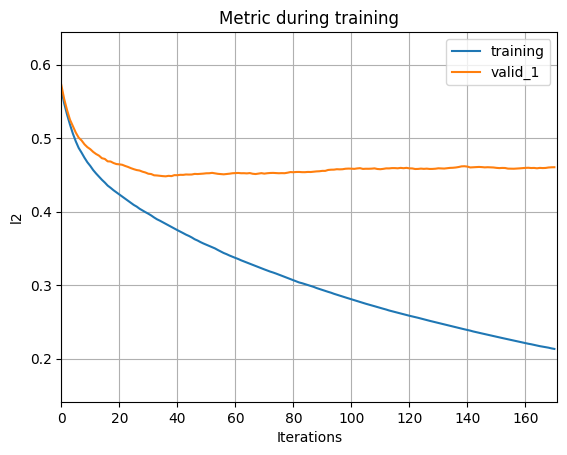

----> || Train Optimized QWK SCORE ::  0.581
----> || Val Optimized QWK SCORE ::  0.392
----> || Train Optimized Val QWK SCORE ::  0.466
----> || Val Optimized Train QWK SCORE ::  0.473
Fold 1 - Rounded Train QWK: 0.4517, Rounded Validation QWK: 0.3524


<Figure size 640x480 with 0 Axes>

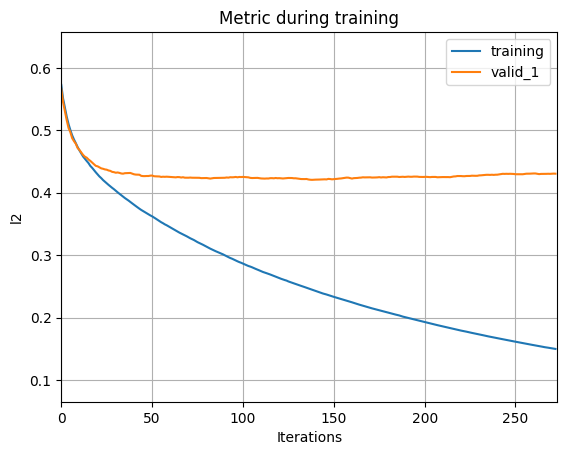

----> || Train Optimized QWK SCORE ::  0.784
----> || Val Optimized QWK SCORE ::  0.511
----> || Train Optimized Val QWK SCORE ::  0.483
----> || Val Optimized Train QWK SCORE ::  0.766
Fold 2 - Rounded Train QWK: 0.6698, Rounded Validation QWK: 0.4444


<Figure size 640x480 with 0 Axes>

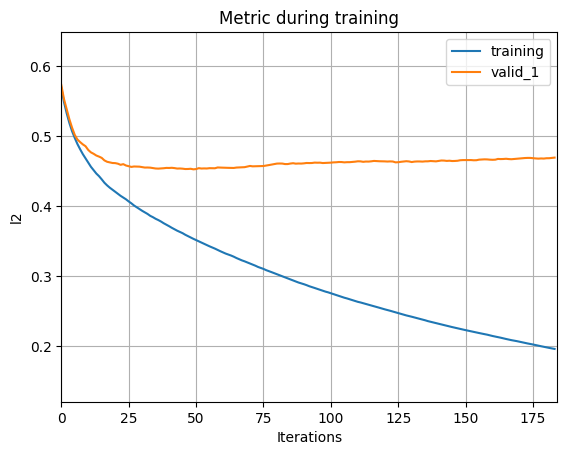

----> || Train Optimized QWK SCORE ::  0.633
----> || Val Optimized QWK SCORE ::  0.345
----> || Train Optimized Val QWK SCORE ::  0.491
----> || Val Optimized Train QWK SCORE ::  0.518
Fold 3 - Rounded Train QWK: 0.5166, Rounded Validation QWK: 0.3141


<Figure size 640x480 with 0 Axes>

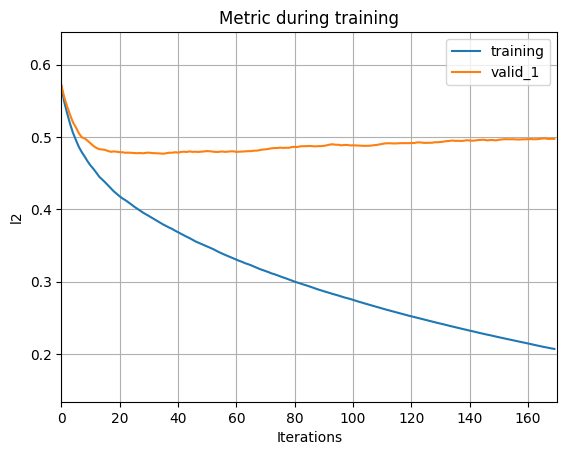

----> || Train Optimized QWK SCORE ::  0.584
----> || Val Optimized QWK SCORE ::  0.446
----> || Train Optimized Val QWK SCORE ::  0.414
----> || Val Optimized Train QWK SCORE ::  0.574
Fold 4 - Rounded Train QWK: 0.4605, Rounded Validation QWK: 0.3223


<Figure size 640x480 with 0 Axes>

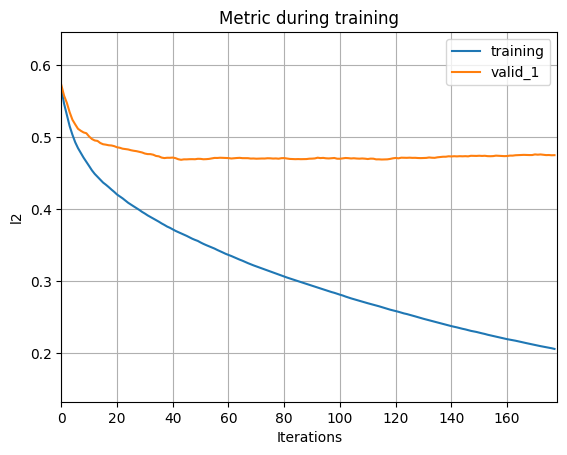

----> || Train Optimized QWK SCORE ::  0.608
----> || Val Optimized QWK SCORE ::  0.450
----> || Train Optimized Val QWK SCORE ::  0.427
----> || Val Optimized Train QWK SCORE ::  0.573
Fold 5 - Rounded Train QWK: 0.4716, Rounded Validation QWK: 0.3316
Mean Train QWK --> 0.6381
Mean Validation QWK ---> 0.4287
----> || Optimized QWK SCORE ::  0.472


In [71]:
lgb_models_list, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds, lgb_optuna_study = lgb_feature_selection(train_final_df, test_final_df, 150)

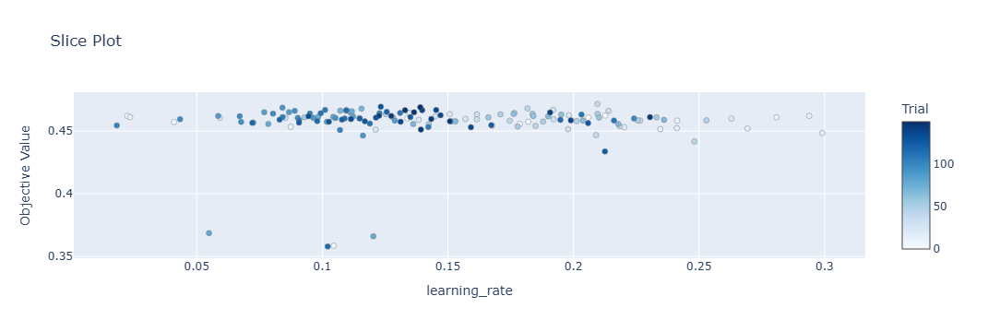

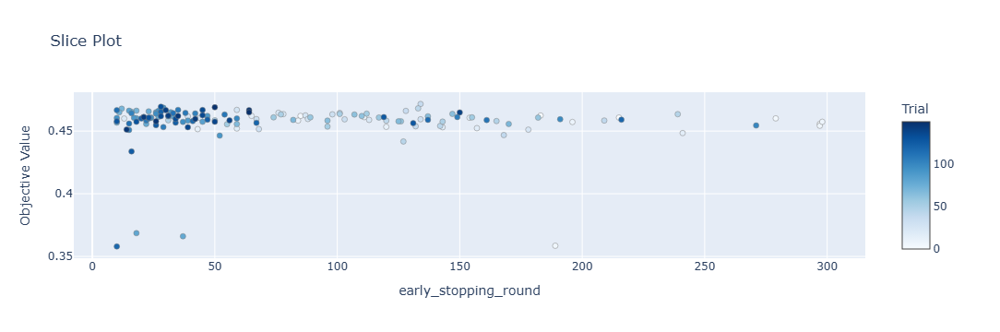

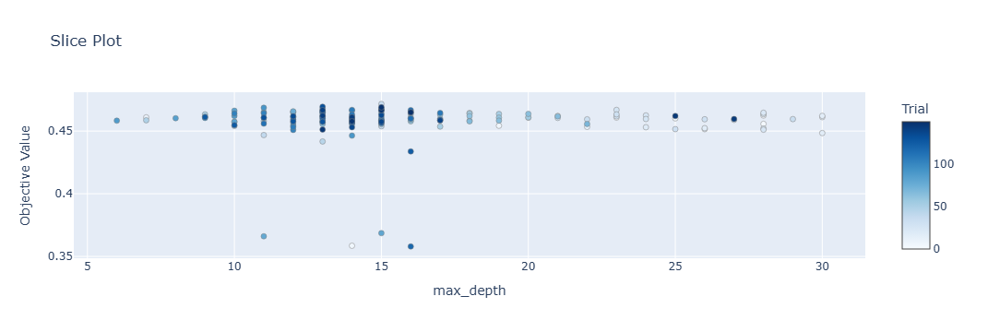

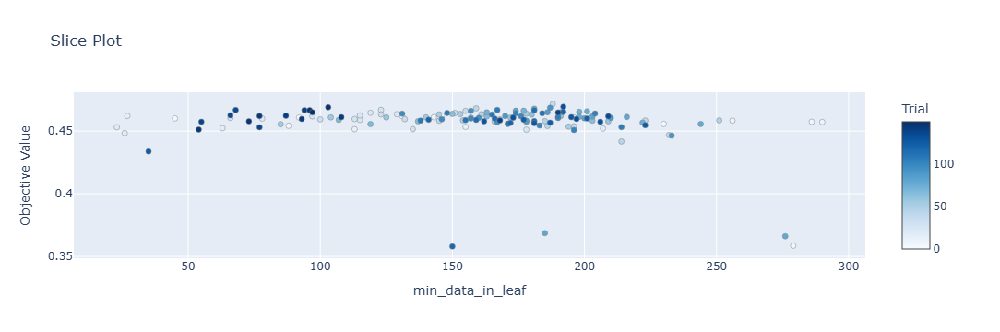

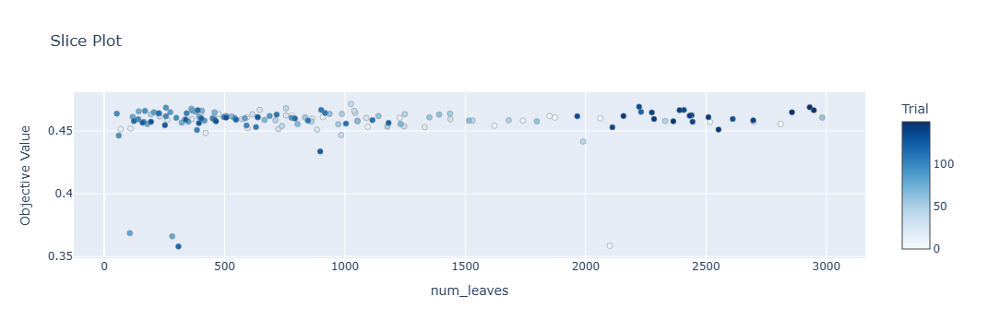

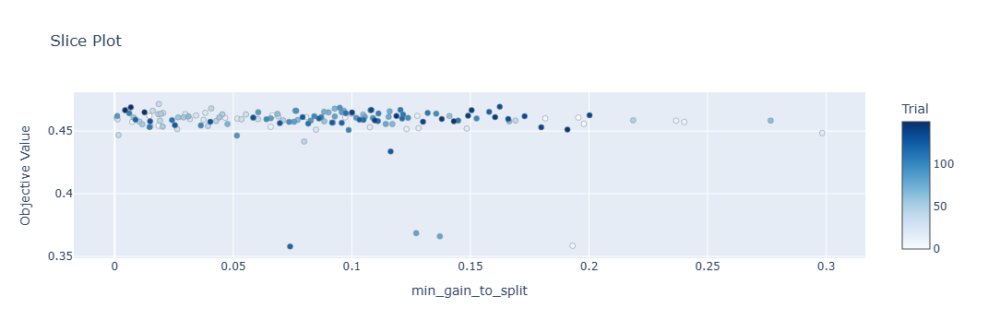

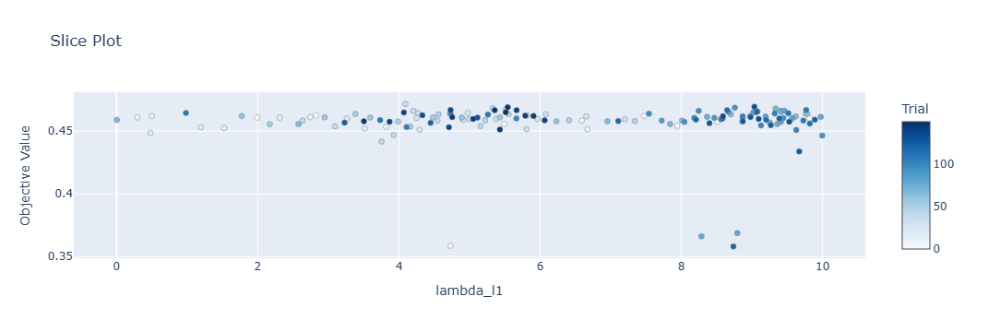

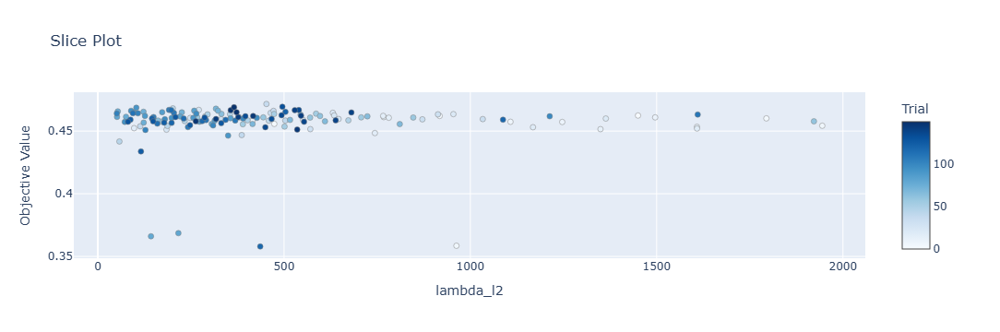

In [72]:
for param in lgb_optuna_study.best_params.keys():
    fig = plot_slice(lgb_optuna_study, params=[param])
    fig.show()

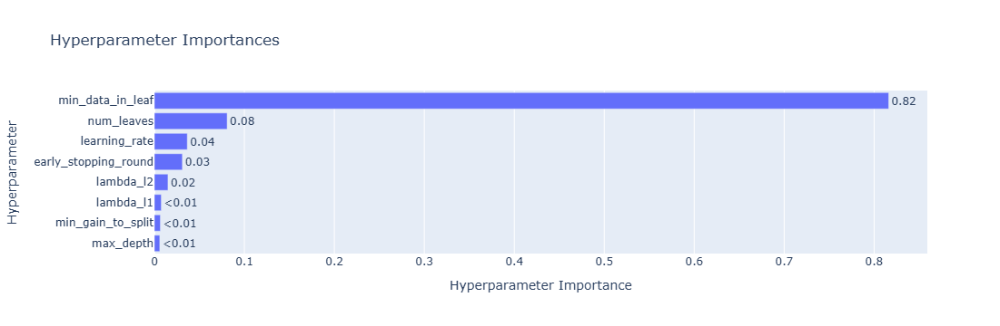

In [73]:
plot_param_importances(lgb_optuna_study)

In [74]:
lgb_optuna_study.best_params

{'learning_rate': 0.2095569665250619,
 'early_stopping_round': 134,
 'max_depth': 15,
 'min_data_in_leaf': 188,
 'num_leaves': 1025,
 'min_gain_to_split': 0.018625012698220558,
 'lambda_l1': 4.091605628287121,
 'lambda_l2': 452.647603773053}

In [75]:
cols = train_final_df.drop(['id', 'sii'], axis=1).columns
importance_list = []
for model in lgb_models_list:
    importance_list.append(model.feature_importances_)

importance_mean = np.mean(importance_list, axis=0)
imp_df = pd.DataFrame(sorted(zip(cols, importance_mean)), columns=['Feature', 'Importance']).sort_values('Importance', ascending=False)
unimportant_df = imp_df[imp_df['Importance'] < imp_df['Importance'].quantile(0.5)]
unimportant_cols = unimportant_df['Feature'].tolist()

In [76]:
train_selected_df = train_final_df.drop(unimportant_cols, axis=1)
print(train_selected_df.shape)
train_selected_df.head()

(2736, 731)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Time_Mins,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_PU_Zone,FGC-FGC_SRL,FGC-FGC_SRL_Zone,FGC-FGC_TL,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,FGC-FGC_CU_isnan,BIA-Season_isnan,PAQ_C-Season_isnan,X_99%,X_max,Y_99%,Y_max,Z_max,enmo_mean,enmo_std,enmo_10%,anglez_min,anglez_max,light_1%,light_max,battery_use_since_wear_std,battery_use_since_wear_10%,X_weekday_1_mean,X_weekday_1_min,X_weekday_1_max,X_weekday_2_max,X_weekday_3_mean,X_weekday_3_min,X_weekday_3_1%,X_weekday_3_max,X_weekday_3_entropy,X_weekday_4_mean,X_weekday_4_std,X_weekday_4_min,X_weekday_4_entropy,X_weekday_5_mean,X_weekday_5_entropy,X_weekday_6_min,X_weekday_6_1%,X_weekday_6_max,X_weekday_7_std,X_weekday_7_max,X_weekday_7_entropy,Y_weekday_1_mean,Y_weekday_1_min,Y_weekday_1_1%,Y_weekday_1_max,Y_weekday_1_sum,Y_weekday_2_mean,Y_weekday_2_sum,Y_weekday_2_entropy,Y_weekday_3_std,Y_weekday_3_min,Y_weekday_3_sum,Y_weekday_4_mean,Y_weekday_4_std,Y_weekday_4_min,Y_weekday_4_sum,Y_weekday_4_entropy,Y_weekday_5_std,Y_weekday_5_sum,Y_weekday_6_std,Y_weekday_6_sum,Y_weekday_6_entropy,Y_weekday_7_mean,Y_weekday_7_1%,Y_weekday_7_max,Y_weekday_7_sum,Y_weekday_7_entropy,Z_weekday_1_std,Z_weekday_1_min,Z_weekday_1_sum,Z_weekday_1_entropy,Z_weekday_2_min,Z_weekday_2_1%,Z_weekday_2_15%,Z_weekday_2_90%,Z_weekday_2_max,Z_weekday_2_entropy,Z_weekday_3_std,Z_weekday_3_min,Z_weekday_3_max,Z_weekday_3_sum,Z_weekday_3_entropy,Z_weekday_4_mean,Z_weekday_4_std,Z_weekday_4_min,Z_weekday_4_25%,Z_weekday_5_std,Z_weekday_5_min,Z_weekday_5_1%,Z_weekday_5_sum,Z_weekday_5_entropy,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_min,Z_weekday_6_95%,Z_weekday_6_max,Z_weekday_7_std,Z_weekday_7_max,Z_weekday_7_sum,enmo_weekday_1_mean,enmo_weekday_1_15%,enmo_weekday_1_entropy,enmo_weekday_2_mean,enmo_weekday_2_sum,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_3_max,enmo_weekday_4_mean,enmo_weekday_4_std,enmo_weekday_4_max,enmo_weekday_4_entropy,enmo_weekday_5_mean,enmo_weekday_6_mean,enmo_weekday_6_std,enmo_weekday_6_max,enmo_weekday_6_entropy,enmo_weekday_7_20%,anglez_weekday_1_max,anglez_weekday_1_entropy,anglez_weekday_3_min,anglez_weekday_3_max,anglez_weekday_3_entropy,light_weekday_1_mean,light_weekday_1_30%,light_weekday_1_sum,light_weekday_2_95%,light_weekday_2_sum,light_weekday_3_mean,light_weekday_3_15%,light_weekday_3_20%,light_weekday_3_80%,light_weekday_3_max,light_weekday_3_sum,light_weekday_4_mean,light_weekday_4_20%,light_weekday_4_max,light_weekday_4_entropy,light_weekday_5_mean,light_weekday_5_70%,light_weekday_5_max,light_weekday_5_entropy,light_weekday_6_max,light_weekday_6_sum,light_weekday_7_mean,light_weekday_7_max,battery_use_since_wear_weekday_1_mean,battery_use_since_wear_weekday_1_std,battery_use_since_wear_weekday_1_min,battery_use_since_wear_weekday_1_15%,battery_use_since_wear_weekday_1_30%,battery_use_since_wear_weekday_1_95%,battery_use_since_wear_weekday_1_max,battery_use_since_wear_weekday_2_std,battery_use_since_wear_weekday_2_min,battery_use_since_wear_weekday_2_30%,battery_use_since_wear_weekday_2_35%,battery_use_since_wear_weekday_2_99%,battery_use_since_wear_weekday_2_entropy,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_min,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_4_mean,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_4_15%,battery_use_since_wear_weekday_4_30%,battery_use_since_wear_weekday_4_35%,battery_use_since_wear_weekday_4_40%,battery_use_since_wear_weekday_4_max,battery_use_since_wear_weekday_5_std,battery_use_since_wear_weekday_5_min,battery_use_since_wear_weekday_5_10%,b

In [77]:
test_selected_df = test_final_df.drop(unimportant_cols, axis=1)
print(test_selected_df.shape)
test_selected_df.head()

(20, 730)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Time_Mins,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_PU_Zone,FGC-FGC_SRL,FGC-FGC_SRL_Zone,FGC-FGC_TL,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,FGC-FGC_CU_isnan,BIA-Season_isnan,PAQ_C-Season_isnan,X_99%,X_max,Y_99%,Y_max,Z_max,enmo_mean,enmo_std,enmo_10%,anglez_min,anglez_max,light_1%,light_max,battery_use_since_wear_std,battery_use_since_wear_10%,X_weekday_1_mean,X_weekday_1_min,X_weekday_1_max,X_weekday_2_max,X_weekday_3_mean,X_weekday_3_min,X_weekday_3_1%,X_weekday_3_max,X_weekday_3_entropy,X_weekday_4_mean,X_weekday_4_std,X_weekday_4_min,X_weekday_4_entropy,X_weekday_5_mean,X_weekday_5_entropy,X_weekday_6_min,X_weekday_6_1%,X_weekday_6_max,X_weekday_7_std,X_weekday_7_max,X_weekday_7_entropy,Y_weekday_1_mean,Y_weekday_1_min,Y_weekday_1_1%,Y_weekday_1_max,Y_weekday_1_sum,Y_weekday_2_mean,Y_weekday_2_sum,Y_weekday_2_entropy,Y_weekday_3_std,Y_weekday_3_min,Y_weekday_3_sum,Y_weekday_4_mean,Y_weekday_4_std,Y_weekday_4_min,Y_weekday_4_sum,Y_weekday_4_entropy,Y_weekday_5_std,Y_weekday_5_sum,Y_weekday_6_std,Y_weekday_6_sum,Y_weekday_6_entropy,Y_weekday_7_mean,Y_weekday_7_1%,Y_weekday_7_max,Y_weekday_7_sum,Y_weekday_7_entropy,Z_weekday_1_std,Z_weekday_1_min,Z_weekday_1_sum,Z_weekday_1_entropy,Z_weekday_2_min,Z_weekday_2_1%,Z_weekday_2_15%,Z_weekday_2_90%,Z_weekday_2_max,Z_weekday_2_entropy,Z_weekday_3_std,Z_weekday_3_min,Z_weekday_3_max,Z_weekday_3_sum,Z_weekday_3_entropy,Z_weekday_4_mean,Z_weekday_4_std,Z_weekday_4_min,Z_weekday_4_25%,Z_weekday_5_std,Z_weekday_5_min,Z_weekday_5_1%,Z_weekday_5_sum,Z_weekday_5_entropy,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_min,Z_weekday_6_95%,Z_weekday_6_max,Z_weekday_7_std,Z_weekday_7_max,Z_weekday_7_sum,enmo_weekday_1_mean,enmo_weekday_1_15%,enmo_weekday_1_entropy,enmo_weekday_2_mean,enmo_weekday_2_sum,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_3_max,enmo_weekday_4_mean,enmo_weekday_4_std,enmo_weekday_4_max,enmo_weekday_4_entropy,enmo_weekday_5_mean,enmo_weekday_6_mean,enmo_weekday_6_std,enmo_weekday_6_max,enmo_weekday_6_entropy,enmo_weekday_7_20%,anglez_weekday_1_max,anglez_weekday_1_entropy,anglez_weekday_3_min,anglez_weekday_3_max,anglez_weekday_3_entropy,light_weekday_1_mean,light_weekday_1_30%,light_weekday_1_sum,light_weekday_2_95%,light_weekday_2_sum,light_weekday_3_mean,light_weekday_3_15%,light_weekday_3_20%,light_weekday_3_80%,light_weekday_3_max,light_weekday_3_sum,light_weekday_4_mean,light_weekday_4_20%,light_weekday_4_max,light_weekday_4_entropy,light_weekday_5_mean,light_weekday_5_70%,light_weekday_5_max,light_weekday_5_entropy,light_weekday_6_max,light_weekday_6_sum,light_weekday_7_mean,light_weekday_7_max,battery_use_since_wear_weekday_1_mean,battery_use_since_wear_weekday_1_std,battery_use_since_wear_weekday_1_min,battery_use_since_wear_weekday_1_15%,battery_use_since_wear_weekday_1_30%,battery_use_since_wear_weekday_1_95%,battery_use_since_wear_weekday_1_max,battery_use_since_wear_weekday_2_std,battery_use_since_wear_weekday_2_min,battery_use_since_wear_weekday_2_30%,battery_use_since_wear_weekday_2_35%,battery_use_since_wear_weekday_2_99%,battery_use_since_wear_weekday_2_entropy,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_min,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_4_mean,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_4_15%,battery_use_since_wear_weekday_4_30%,battery_use_since_wear_weekday_4_35%,battery_use_since_wear_weekday_4_40%,battery_use_since_wear_weekday_4_max,battery_use_since_wear_weekday_5_std,battery_use_since_wear_weekday_5_min,battery_use_since_wear_weekday_5_10%,b

[I 2024-12-15 12:42:36,692] A new study created in memory with name: no-name-481796cc-e34b-4715-94cc-a61e6fc0032a
[I 2024-12-15 12:42:49,518] Trial 0 finished with value: 0.47085453807486966 and parameters: {'learning_rate': 0.024912607029891773, 'early_stopping_round': 103, 'max_depth': 13, 'min_data_in_leaf': 95, 'num_leaves': 1080, 'min_gain_to_split': 0.2934217668780734, 'lambda_l1': 1.315791404197203, 'lambda_l2': 746.8343651326111}. Best is trial 0 with value: 0.47085453807486966.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-15 12:42:59,297] Trial 1 finished with value: 0.45746608891419327 and parameters: {'learning_rate': 0.04160784776870214, 'early_stopping_round': 171, 'max_depth': 20, 'min_data_in_leaf': 206, 'num_leaves': 617, 'min_gain_to_split': 0.17630062257779192, 'lambda_l1': 3.4563198301044418, 'lambda_l2': 1948.6657279316496}. Best is trial 0 with value: 0.47085453807486966.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-15 12:43:04,814] Trial 2 finished with value: 0.46181977254332574 and parameters: {'learning_rate': 0.1680734808977764, 'early_stopping_round': 290, 'max_depth': 9, 'min_data_in_leaf': 39, 'num_leaves': 593, 'min_gain_to_split': 0.2274211162213267, 'lambda_l1': 5.211650524516486, 'lambda_l2': 1481.2054466673037}. Best is trial 0 with value: 0.47085453807486966.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:43:13,391] Trial 3 finished with value: 0.4705274567205907 and parameters: {'learning_rate': 0.24381129365456083, 'early_stopping_round': 261, 'max_depth': 15, 'min_data_in_leaf': 108, 'num_leaves': 2112, 'min_gain_to_split': 0.13138215449379795, 'lambda_l1': 2.090090528463202, 'lambda_l2': 1073.377134037675}. Best is trial 0 with value: 0.47085453807486966.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-15 12:43:20,337] Trial 4 finished with value: 0.36561978773214454 and parameters: {'learning_rate': 0.2536772254120863, 'early_stopping_round': 168, 'max_depth': 18, 'min_data_in_leaf': 268, 'num_leaves': 2296, 'min_gain_to_split': 0.1718061090349297, 'lambda_l1': 8.482058852344878, 'lambda_l2': 1292.8724281202803}. Best is trial 0 with value: 0.47085453807486966.


----> || Optimized QWK SCORE ::  0.366


[I 2024-12-15 12:43:24,601] Trial 5 finished with value: 0.45737304365053166 and parameters: {'learning_rate': 0.16966832656601813, 'early_stopping_round': 21, 'max_depth': 11, 'min_data_in_leaf': 292, 'num_leaves': 883, 'min_gain_to_split': 0.024705645057577563, 'lambda_l1': 3.09119082086617, 'lambda_l2': 1994.4445024418167}. Best is trial 0 with value: 0.47085453807486966.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-15 12:43:31,300] Trial 6 finished with value: 0.4614385386702582 and parameters: {'learning_rate': 0.10849870347657957, 'early_stopping_round': 177, 'max_depth': 16, 'min_data_in_leaf': 168, 'num_leaves': 1564, 'min_gain_to_split': 0.2182896230692415, 'lambda_l1': 7.516470409344579, 'lambda_l2': 672.9654185473686}. Best is trial 0 with value: 0.47085453807486966.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:43:36,089] Trial 7 finished with value: 0.4622213249716163 and parameters: {'learning_rate': 0.09725813599272491, 'early_stopping_round': 216, 'max_depth': 16, 'min_data_in_leaf': 146, 'num_leaves': 502, 'min_gain_to_split': 0.2861146312196255, 'lambda_l1': 9.876959511708407, 'lambda_l2': 1843.4695821662233}. Best is trial 0 with value: 0.47085453807486966.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:43:45,337] Trial 8 finished with value: 0.45219866922411633 and parameters: {'learning_rate': 0.17798969783498728, 'early_stopping_round': 261, 'max_depth': 25, 'min_data_in_leaf': 257, 'num_leaves': 2614, 'min_gain_to_split': 0.06967440295507508, 'lambda_l1': 8.581034938710753, 'lambda_l2': 1179.2562815552656}. Best is trial 0 with value: 0.47085453807486966.


----> || Optimized QWK SCORE ::  0.452


[I 2024-12-15 12:43:48,855] Trial 9 finished with value: 0.44277691887136084 and parameters: {'learning_rate': 0.17569085885750196, 'early_stopping_round': 100, 'max_depth': 21, 'min_data_in_leaf': 254, 'num_leaves': 213, 'min_gain_to_split': 0.1966556779081234, 'lambda_l1': 6.764081320315904, 'lambda_l2': 1751.7126934294295}. Best is trial 0 with value: 0.47085453807486966.


----> || Optimized QWK SCORE ::  0.443


[I 2024-12-15 12:44:14,353] Trial 10 finished with value: 0.45956032238843414 and parameters: {'learning_rate': 0.014009347835811946, 'early_stopping_round': 91, 'max_depth': 25, 'min_data_in_leaf': 30, 'num_leaves': 1350, 'min_gain_to_split': 0.2795382121028523, 'lambda_l1': 0.031553852682066896, 'lambda_l2': 87.37259766509419}. Best is trial 0 with value: 0.47085453807486966.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:44:21,238] Trial 11 finished with value: 0.4651726835711405 and parameters: {'learning_rate': 0.29396097748215816, 'early_stopping_round': 94, 'max_depth': 12, 'min_data_in_leaf': 96, 'num_leaves': 1904, 'min_gain_to_split': 0.09852531523012031, 'lambda_l1': 0.3604262718417497, 'lambda_l2': 829.6467952253107}. Best is trial 0 with value: 0.47085453807486966.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-15 12:44:29,658] Trial 12 finished with value: 0.47163967170593635 and parameters: {'learning_rate': 0.2297626240692974, 'early_stopping_round': 38, 'max_depth': 7, 'min_data_in_leaf': 93, 'num_leaves': 2875, 'min_gain_to_split': 0.10398918551768127, 'lambda_l1': 1.8903460007358417, 'lambda_l2': 492.2208063100327}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-15 12:44:37,231] Trial 13 finished with value: 0.4558317101675107 and parameters: {'learning_rate': 0.2320183463315654, 'early_stopping_round': 12, 'max_depth': 6, 'min_data_in_leaf': 81, 'num_leaves': 2939, 'min_gain_to_split': 0.1224641889484809, 'lambda_l1': 1.747702246987053, 'lambda_l2': 363.3674432277801}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-15 12:44:43,962] Trial 14 finished with value: 0.46102581616357796 and parameters: {'learning_rate': 0.0882036156224694, 'early_stopping_round': 53, 'max_depth': 6, 'min_data_in_leaf': 142, 'num_leaves': 1340, 'min_gain_to_split': 0.0009778842805940324, 'lambda_l1': 4.500519943845088, 'lambda_l2': 522.0798452279336}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:44:51,014] Trial 15 finished with value: 0.46117584433540126 and parameters: {'learning_rate': 0.21438596124304402, 'early_stopping_round': 123, 'max_depth': 10, 'min_data_in_leaf': 58, 'num_leaves': 1015, 'min_gain_to_split': 0.06740626967443636, 'lambda_l1': 1.7583403858707864, 'lambda_l2': 261.0754503133636}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:44:57,403] Trial 16 finished with value: 0.46373692055109594 and parameters: {'learning_rate': 0.1356710754955568, 'early_stopping_round': 52, 'max_depth': 8, 'min_data_in_leaf': 118, 'num_leaves': 1796, 'min_gain_to_split': 0.25005643476711287, 'lambda_l1': 1.2150398198763481, 'lambda_l2': 904.9294342919823}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:45:07,610] Trial 17 finished with value: 0.4642683519688867 and parameters: {'learning_rate': 0.060894264156881754, 'early_stopping_round': 58, 'max_depth': 14, 'min_data_in_leaf': 203, 'num_leaves': 2912, 'min_gain_to_split': 0.07962412966739471, 'lambda_l1': 3.199937967454867, 'lambda_l2': 657.5160411446882}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:45:12,935] Trial 18 finished with value: 0.46220086209414 and parameters: {'learning_rate': 0.2914560986584449, 'early_stopping_round': 133, 'max_depth': 29, 'min_data_in_leaf': 74, 'num_leaves': 1026, 'min_gain_to_split': 0.1466944298206322, 'lambda_l1': 5.284523021974576, 'lambda_l2': 455.4981578623622}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:45:19,958] Trial 19 finished with value: 0.4566335841333611 and parameters: {'learning_rate': 0.20807166970759472, 'early_stopping_round': 68, 'max_depth': 13, 'min_data_in_leaf': 180, 'num_leaves': 2477, 'min_gain_to_split': 0.04200739361741142, 'lambda_l1': 4.028803003776336, 'lambda_l2': 114.88964562347462}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-15 12:45:25,234] Trial 20 finished with value: 0.4662685854614764 and parameters: {'learning_rate': 0.12281645453436327, 'early_stopping_round': 135, 'max_depth': 8, 'min_data_in_leaf': 123, 'num_leaves': 57, 'min_gain_to_split': 0.1118450343363475, 'lambda_l1': 2.466389217427869, 'lambda_l2': 758.6061735830942}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 12:45:33,883] Trial 21 finished with value: 0.45890650853271175 and parameters: {'learning_rate': 0.2599301386189102, 'early_stopping_round': 222, 'max_depth': 15, 'min_data_in_leaf': 106, 'num_leaves': 2135, 'min_gain_to_split': 0.13771484832651987, 'lambda_l1': 1.0507586323320313, 'lambda_l2': 1061.3306025451307}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-15 12:45:43,275] Trial 22 finished with value: 0.4708244828017064 and parameters: {'learning_rate': 0.2603407680969821, 'early_stopping_round': 219, 'max_depth': 19, 'min_data_in_leaf': 62, 'num_leaves': 2605, 'min_gain_to_split': 0.16935053087731167, 'lambda_l1': 2.383909788130286, 'lambda_l2': 998.8568132614504}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-15 12:45:51,468] Trial 23 finished with value: 0.4622747890966128 and parameters: {'learning_rate': 0.27229394703592424, 'early_stopping_round': 203, 'max_depth': 19, 'min_data_in_leaf': 50, 'num_leaves': 2686, 'min_gain_to_split': 0.2984570785242756, 'lambda_l1': 0.8287685269440365, 'lambda_l2': 1372.2664177205584}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:45:59,923] Trial 24 finished with value: 0.45742073296780106 and parameters: {'learning_rate': 0.20563430598829613, 'early_stopping_round': 26, 'max_depth': 22, 'min_data_in_leaf': 76, 'num_leaves': 2995, 'min_gain_to_split': 0.2548084215683676, 'lambda_l1': 2.580307974275315, 'lambda_l2': 949.226168919653}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-15 12:46:09,706] Trial 25 finished with value: 0.45366873113611594 and parameters: {'learning_rate': 0.14534530467052884, 'early_stopping_round': 115, 'max_depth': 23, 'min_data_in_leaf': 60, 'num_leaves': 2405, 'min_gain_to_split': 0.16900485339111823, 'lambda_l1': 1.3594545819776782, 'lambda_l2': 535.0021458416711}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.454


[I 2024-12-15 12:46:19,371] Trial 26 finished with value: 0.45146285704699796 and parameters: {'learning_rate': 0.22431369762275377, 'early_stopping_round': 200, 'max_depth': 17, 'min_data_in_leaf': 26, 'num_leaves': 2709, 'min_gain_to_split': 0.09649358259268309, 'lambda_l1': 6.3650168666002696, 'lambda_l2': 282.5494303218594}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.451


[I 2024-12-15 12:46:25,602] Trial 27 finished with value: 0.45799305219811504 and parameters: {'learning_rate': 0.27380836190418956, 'early_stopping_round': 150, 'max_depth': 13, 'min_data_in_leaf': 91, 'num_leaves': 1689, 'min_gain_to_split': 0.1972396827069539, 'lambda_l1': 4.037885660541706, 'lambda_l2': 653.4499730728015}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:46:33,401] Trial 28 finished with value: 0.46464879091955913 and parameters: {'learning_rate': 0.0656594872660113, 'early_stopping_round': 77, 'max_depth': 11, 'min_data_in_leaf': 139, 'num_leaves': 1219, 'min_gain_to_split': 0.25725289164727094, 'lambda_l1': 0.6409991781068514, 'lambda_l2': 1516.3504553757327}. Best is trial 12 with value: 0.47163967170593635.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-15 12:46:50,308] Trial 29 finished with value: 0.47282425361027325 and parameters: {'learning_rate': 0.022749401735986677, 'early_stopping_round': 35, 'max_depth': 20, 'min_data_in_leaf': 67, 'num_leaves': 2091, 'min_gain_to_split': 0.15929349997873057, 'lambda_l1': 2.7277019467512886, 'lambda_l2': 805.4895020280437}. Best is trial 29 with value: 0.47282425361027325.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-15 12:47:04,674] Trial 30 finished with value: 0.4634108338934656 and parameters: {'learning_rate': 0.024613310723638916, 'early_stopping_round': 38, 'max_depth': 30, 'min_data_in_leaf': 125, 'num_leaves': 2018, 'min_gain_to_split': 0.0520039471147067, 'lambda_l1': 3.5478032281117478, 'lambda_l2': 801.0206023250415}. Best is trial 29 with value: 0.47282425361027325.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-15 12:47:19,779] Trial 31 finished with value: 0.46301841471736904 and parameters: {'learning_rate': 0.036023862210952426, 'early_stopping_round': 41, 'max_depth': 20, 'min_data_in_leaf': 62, 'num_leaves': 2300, 'min_gain_to_split': 0.1531239110104955, 'lambda_l1': 2.426276527689802, 'lambda_l2': 969.6946635059288}. Best is trial 29 with value: 0.47282425361027325.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-15 12:47:35,849] Trial 32 finished with value: 0.46091692748417634 and parameters: {'learning_rate': 0.03946447426311044, 'early_stopping_round': 79, 'max_depth': 19, 'min_data_in_leaf': 40, 'num_leaves': 2595, 'min_gain_to_split': 0.2107934598906472, 'lambda_l1': 3.0020934390285072, 'lambda_l2': 1137.2167963570162}. Best is trial 29 with value: 0.47282425361027325.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:47:46,084] Trial 33 finished with value: 0.4686171057507367 and parameters: {'learning_rate': 0.0629941561474273, 'early_stopping_round': 256, 'max_depth': 18, 'min_data_in_leaf': 94, 'num_leaves': 768, 'min_gain_to_split': 0.19064747586918324, 'lambda_l1': 2.165336347640725, 'lambda_l2': 592.2459759008418}. Best is trial 29 with value: 0.47282425361027325.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-15 12:47:57,296] Trial 34 finished with value: 0.46149982366331443 and parameters: {'learning_rate': 0.19647994289741186, 'early_stopping_round': 283, 'max_depth': 24, 'min_data_in_leaf': 21, 'num_leaves': 2808, 'min_gain_to_split': 0.15262566248716639, 'lambda_l1': 1.7699925157868268, 'lambda_l2': 773.9173498864188}. Best is trial 29 with value: 0.47282425361027325.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:48:04,208] Trial 35 finished with value: 0.45613035039509864 and parameters: {'learning_rate': 0.24291638211223227, 'early_stopping_round': 172, 'max_depth': 21, 'min_data_in_leaf': 73, 'num_leaves': 2098, 'min_gain_to_split': 0.2366258195760777, 'lambda_l1': 5.229294825768386, 'lambda_l2': 454.5568533396981}. Best is trial 29 with value: 0.47282425361027325.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-15 12:48:12,991] Trial 36 finished with value: 0.4600412872376226 and parameters: {'learning_rate': 0.08021546454595735, 'early_stopping_round': 10, 'max_depth': 27, 'min_data_in_leaf': 45, 'num_leaves': 2269, 'min_gain_to_split': 0.1724794947985634, 'lambda_l1': 3.5966456110276463, 'lambda_l2': 1289.8878888414527}. Best is trial 29 with value: 0.47282425361027325.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:48:50,464] Trial 37 finished with value: 0.4691528435694031 and parameters: {'learning_rate': 0.011109400145026194, 'early_stopping_round': 242, 'max_depth': 9, 'min_data_in_leaf': 107, 'num_leaves': 2465, 'min_gain_to_split': 0.11870272613339045, 'lambda_l1': 2.7997971295901314, 'lambda_l2': 868.4609483328818}. Best is trial 29 with value: 0.47282425361027325.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-15 12:48:57,850] Trial 38 finished with value: 0.4598561383951911 and parameters: {'learning_rate': 0.1931233548393812, 'early_stopping_round': 154, 'max_depth': 17, 'min_data_in_leaf': 170, 'num_leaves': 1572, 'min_gain_to_split': 0.09256317070636623, 'lambda_l1': 1.5132872278935334, 'lambda_l2': 706.5117083639484}. Best is trial 29 with value: 0.47282425361027325.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:49:08,594] Trial 39 finished with value: 0.4671349891657889 and parameters: {'learning_rate': 0.1135423008482205, 'early_stopping_round': 298, 'max_depth': 15, 'min_data_in_leaf': 91, 'num_leaves': 2784, 'min_gain_to_split': 0.2264918950437243, 'lambda_l1': 4.598643877026188, 'lambda_l2': 1048.8001011135348}. Best is trial 29 with value: 0.47282425361027325.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-15 12:49:22,178] Trial 40 finished with value: 0.4632658327177098 and parameters: {'learning_rate': 0.04805740012097212, 'early_stopping_round': 36, 'max_depth': 20, 'min_data_in_leaf': 60, 'num_leaves': 2534, 'min_gain_to_split': 0.18115589777587543, 'lambda_l1': 2.168514703281797, 'lambda_l2': 1205.744767441138}. Best is trial 29 with value: 0.47282425361027325.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-15 12:49:31,941] Trial 41 finished with value: 0.4694504191589459 and parameters: {'learning_rate': 0.25280674634217826, 'early_stopping_round': 277, 'max_depth': 16, 'min_data_in_leaf': 109, 'num_leaves': 2238, 'min_gain_to_split': 0.13293169062004032, 'lambda_l1': 0.021808826951546623, 'lambda_l2': 1064.7319664987908}. Best is trial 29 with value: 0.47282425361027325.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-15 12:49:41,368] Trial 42 finished with value: 0.4622877620570741 and parameters: {'learning_rate': 0.23301815708360346, 'early_stopping_round': 234, 'max_depth': 18, 'min_data_in_leaf': 133, 'num_leaves': 1970, 'min_gain_to_split': 0.1077835225838718, 'lambda_l1': 2.1500895723723383, 'lambda_l2': 1583.3772497334705}. Best is trial 29 with value: 0.47282425361027325.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:49:47,493] Trial 43 finished with value: 0.4756632883609838 and parameters: {'learning_rate': 0.2768014762825226, 'early_stopping_round': 264, 'max_depth': 12, 'min_data_in_leaf': 87, 'num_leaves': 483, 'min_gain_to_split': 0.12346015470880188, 'lambda_l1': 0.6768154757148717, 'lambda_l2': 891.1471720784664}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-15 12:49:52,525] Trial 44 finished with value: 0.4685887530697277 and parameters: {'learning_rate': 0.279589173783837, 'early_stopping_round': 187, 'max_depth': 11, 'min_data_in_leaf': 153, 'num_leaves': 503, 'min_gain_to_split': 0.16096370923585368, 'lambda_l1': 0.6784382398009248, 'lambda_l2': 952.2662319893444}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-15 12:49:58,034] Trial 45 finished with value: 0.4727203483847465 and parameters: {'learning_rate': 0.2969707358851765, 'early_stopping_round': 271, 'max_depth': 7, 'min_data_in_leaf': 83, 'num_leaves': 364, 'min_gain_to_split': 0.12763335350731989, 'lambda_l1': 0.3371759111143977, 'lambda_l2': 724.1827023777739}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-15 12:50:04,260] Trial 46 finished with value: 0.46554841249695667 and parameters: {'learning_rate': 0.2894858020732584, 'early_stopping_round': 273, 'max_depth': 7, 'min_data_in_leaf': 84, 'num_leaves': 281, 'min_gain_to_split': 0.07903927149483819, 'lambda_l1': 0.43301421303901505, 'lambda_l2': 569.1395172503156}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 12:50:09,875] Trial 47 finished with value: 0.45606361829025843 and parameters: {'learning_rate': 0.298465138501174, 'early_stopping_round': 253, 'max_depth': 9, 'min_data_in_leaf': 111, 'num_leaves': 691, 'min_gain_to_split': 0.12828877663788146, 'lambda_l1': 0.9419356357557482, 'lambda_l2': 454.37476393040345}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-15 12:50:13,872] Trial 48 finished with value: 0.4556483959772736 and parameters: {'learning_rate': 0.15268428626701777, 'early_stopping_round': 109, 'max_depth': 7, 'min_data_in_leaf': 225, 'num_leaves': 310, 'min_gain_to_split': 0.27122347569650396, 'lambda_l1': 0.2606844651633211, 'lambda_l2': 857.9669529080056}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-15 12:50:20,608] Trial 49 finished with value: 0.4501124350633079 and parameters: {'learning_rate': 0.025258838653487544, 'early_stopping_round': 78, 'max_depth': 10, 'min_data_in_leaf': 290, 'num_leaves': 389, 'min_gain_to_split': 0.13968166805275117, 'lambda_l1': 1.6131059684005873, 'lambda_l2': 346.23351565594623}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.450


[I 2024-12-15 12:50:26,521] Trial 50 finished with value: 0.4660367956168515 and parameters: {'learning_rate': 0.2809684383254924, 'early_stopping_round': 94, 'max_depth': 12, 'min_data_in_leaf': 100, 'num_leaves': 919, 'min_gain_to_split': 0.04950815253700981, 'lambda_l1': 1.1541478570959673, 'lambda_l2': 741.8778574333254}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 12:50:33,842] Trial 51 finished with value: 0.4669778408680798 and parameters: {'learning_rate': 0.2527572930643486, 'early_stopping_round': 267, 'max_depth': 6, 'min_data_in_leaf': 71, 'num_leaves': 1184, 'min_gain_to_split': 0.10652536423387926, 'lambda_l1': 1.8515960350191834, 'lambda_l2': 678.8196094509544}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-15 12:50:39,493] Trial 52 finished with value: 0.4612390712886997 and parameters: {'learning_rate': 0.26440959113033763, 'early_stopping_round': 231, 'max_depth': 8, 'min_data_in_leaf': 49, 'num_leaves': 75, 'min_gain_to_split': 0.1241068166630319, 'lambda_l1': 1.312701093687699, 'lambda_l2': 988.3545633897862}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:50:44,694] Trial 53 finished with value: 0.4629981219404563 and parameters: {'learning_rate': 0.24193889483111397, 'early_stopping_round': 243, 'max_depth': 14, 'min_data_in_leaf': 85, 'num_leaves': 503, 'min_gain_to_split': 0.20965860886369708, 'lambda_l1': 0.405399313648225, 'lambda_l2': 611.4101646789213}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-15 12:50:49,996] Trial 54 finished with value: 0.45373547084112 and parameters: {'learning_rate': 0.28641827189133773, 'early_stopping_round': 283, 'max_depth': 10, 'min_data_in_leaf': 35, 'num_leaves': 618, 'min_gain_to_split': 0.08263451198006333, 'lambda_l1': 9.99259673977657, 'lambda_l2': 891.013446126545}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.454


[I 2024-12-15 12:50:56,411] Trial 55 finished with value: 0.46373907787930535 and parameters: {'learning_rate': 0.2659687961794152, 'early_stopping_round': 62, 'max_depth': 7, 'min_data_in_leaf': 66, 'num_leaves': 1818, 'min_gain_to_split': 0.15982495501477, 'lambda_l1': 5.948957417347298, 'lambda_l2': 816.5296862816709}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:51:02,609] Trial 56 finished with value: 0.45750456743686196 and parameters: {'learning_rate': 0.2215047545306711, 'early_stopping_round': 215, 'max_depth': 22, 'min_data_in_leaf': 119, 'num_leaves': 1341, 'min_gain_to_split': 0.11762253810294629, 'lambda_l1': 9.412074325145202, 'lambda_l2': 1133.9034288736275}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:51:06,894] Trial 57 finished with value: 0.46801980947256017 and parameters: {'learning_rate': 0.18156047524639518, 'early_stopping_round': 23, 'max_depth': 13, 'min_data_in_leaf': 81, 'num_leaves': 790, 'min_gain_to_split': 0.013716161095716994, 'lambda_l1': 0.8767383294840912, 'lambda_l2': 172.1006044606604}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-15 12:51:13,387] Trial 58 finished with value: 0.4646270369917803 and parameters: {'learning_rate': 0.29859704415015426, 'early_stopping_round': 298, 'max_depth': 19, 'min_data_in_leaf': 101, 'num_leaves': 942, 'min_gain_to_split': 0.06488476009503792, 'lambda_l1': 2.807675223942514, 'lambda_l2': 380.754478695216}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-15 12:51:22,309] Trial 59 finished with value: 0.4615755581950268 and parameters: {'learning_rate': 0.25879207874952714, 'early_stopping_round': 46, 'max_depth': 17, 'min_data_in_leaf': 50, 'num_leaves': 2880, 'min_gain_to_split': 0.14222638726327247, 'lambda_l1': 3.284607184958014, 'lambda_l2': 499.6470555907679}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:51:31,716] Trial 60 finished with value: 0.36678187758072034 and parameters: {'learning_rate': 0.05242867669535733, 'early_stopping_round': 184, 'max_depth': 12, 'min_data_in_leaf': 129, 'num_leaves': 178, 'min_gain_to_split': 0.09004581391067933, 'lambda_l1': 8.009410564699188, 'lambda_l2': 710.5616513678738}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.367


[I 2024-12-15 12:51:41,812] Trial 61 finished with value: 0.46088316493660697 and parameters: {'learning_rate': 0.2419830868334608, 'early_stopping_round': 258, 'max_depth': 14, 'min_data_in_leaf': 82, 'num_leaves': 2393, 'min_gain_to_split': 0.1301153796031876, 'lambda_l1': 2.0300986717446765, 'lambda_l2': 1229.7121552798098}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:51:49,887] Trial 62 finished with value: 0.4709920236084083 and parameters: {'learning_rate': 0.27469504309667847, 'early_stopping_round': 269, 'max_depth': 15, 'min_data_in_leaf': 115, 'num_leaves': 1611, 'min_gain_to_split': 0.10606152694079866, 'lambda_l1': 2.5659371112075973, 'lambda_l2': 1012.0142126544896}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-15 12:51:57,068] Trial 63 finished with value: 0.46385366932765726 and parameters: {'learning_rate': 0.269053490098088, 'early_stopping_round': 248, 'max_depth': 16, 'min_data_in_leaf': 116, 'num_leaves': 1121, 'min_gain_to_split': 0.1021829271085475, 'lambda_l1': 2.46718154689905, 'lambda_l2': 1009.6697959020928}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:52:04,057] Trial 64 finished with value: 0.46187240519218853 and parameters: {'learning_rate': 0.2795248545363283, 'early_stopping_round': 265, 'max_depth': 14, 'min_data_in_leaf': 69, 'num_leaves': 1495, 'min_gain_to_split': 0.1825091855179032, 'lambda_l1': 1.4740281042739156, 'lambda_l2': 916.5985563545817}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:52:19,382] Trial 65 finished with value: 0.4621034585803935 and parameters: {'learning_rate': 0.029085927292094343, 'early_stopping_round': 143, 'max_depth': 15, 'min_data_in_leaf': 92, 'num_leaves': 1434, 'min_gain_to_split': 0.11205084519156916, 'lambda_l1': 3.6708747568042135, 'lambda_l2': 777.2297086218871}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:52:27,133] Trial 66 finished with value: 0.46076699054730685 and parameters: {'learning_rate': 0.25316726934730577, 'early_stopping_round': 224, 'max_depth': 9, 'min_data_in_leaf': 101, 'num_leaves': 1667, 'min_gain_to_split': 0.15980704997519093, 'lambda_l1': 1.128790018919985, 'lambda_l2': 1122.7278040617723}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:52:31,945] Trial 67 finished with value: 0.46123232908146294 and parameters: {'learning_rate': 0.2875048228729128, 'early_stopping_round': 290, 'max_depth': 10, 'min_data_in_leaf': 76, 'num_leaves': 392, 'min_gain_to_split': 0.1470431377821846, 'lambda_l1': 3.9768896907029694, 'lambda_l2': 639.1732338165808}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:52:43,423] Trial 68 finished with value: 0.46432863167419147 and parameters: {'learning_rate': 0.07735645562431348, 'early_stopping_round': 204, 'max_depth': 21, 'min_data_in_leaf': 57, 'num_leaves': 2698, 'min_gain_to_split': 0.29605279133475965, 'lambda_l1': 2.725728656163922, 'lambda_l2': 837.0159287569477}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:52:52,326] Trial 69 finished with value: 0.4611718551021229 and parameters: {'learning_rate': 0.09926734252894528, 'early_stopping_round': 161, 'max_depth': 8, 'min_data_in_leaf': 148, 'num_leaves': 1787, 'min_gain_to_split': 0.08612428998363156, 'lambda_l1': 0.6141894499885691, 'lambda_l2': 939.6705843242187}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:53:00,562] Trial 70 finished with value: 0.4603446664254255 and parameters: {'learning_rate': 0.16409916023618298, 'early_stopping_round': 30, 'max_depth': 11, 'min_data_in_leaf': 91, 'num_leaves': 2619, 'min_gain_to_split': 0.06491421922288985, 'lambda_l1': 3.035597670856741, 'lambda_l2': 724.7212782654735}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:53:10,621] Trial 71 finished with value: 0.46874459419081915 and parameters: {'learning_rate': 0.23001401660474072, 'early_stopping_round': 265, 'max_depth': 13, 'min_data_in_leaf': 109, 'num_leaves': 2148, 'min_gain_to_split': 0.11509640217792338, 'lambda_l1': 1.7817802462723142, 'lambda_l2': 1102.5571932727423}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-15 12:53:19,781] Trial 72 finished with value: 0.46030085437570345 and parameters: {'learning_rate': 0.24717151666247084, 'early_stopping_round': 276, 'max_depth': 19, 'min_data_in_leaf': 136, 'num_leaves': 1908, 'min_gain_to_split': 0.09816295147940352, 'lambda_l1': 2.1952153787340256, 'lambda_l2': 1351.2272785771866}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:53:30,337] Trial 73 finished with value: 0.46577043826258957 and parameters: {'learning_rate': 0.27318836230443727, 'early_stopping_round': 289, 'max_depth': 17, 'min_data_in_leaf': 86, 'num_leaves': 2833, 'min_gain_to_split': 0.13580897038960368, 'lambda_l1': 1.3580554051443936, 'lambda_l2': 1002.0307293743383}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 12:53:39,897] Trial 74 finished with value: 0.46489513510620295 and parameters: {'learning_rate': 0.23526844310518497, 'early_stopping_round': 238, 'max_depth': 16, 'min_data_in_leaf': 54, 'num_leaves': 2318, 'min_gain_to_split': 0.1261238845777616, 'lambda_l1': 2.3902421111370993, 'lambda_l2': 900.561346468012}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-15 12:53:50,148] Trial 75 finished with value: 0.4555460403993661 and parameters: {'learning_rate': 0.25956481084150024, 'early_stopping_round': 254, 'max_depth': 20, 'min_data_in_leaf': 122, 'num_leaves': 2968, 'min_gain_to_split': 0.1713519183313456, 'lambda_l1': 1.9233429700459532, 'lambda_l2': 1254.295305448373}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-15 12:54:00,738] Trial 76 finished with value: 0.4675352023944942 and parameters: {'learning_rate': 0.12801562732557725, 'early_stopping_round': 123, 'max_depth': 15, 'min_data_in_leaf': 64, 'num_leaves': 2193, 'min_gain_to_split': 0.12138960809297067, 'lambda_l1': 0.09842740764044572, 'lambda_l2': 1165.4904932872423}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-15 12:54:19,777] Trial 77 finished with value: 0.466745205384522 and parameters: {'learning_rate': 0.017406025317020846, 'early_stopping_round': 14, 'max_depth': 18, 'min_data_in_leaf': 76, 'num_leaves': 1266, 'min_gain_to_split': 0.07420349367522333, 'lambda_l1': 0.7790509132114167, 'lambda_l2': 1065.1143774600027}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-15 12:54:26,335] Trial 78 finished with value: 0.4699482909139747 and parameters: {'learning_rate': 0.28260515574187595, 'early_stopping_round': 71, 'max_depth': 16, 'min_data_in_leaf': 102, 'num_leaves': 1994, 'min_gain_to_split': 0.15305003753619414, 'lambda_l1': 3.33696993390157, 'lambda_l2': 777.9082389880456}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-15 12:54:33,184] Trial 79 finished with value: 0.35931092500282513 and parameters: {'learning_rate': 0.21614071115067646, 'early_stopping_round': 270, 'max_depth': 12, 'min_data_in_leaf': 164, 'num_leaves': 1588, 'min_gain_to_split': 0.23621774211933655, 'lambda_l1': 1.6509867526454467, 'lambda_l2': 830.3278315024871}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.359


[I 2024-12-15 12:54:37,891] Trial 80 finished with value: 0.4646548765335199 and parameters: {'learning_rate': 0.29295238057847706, 'early_stopping_round': 53, 'max_depth': 22, 'min_data_in_leaf': 40, 'num_leaves': 823, 'min_gain_to_split': 0.19545404463139776, 'lambda_l1': 1.0483366924102104, 'lambda_l2': 525.2177080718911}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-15 12:54:44,718] Trial 81 finished with value: 0.4683796976493213 and parameters: {'learning_rate': 0.27530113921718, 'early_stopping_round': 67, 'max_depth': 18, 'min_data_in_leaf': 98, 'num_leaves': 2070, 'min_gain_to_split': 0.14904550678708758, 'lambda_l1': 3.2943769940356575, 'lambda_l2': 763.6108009502829}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-15 12:54:51,634] Trial 82 finished with value: 0.4657545472238631 and parameters: {'learning_rate': 0.28394512212214906, 'early_stopping_round': 105, 'max_depth': 16, 'min_data_in_leaf': 114, 'num_leaves': 2014, 'min_gain_to_split': 0.1635547257657323, 'lambda_l1': 2.6973292621967175, 'lambda_l2': 868.8918877754292}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 12:54:58,166] Trial 83 finished with value: 0.4708859571335765 and parameters: {'learning_rate': 0.2638346757761004, 'early_stopping_round': 71, 'max_depth': 15, 'min_data_in_leaf': 103, 'num_leaves': 1702, 'min_gain_to_split': 0.13978849315926198, 'lambda_l1': 2.2931275226461025, 'lambda_l2': 1023.8168606795482}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-15 12:55:04,972] Trial 84 finished with value: 0.46362656496144594 and parameters: {'learning_rate': 0.26703308371081735, 'early_stopping_round': 82, 'max_depth': 13, 'min_data_in_leaf': 92, 'num_leaves': 1738, 'min_gain_to_split': 0.10487644619828283, 'lambda_l1': 2.4769432776455362, 'lambda_l2': 1034.6029246362436}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:55:10,420] Trial 85 finished with value: 0.46048550131946475 and parameters: {'learning_rate': 0.247853847889938, 'early_stopping_round': 34, 'max_depth': 6, 'min_data_in_leaf': 78, 'num_leaves': 1454, 'min_gain_to_split': 0.14012265125222823, 'lambda_l1': 2.951196939470622, 'lambda_l2': 958.1285898981394}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:55:14,918] Trial 86 finished with value: 0.4637503986393111 and parameters: {'learning_rate': 0.25765262375157794, 'early_stopping_round': 44, 'max_depth': 15, 'min_data_in_leaf': 125, 'num_leaves': 1111, 'min_gain_to_split': 0.2678589607957069, 'lambda_l1': 2.3235115286753056, 'lambda_l2': 1078.6738126403077}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:55:20,446] Trial 87 finished with value: 0.4602035701413888 and parameters: {'learning_rate': 0.2737424602299736, 'early_stopping_round': 18, 'max_depth': 14, 'min_data_in_leaf': 68, 'num_leaves': 1620, 'min_gain_to_split': 0.135204477805253, 'lambda_l1': 0.470912775350498, 'lambda_l2': 1175.6205738024755}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 12:55:33,378] Trial 88 finished with value: 0.4658043785762933 and parameters: {'learning_rate': 0.034432887985841334, 'early_stopping_round': 90, 'max_depth': 17, 'min_data_in_leaf': 107, 'num_leaves': 1835, 'min_gain_to_split': 0.09661718304156289, 'lambda_l1': 1.4847059107391374, 'lambda_l2': 667.0060475760916}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 12:55:39,468] Trial 89 finished with value: 0.4685024703575903 and parameters: {'learning_rate': 0.20671012344065143, 'early_stopping_round': 249, 'max_depth': 7, 'min_data_in_leaf': 194, 'num_leaves': 604, 'min_gain_to_split': 0.11399010672611745, 'lambda_l1': 4.607870440417566, 'lambda_l2': 1750.8850389159757}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-15 12:55:48,931] Trial 90 finished with value: 0.4657636289515621 and parameters: {'learning_rate': 0.23679628532354427, 'early_stopping_round': 282, 'max_depth': 13, 'min_data_in_leaf': 86, 'num_leaves': 2749, 'min_gain_to_split': 0.1785158241236045, 'lambda_l1': 1.8954812635572418, 'lambda_l2': 574.9324413181301}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 12:55:55,457] Trial 91 finished with value: 0.46411601369234434 and parameters: {'learning_rate': 0.29965760365687977, 'early_stopping_round': 69, 'max_depth': 15, 'min_data_in_leaf': 101, 'num_leaves': 1867, 'min_gain_to_split': 0.15695606315402807, 'lambda_l1': 2.15459182278754, 'lambda_l2': 806.6560765267492}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:56:03,528] Trial 92 finished with value: 0.47142843551970737 and parameters: {'learning_rate': 0.2806418282736839, 'early_stopping_round': 260, 'max_depth': 14, 'min_data_in_leaf': 96, 'num_leaves': 1946, 'min_gain_to_split': 0.14555149623576857, 'lambda_l1': 3.3994876341719467, 'lambda_l2': 985.1858748191197}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-15 12:56:11,488] Trial 93 finished with value: 0.47061005738280715 and parameters: {'learning_rate': 0.2899729393528622, 'early_stopping_round': 259, 'max_depth': 11, 'min_data_in_leaf': 96, 'num_leaves': 1927, 'min_gain_to_split': 0.14510642871231128, 'lambda_l1': 2.591669246826849, 'lambda_l2': 995.6700985085923}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-15 12:56:19,075] Trial 94 finished with value: 0.4565867623987865 and parameters: {'learning_rate': 0.2625000369627434, 'early_stopping_round': 264, 'max_depth': 12, 'min_data_in_leaf': 95, 'num_leaves': 1732, 'min_gain_to_split': 0.14433614536824454, 'lambda_l1': 3.829301001085137, 'lambda_l2': 991.1971800373155}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-15 12:56:25,652] Trial 95 finished with value: 0.4510748065348238 and parameters: {'learning_rate': 0.2931790346560296, 'early_stopping_round': 58, 'max_depth': 11, 'min_data_in_leaf': 88, 'num_leaves': 1965, 'min_gain_to_split': 0.13286763922905703, 'lambda_l1': 4.222261778958497, 'lambda_l2': 937.8965251326013}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.451


[I 2024-12-15 12:56:31,939] Trial 96 finished with value: 0.4551413066459934 and parameters: {'learning_rate': 0.2893919136775909, 'early_stopping_round': 242, 'max_depth': 11, 'min_data_in_leaf': 231, 'num_leaves': 1527, 'min_gain_to_split': 0.16710165004518673, 'lambda_l1': 3.0475343049948416, 'lambda_l2': 885.7626087890087}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.455


[I 2024-12-15 12:56:40,440] Trial 97 finished with value: 0.4659529023805429 and parameters: {'learning_rate': 0.27792799374535904, 'early_stopping_round': 231, 'max_depth': 9, 'min_data_in_leaf': 74, 'num_leaves': 1932, 'min_gain_to_split': 0.12365629932896552, 'lambda_l1': 2.6199067735624957, 'lambda_l2': 1023.1235038335928}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 12:56:45,264] Trial 98 finished with value: 0.46670580901710124 and parameters: {'learning_rate': 0.2694817693740656, 'early_stopping_round': 293, 'max_depth': 14, 'min_data_in_leaf': 116, 'num_leaves': 408, 'min_gain_to_split': 0.18619252440454911, 'lambda_l1': 2.925676798614024, 'lambda_l2': 1094.348515010146}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-15 12:56:53,860] Trial 99 finished with value: 0.46861658642928516 and parameters: {'learning_rate': 0.28443676659220823, 'early_stopping_round': 260, 'max_depth': 10, 'min_data_in_leaf': 63, 'num_leaves': 1752, 'min_gain_to_split': 0.10829612427634751, 'lambda_l1': 1.2155009680753406, 'lambda_l2': 911.612798733767}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-15 12:56:58,162] Trial 100 finished with value: 0.4681276674046857 and parameters: {'learning_rate': 0.29557290989865004, 'early_stopping_round': 211, 'max_depth': 12, 'min_data_in_leaf': 81, 'num_leaves': 158, 'min_gain_to_split': 0.20430422425102407, 'lambda_l1': 0.21813253323480536, 'lambda_l2': 974.1381027846808}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-15 12:57:06,882] Trial 101 finished with value: 0.4573565001219836 and parameters: {'learning_rate': 0.2451419691549282, 'early_stopping_round': 247, 'max_depth': 14, 'min_data_in_leaf': 131, 'num_leaves': 2090, 'min_gain_to_split': 0.12836681078803097, 'lambda_l1': 2.042638575479593, 'lambda_l2': 1149.3770516074878}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-15 12:57:16,276] Trial 102 finished with value: 0.47009606445615126 and parameters: {'learning_rate': 0.2523347203223341, 'early_stopping_round': 273, 'max_depth': 8, 'min_data_in_leaf': 106, 'num_leaves': 2349, 'min_gain_to_split': 0.14697216357383075, 'lambda_l1': 1.6877050943295573, 'lambda_l2': 1057.444507081981}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-15 12:57:46,062] Trial 103 finished with value: 0.4657671649517894 and parameters: {'learning_rate': 0.01582599451909343, 'early_stopping_round': 259, 'max_depth': 13, 'min_data_in_leaf': 96, 'num_leaves': 1676, 'min_gain_to_split': 0.11878983886050458, 'lambda_l1': 2.295623694957841, 'lambda_l2': 847.2602497214106}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 12:57:55,201] Trial 104 finished with value: 0.45806585250075527 and parameters: {'learning_rate': 0.26386615893184445, 'early_stopping_round': 281, 'max_depth': 19, 'min_data_in_leaf': 70, 'num_leaves': 2480, 'min_gain_to_split': 0.13826097967009182, 'lambda_l1': 2.655592917913687, 'lambda_l2': 617.3967855155748}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 12:58:10,248] Trial 105 finished with value: 0.46564156230571907 and parameters: {'learning_rate': 0.047407740773288916, 'early_stopping_round': 270, 'max_depth': 15, 'min_data_in_leaf': 104, 'num_leaves': 1387, 'min_gain_to_split': 0.033404707015609963, 'lambda_l1': 3.514061264003306, 'lambda_l2': 686.0018719741872}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 12:58:15,114] Trial 106 finished with value: 0.4654207115439093 and parameters: {'learning_rate': 0.28067755181719417, 'early_stopping_round': 222, 'max_depth': 21, 'min_data_in_leaf': 142, 'num_leaves': 692, 'min_gain_to_split': 0.15569084259286425, 'lambda_l1': 3.166806727191753, 'lambda_l2': 403.7552980345895}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-15 12:58:22,944] Trial 107 finished with value: 0.4631336889411567 and parameters: {'learning_rate': 0.2717181293182038, 'early_stopping_round': 288, 'max_depth': 6, 'min_data_in_leaf': 112, 'num_leaves': 2169, 'min_gain_to_split': 0.16568153779226605, 'lambda_l1': 5.752761295946908, 'lambda_l2': 1214.2200060854384}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-15 12:58:32,278] Trial 108 finished with value: 0.4533423510702469 and parameters: {'learning_rate': 0.25655632956875346, 'early_stopping_round': 47, 'max_depth': 12, 'min_data_in_leaf': 45, 'num_leaves': 2592, 'min_gain_to_split': 0.09211855199877278, 'lambda_l1': 1.9386457563849286, 'lambda_l2': 1020.5390982587604}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.453


[I 2024-12-15 12:58:40,237] Trial 109 finished with value: 0.4747071042345101 and parameters: {'learning_rate': 0.2893472574147804, 'early_stopping_round': 251, 'max_depth': 14, 'min_data_in_leaf': 88, 'num_leaves': 1885, 'min_gain_to_split': 0.17330204505872915, 'lambda_l1': 0.9840746971235583, 'lambda_l2': 932.5744842584062}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-15 12:58:49,146] Trial 110 finished with value: 0.4663310554111434 and parameters: {'learning_rate': 0.29255881378249327, 'early_stopping_round': 254, 'max_depth': 13, 'min_data_in_leaf': 81, 'num_leaves': 2234, 'min_gain_to_split': 0.1501481473941618, 'lambda_l1': 0.6285159988161919, 'lambda_l2': 740.0386277668212}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 12:58:57,130] Trial 111 finished with value: 0.46489179885901355 and parameters: {'learning_rate': 0.2880493923373157, 'early_stopping_round': 236, 'max_depth': 14, 'min_data_in_leaf': 88, 'num_leaves': 1848, 'min_gain_to_split': 0.1437248600432577, 'lambda_l1': 1.4676330751160624, 'lambda_l2': 946.5599755130752}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-15 12:59:06,135] Trial 112 finished with value: 0.46302850097904125 and parameters: {'learning_rate': 0.27669399233918585, 'early_stopping_round': 277, 'max_depth': 16, 'min_data_in_leaf': 96, 'num_leaves': 1905, 'min_gain_to_split': 0.1303203148017951, 'lambda_l1': 0.9205233380679296, 'lambda_l2': 1113.6085724133504}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-15 12:59:14,538] Trial 113 finished with value: 0.3887645380732939 and parameters: {'learning_rate': 0.19265288884084386, 'early_stopping_round': 249, 'max_depth': 15, 'min_data_in_leaf': 54, 'num_leaves': 1648, 'min_gain_to_split': 0.1772246590205831, 'lambda_l1': 1.0411626591849106, 'lambda_l2': 908.6410361315961}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.389


[I 2024-12-15 12:59:22,364] Trial 114 finished with value: 0.4638842808638626 and parameters: {'learning_rate': 0.2670047186815273, 'early_stopping_round': 262, 'max_depth': 20, 'min_data_in_leaf': 119, 'num_leaves': 2044, 'min_gain_to_split': 0.17159314187098307, 'lambda_l1': 2.4948042598862386, 'lambda_l2': 798.5095757311418}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 12:59:28,676] Trial 115 finished with value: 0.4617415323970465 and parameters: {'learning_rate': 0.22684954953367387, 'early_stopping_round': 268, 'max_depth': 7, 'min_data_in_leaf': 77, 'num_leaves': 278, 'min_gain_to_split': 0.12155332792226439, 'lambda_l1': 2.08649371820862, 'lambda_l2': 982.0736214311722}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 12:59:35,173] Trial 116 finished with value: 0.4611229017943277 and parameters: {'learning_rate': 0.14069238857740368, 'early_stopping_round': 26, 'max_depth': 17, 'min_data_in_leaf': 85, 'num_leaves': 1780, 'min_gain_to_split': 0.28685530464680065, 'lambda_l1': 2.868862802025757, 'lambda_l2': 875.0316795963786}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 12:59:48,418] Trial 117 finished with value: 0.45911557727709906 and parameters: {'learning_rate': 0.021797826165634797, 'early_stopping_round': 115, 'max_depth': 14, 'min_data_in_leaf': 111, 'num_leaves': 2109, 'min_gain_to_split': 0.10119634387419443, 'lambda_l1': 1.6406110928573023, 'lambda_l2': 191.0885440008053}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-15 12:59:58,671] Trial 118 finished with value: 0.45316608128449576 and parameters: {'learning_rate': 0.2842139024731081, 'early_stopping_round': 196, 'max_depth': 13, 'min_data_in_leaf': 92, 'num_leaves': 2926, 'min_gain_to_split': 0.11259863448596466, 'lambda_l1': 1.257661814651141, 'lambda_l2': 310.323302147935}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.453


[I 2024-12-15 13:00:07,142] Trial 119 finished with value: 0.4689246849469124 and parameters: {'learning_rate': 0.2620342951637886, 'early_stopping_round': 226, 'max_depth': 20, 'min_data_in_leaf': 59, 'num_leaves': 1531, 'min_gain_to_split': 0.13531698920016053, 'lambda_l1': 0.4801363850800292, 'lambda_l2': 1037.8614502029573}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-15 13:00:15,124] Trial 120 finished with value: 0.4710405594283035 and parameters: {'learning_rate': 0.29996080349760484, 'early_stopping_round': 254, 'max_depth': 11, 'min_data_in_leaf': 126, 'num_leaves': 2005, 'min_gain_to_split': 0.15788445045731944, 'lambda_l1': 0.8272353241530704, 'lambda_l2': 836.5325584814544}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-15 13:00:20,337] Trial 121 finished with value: 0.4713382024820637 and parameters: {'learning_rate': 0.2994749772835743, 'early_stopping_round': 255, 'max_depth': 11, 'min_data_in_leaf': 99, 'num_leaves': 464, 'min_gain_to_split': 0.16036018443814348, 'lambda_l1': 0.7382250615838089, 'lambda_l2': 842.4935096968056}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-15 13:00:28,247] Trial 122 finished with value: 0.46378174976481656 and parameters: {'learning_rate': 0.2954718788678228, 'early_stopping_round': 255, 'max_depth': 11, 'min_data_in_leaf': 99, 'num_leaves': 1959, 'min_gain_to_split': 0.15917419649366085, 'lambda_l1': 0.7306366834160122, 'lambda_l2': 838.3300386303728}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-15 13:00:33,125] Trial 123 finished with value: 0.46601638906361753 and parameters: {'learning_rate': 0.29841608473574394, 'early_stopping_round': 238, 'max_depth': 11, 'min_data_in_leaf': 127, 'num_leaves': 427, 'min_gain_to_split': 0.18771888808768408, 'lambda_l1': 0.10096227484018705, 'lambda_l2': 923.2070687094805}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 13:00:37,351] Trial 124 finished with value: 0.46011787819253436 and parameters: {'learning_rate': 0.289137337037169, 'early_stopping_round': 242, 'max_depth': 10, 'min_data_in_leaf': 106, 'num_leaves': 494, 'min_gain_to_split': 0.15337737074749935, 'lambda_l1': 7.0020903703972985, 'lambda_l2': 749.3343963074259}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 13:00:44,421] Trial 125 finished with value: 0.4564517892566501 and parameters: {'learning_rate': 0.2774046006447731, 'early_stopping_round': 86, 'max_depth': 10, 'min_data_in_leaf': 69, 'num_leaves': 1855, 'min_gain_to_split': 0.1705541317986911, 'lambda_l1': 0.8846880572790436, 'lambda_l2': 813.0987317453051}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-15 13:00:50,094] Trial 126 finished with value: 0.4713230838056248 and parameters: {'learning_rate': 0.29993434126529445, 'early_stopping_round': 275, 'max_depth': 12, 'min_data_in_leaf': 88, 'num_leaves': 661, 'min_gain_to_split': 0.16039774885471242, 'lambda_l1': 0.5120883862567782, 'lambda_l2': 715.4710604871858}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-15 13:00:55,104] Trial 127 finished with value: 0.4704271446828364 and parameters: {'learning_rate': 0.2992817414563433, 'early_stopping_round': 275, 'max_depth': 12, 'min_data_in_leaf': 89, 'num_leaves': 323, 'min_gain_to_split': 0.16263694173597926, 'lambda_l1': 0.3318086431452519, 'lambda_l2': 699.8590793795013}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-15 13:01:00,151] Trial 128 finished with value: 0.47137560685413193 and parameters: {'learning_rate': 0.28341950479928846, 'early_stopping_round': 97, 'max_depth': 12, 'min_data_in_leaf': 81, 'num_leaves': 658, 'min_gain_to_split': 0.17457514980887212, 'lambda_l1': 0.5020686523393908, 'lambda_l2': 864.7317698507064}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-15 13:01:05,298] Trial 129 finished with value: 0.46042337398034927 and parameters: {'learning_rate': 0.28447656397957405, 'early_stopping_round': 124, 'max_depth': 12, 'min_data_in_leaf': 83, 'num_leaves': 633, 'min_gain_to_split': 0.17453259543423782, 'lambda_l1': 0.47869020527087025, 'lambda_l2': 642.7022287895907}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-15 13:01:09,929] Trial 130 finished with value: 0.4649296497397968 and parameters: {'learning_rate': 0.29256152994047907, 'early_stopping_round': 97, 'max_depth': 12, 'min_data_in_leaf': 77, 'num_leaves': 487, 'min_gain_to_split': 0.1912846390400104, 'lambda_l1': 0.019709752867632435, 'lambda_l2': 778.5798649027801}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-15 13:01:14,957] Trial 131 finished with value: 0.46523080432451125 and parameters: {'learning_rate': 0.2717526730769697, 'early_stopping_round': 105, 'max_depth': 13, 'min_data_in_leaf': 65, 'num_leaves': 539, 'min_gain_to_split': 0.18333793281911726, 'lambda_l1': 0.7178441714401089, 'lambda_l2': 863.1353137123966}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-15 13:01:18,894] Trial 132 finished with value: 0.3769706497397186 and parameters: {'learning_rate': 0.2818148752968639, 'early_stopping_round': 36, 'max_depth': 13, 'min_data_in_leaf': 100, 'num_leaves': 663, 'min_gain_to_split': 0.16606642278709444, 'lambda_l1': 0.2766899220724099, 'lambda_l2': 889.6055748771153}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.377


[I 2024-12-15 13:01:24,120] Trial 133 finished with value: 0.46592910448767566 and parameters: {'learning_rate': 0.29936885210513187, 'early_stopping_round': 140, 'max_depth': 14, 'min_data_in_leaf': 92, 'num_leaves': 749, 'min_gain_to_split': 0.159224508952173, 'lambda_l1': 1.1592649873084377, 'lambda_l2': 732.8912758607552}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 13:01:30,524] Trial 134 finished with value: 0.47028913615110024 and parameters: {'learning_rate': 0.2876218759385376, 'early_stopping_round': 284, 'max_depth': 9, 'min_data_in_leaf': 73, 'num_leaves': 857, 'min_gain_to_split': 0.15402130314878715, 'lambda_l1': 0.575590071630974, 'lambda_l2': 833.291505635966}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-15 13:01:36,465] Trial 135 finished with value: 0.4668631777801301 and parameters: {'learning_rate': 0.2771113299497002, 'early_stopping_round': 300, 'max_depth': 7, 'min_data_in_leaf': 81, 'num_leaves': 735, 'min_gain_to_split': 0.17574108468039407, 'lambda_l1': 0.9323415447452361, 'lambda_l2': 954.6100097074909}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-15 13:01:41,867] Trial 136 finished with value: 0.4634910246395135 and parameters: {'learning_rate': 0.29443013639280124, 'early_stopping_round': 269, 'max_depth': 12, 'min_data_in_leaf': 121, 'num_leaves': 551, 'min_gain_to_split': 0.1414388449085172, 'lambda_l1': 1.2723332744822868, 'lambda_l2': 554.7901936956908}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-15 13:01:47,347] Trial 137 finished with value: 0.46802513921427646 and parameters: {'learning_rate': 0.2842636821192146, 'early_stopping_round': 250, 'max_depth': 19, 'min_data_in_leaf': 87, 'num_leaves': 1003, 'min_gain_to_split': 0.20419554088525252, 'lambda_l1': 0.9329469970654549, 'lambda_l2': 479.37981238349244}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-15 13:01:52,067] Trial 138 finished with value: 0.4593660890056146 and parameters: {'learning_rate': 0.27228498809312374, 'early_stopping_round': 263, 'max_depth': 15, 'min_data_in_leaf': 114, 'num_leaves': 329, 'min_gain_to_split': 0.2164131619079021, 'lambda_l1': 1.3658080437948228, 'lambda_l2': 793.1244135338738}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-15 13:02:01,435] Trial 139 finished with value: 0.4665255680201269 and parameters: {'learning_rate': 0.031119770967562525, 'early_stopping_round': 56, 'max_depth': 8, 'min_data_in_leaf': 107, 'num_leaves': 254, 'min_gain_to_split': 0.15103472366751414, 'lambda_l1': 0.32373268541562594, 'lambda_l2': 714.753912551346}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-15 13:02:06,760] Trial 140 finished with value: 0.4611474328355688 and parameters: {'learning_rate': 0.2999258280905075, 'early_stopping_round': 275, 'max_depth': 11, 'min_data_in_leaf': 177, 'num_leaves': 554, 'min_gain_to_split': 0.16438655240953545, 'lambda_l1': 0.6765438990287542, 'lambda_l2': 921.329036090328}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-15 13:02:11,094] Trial 141 finished with value: 0.45830691229062936 and parameters: {'learning_rate': 0.29010739901750227, 'early_stopping_round': 259, 'max_depth': 11, 'min_data_in_leaf': 96, 'num_leaves': 441, 'min_gain_to_split': 0.24617275441082487, 'lambda_l1': 1.7644290359565853, 'lambda_l2': 993.2219751139125}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-15 13:02:17,270] Trial 142 finished with value: 0.46271950090242664 and parameters: {'learning_rate': 0.2912526692752458, 'early_stopping_round': 75, 'max_depth': 10, 'min_data_in_leaf': 95, 'num_leaves': 1726, 'min_gain_to_split': 0.1463806942445426, 'lambda_l1': 2.543482072136952, 'lambda_l2': 865.3008957630555}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-15 13:02:25,802] Trial 143 finished with value: 0.4664234292699859 and parameters: {'learning_rate': 0.27913698673039056, 'early_stopping_round': 63, 'max_depth': 11, 'min_data_in_leaf': 103, 'num_leaves': 2861, 'min_gain_to_split': 0.1267492357071139, 'lambda_l1': 0.24388207833193543, 'lambda_l2': 962.3426424209343}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-15 13:02:37,234] Trial 144 finished with value: 0.4623559161637629 and parameters: {'learning_rate': 0.11469875292959399, 'early_stopping_round': 256, 'max_depth': 13, 'min_data_in_leaf': 87, 'num_leaves': 2014, 'min_gain_to_split': 0.1372555841709934, 'lambda_l1': 2.31185545787098, 'lambda_l2': 1012.7502622902118}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-15 13:02:42,905] Trial 145 finished with value: 0.4709354850686237 and parameters: {'learning_rate': 0.2677375618618434, 'early_stopping_round': 271, 'max_depth': 12, 'min_data_in_leaf': 74, 'num_leaves': 356, 'min_gain_to_split': 0.14590008487619116, 'lambda_l1': 1.0523752309551553, 'lambda_l2': 1063.6741830097806}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-15 13:02:48,416] Trial 146 finished with value: 0.4589711088692834 and parameters: {'learning_rate': 0.26773615165337344, 'early_stopping_round': 281, 'max_depth': 14, 'min_data_in_leaf': 74, 'num_leaves': 459, 'min_gain_to_split': 0.1569519555234247, 'lambda_l1': 1.0790997178367516, 'lambda_l2': 815.5814079551333}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-15 13:02:53,579] Trial 147 finished with value: 0.4713326763563408 and parameters: {'learning_rate': 0.250058696591001, 'early_stopping_round': 293, 'max_depth': 27, 'min_data_in_leaf': 68, 'num_leaves': 99, 'min_gain_to_split': 0.16886147756437792, 'lambda_l1': 0.7920517292134023, 'lambda_l2': 1041.41806764235}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-15 13:03:01,003] Trial 148 finished with value: 0.46801565944682577 and parameters: {'learning_rate': 0.25264298591388584, 'early_stopping_round': 286, 'max_depth': 26, 'min_data_in_leaf': 81, 'num_leaves': 556, 'min_gain_to_split': 0.10813780660635598, 'lambda_l1': 0.8448009076631534, 'lambda_l2': 1062.2199351769814}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-15 13:03:05,603] Trial 149 finished with value: 0.37602495333065533 and parameters: {'learning_rate': 0.2642216926262569, 'early_stopping_round': 131, 'max_depth': 29, 'min_data_in_leaf': 67, 'num_leaves': 193, 'min_gain_to_split': 0.18093280843899892, 'lambda_l1': 0.5505455586747687, 'lambda_l2': 1095.3188765624454}. Best is trial 43 with value: 0.4756632883609838.


----> || Optimized QWK SCORE ::  0.376


<Figure size 640x480 with 0 Axes>

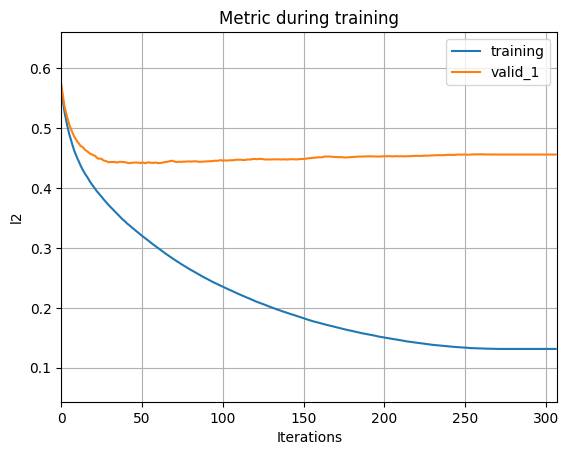

----> || Train Optimized QWK SCORE ::  0.666
----> || Val Optimized QWK SCORE ::  0.502
----> || Train Optimized Val QWK SCORE ::  0.480
----> || Val Optimized Train QWK SCORE ::  0.647
Fold 1 - Rounded Train QWK: 0.5220, Rounded Validation QWK: 0.3403


<Figure size 640x480 with 0 Axes>

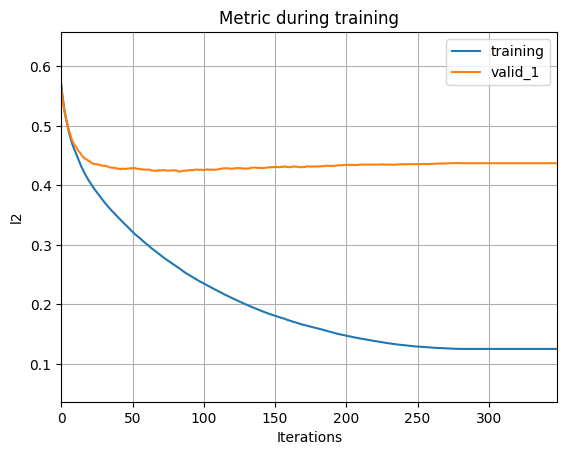

----> || Train Optimized QWK SCORE ::  0.764
----> || Val Optimized QWK SCORE ::  0.512
----> || Train Optimized Val QWK SCORE ::  0.501
----> || Val Optimized Train QWK SCORE ::  0.753
Fold 2 - Rounded Train QWK: 0.6468, Rounded Validation QWK: 0.4107


<Figure size 640x480 with 0 Axes>

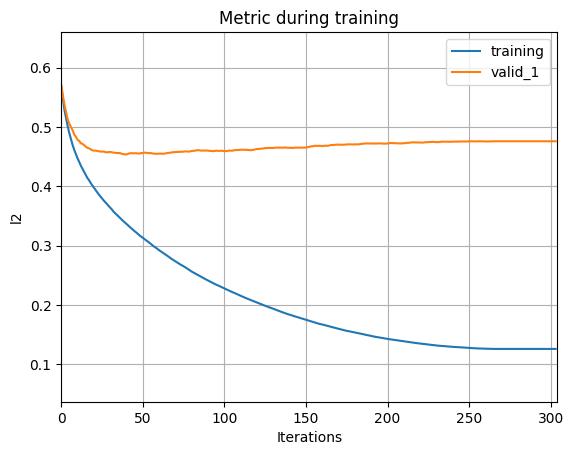

----> || Train Optimized QWK SCORE ::  0.658
----> || Val Optimized QWK SCORE ::  0.351
----> || Train Optimized Val QWK SCORE ::  0.488
----> || Val Optimized Train QWK SCORE ::  0.518
Fold 3 - Rounded Train QWK: 0.5348, Rounded Validation QWK: 0.3472


<Figure size 640x480 with 0 Axes>

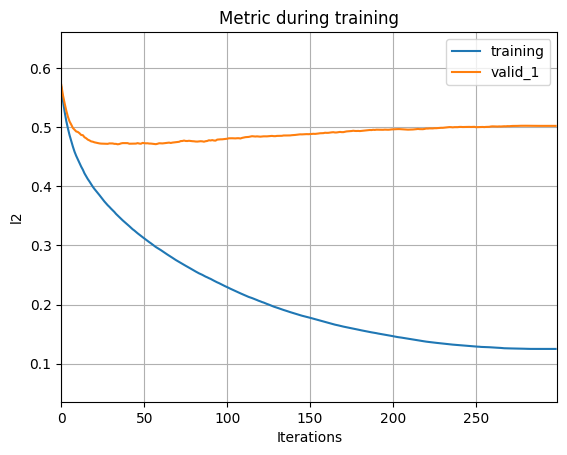

----> || Train Optimized QWK SCORE ::  0.634
----> || Val Optimized QWK SCORE ::  0.344
----> || Train Optimized Val QWK SCORE ::  0.429
----> || Val Optimized Train QWK SCORE ::  0.522
Fold 4 - Rounded Train QWK: 0.5070, Rounded Validation QWK: 0.3162


<Figure size 640x480 with 0 Axes>

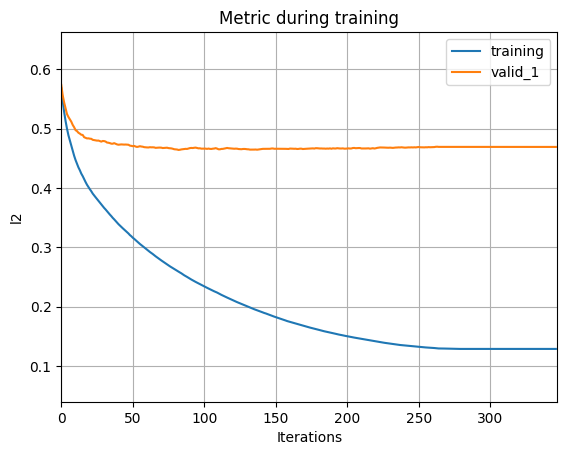

----> || Train Optimized QWK SCORE ::  0.757
----> || Val Optimized QWK SCORE ::  0.439
----> || Train Optimized Val QWK SCORE ::  0.415
----> || Val Optimized Train QWK SCORE ::  0.744
Fold 5 - Rounded Train QWK: 0.6602, Rounded Validation QWK: 0.3447
Mean Train QWK --> 0.6959
Mean Validation QWK ---> 0.4295
----> || Optimized QWK SCORE ::  0.476


In [78]:
lgb_models_list2, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds, lgb_optuna_study = lgb_feature_selection(
    train_selected_df, test_selected_df, 150
)

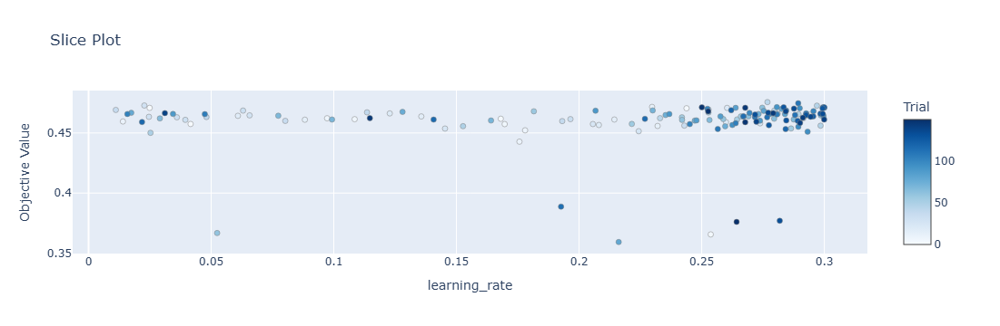

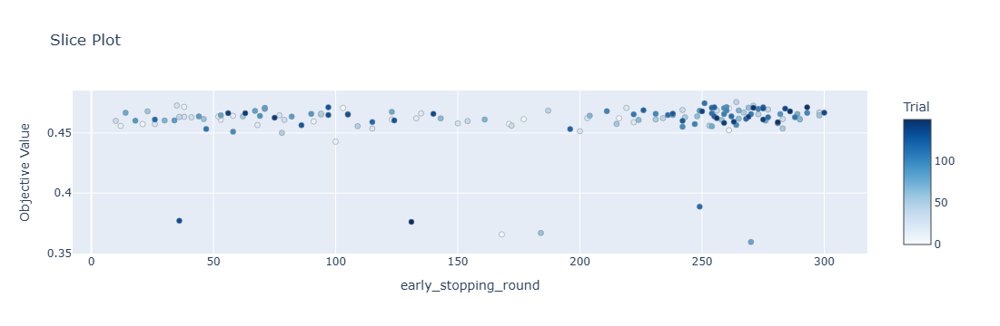

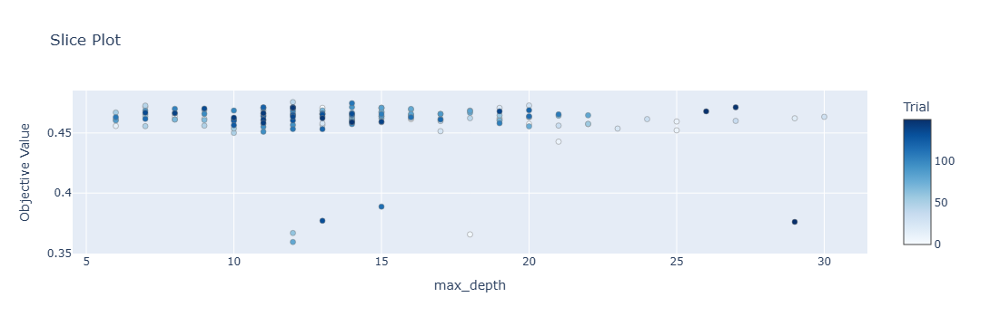

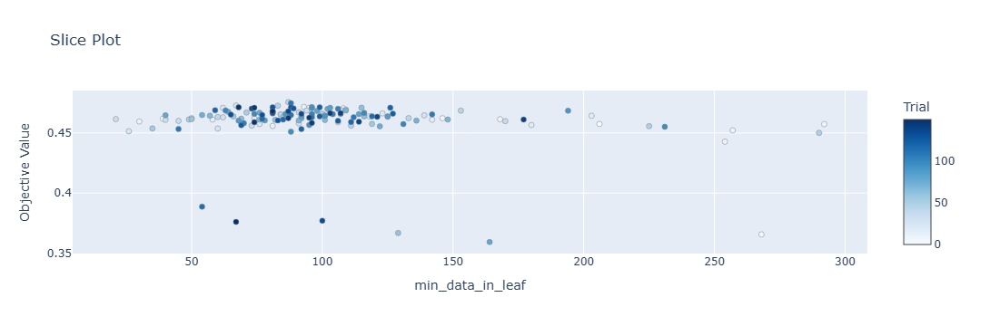

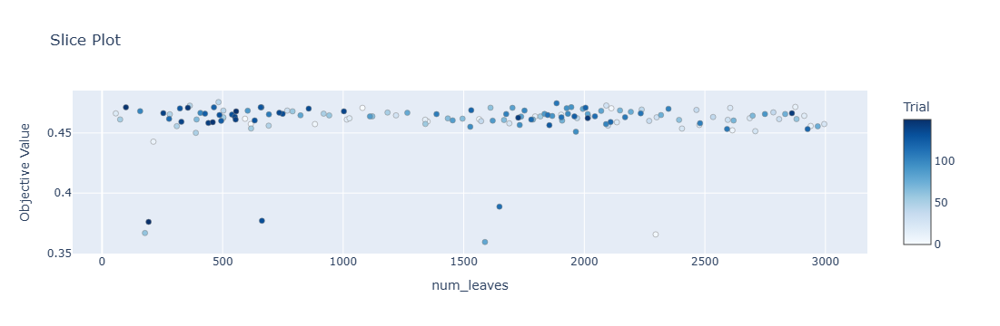

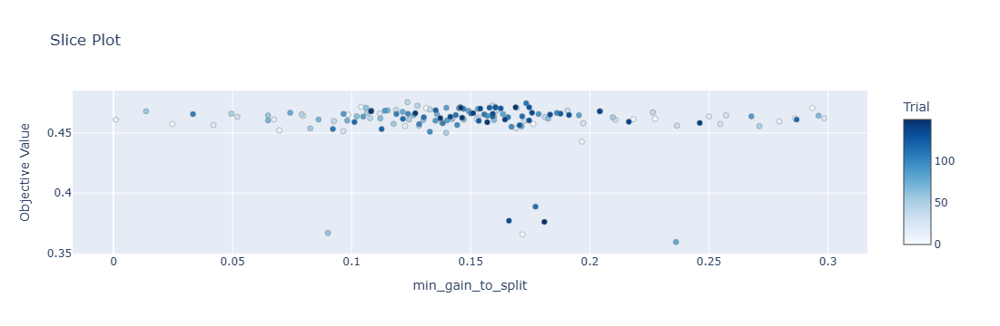

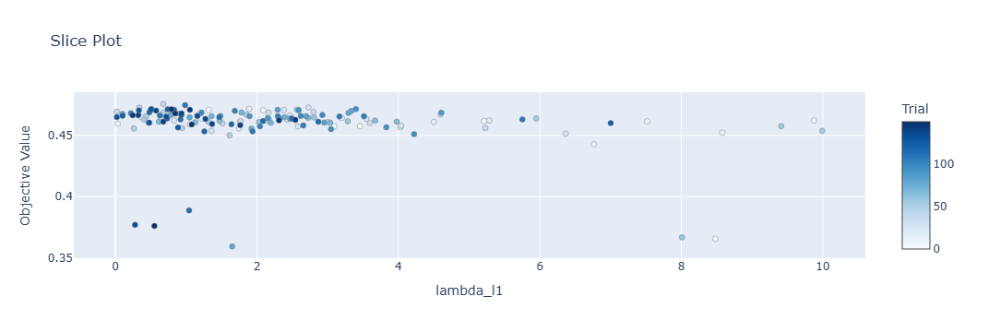

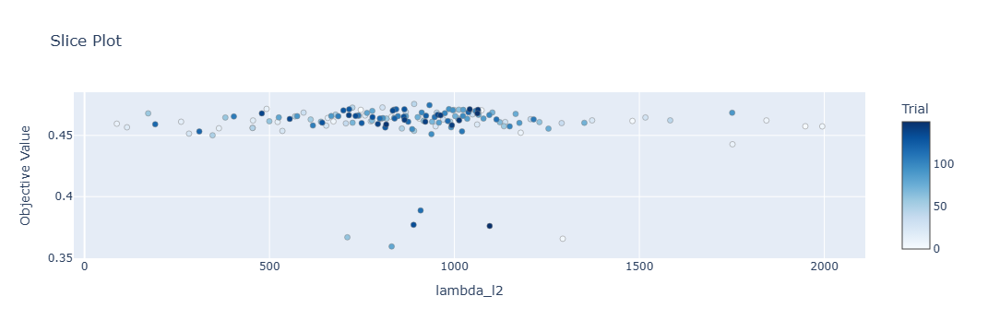

In [81]:
for param in lgb_optuna_study.best_params.keys():
    fig = plot_slice(lgb_optuna_study, params=[param])
    fig.show()

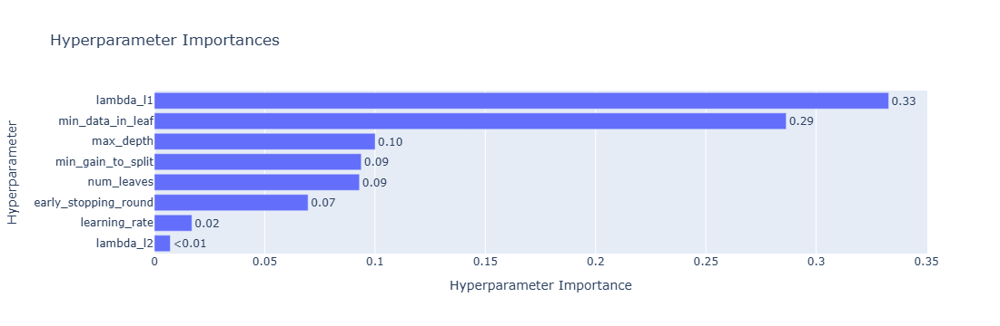

In [83]:
plot_param_importances(lgb_optuna_study)

In [84]:
lgb_optuna_study.best_params

{'learning_rate': 0.2768014762825226,
 'early_stopping_round': 264,
 'max_depth': 12,
 'min_data_in_leaf': 87,
 'num_leaves': 483,
 'min_gain_to_split': 0.12346015470880188,
 'lambda_l1': 0.6768154757148717,
 'lambda_l2': 891.1471720784664}

In [85]:
cols = train_selected_df.drop(['id', 'sii'], axis=1).columns
importance_list = []
for model in lgb_models_list2:
    importance_list.append(model.feature_importances_)

importance_mean = np.mean(importance_list, axis=0)
imp_df = pd.DataFrame(sorted(zip(cols, importance_mean)), columns=['Feature', 'Importance']).sort_values('Importance', ascending=False)
unimportant_df = imp_df[imp_df['Importance'] < imp_df['Importance'].quantile(0.5)]
unimportant_cols = unimportant_df['Feature'].tolist()

In [86]:
train_selected_df3 = train_selected_df.drop(unimportant_cols, axis=1)
print(train_selected_df3.shape)
train_selected_df3.head()

(2736, 415)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Time_Mins,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_SRL,FGC-FGC_TL,BIA-BIA_BMC,BIA-BIA_FFMI,BIA-BIA_Fat,BIA-BIA_Frame_num,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,PAQ_C-Season_isnan,Y_99%,Z_max,enmo_mean,enmo_std,enmo_10%,anglez_max,light_1%,light_max,X_weekday_2_max,X_weekday_3_mean,X_weekday_3_min,X_weekday_3_max,X_weekday_3_entropy,X_weekday_4_mean,X_weekday_4_min,X_weekday_4_entropy,X_weekday_5_entropy,X_weekday_6_min,X_weekday_6_1%,X_weekday_6_max,X_weekday_7_entropy,Y_weekday_1_mean,Y_weekday_1_sum,Y_weekday_2_sum,Y_weekday_2_entropy,Y_weekday_3_min,Y_weekday_4_mean,Y_weekday_4_min,Y_weekday_4_sum,Y_weekday_4_entropy,Y_weekday_6_std,Y_weekday_6_entropy,Y_weekday_7_1%,Y_weekday_7_entropy,Z_weekday_1_std,Z_weekday_1_min,Z_weekday_1_entropy,Z_weekday_2_min,Z_weekday_2_1%,Z_weekday_2_90%,Z_weekday_2_max,Z_weekday_2_entropy,Z_weekday_3_std,Z_weekday_3_min,Z_weekday_3_max,Z_weekday_3_entropy,Z_weekday_4_std,Z_weekday_4_min,Z_weekday_4_25%,Z_weekday_5_std,Z_weekday_5_1%,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_min,Z_weekday_6_95%,Z_weekday_6_max,Z_weekday_7_max,enmo_weekday_1_15%,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_4_max,enmo_weekday_4_entropy,enmo_weekday_5_mean,enmo_weekday_6_max,enmo_weekday_7_20%,anglez_weekday_1_entropy,anglez_weekday_3_min,anglez_weekday_3_entropy,light_weekday_1_30%,light_weekday_1_sum,light_weekday_3_mean,light_weekday_3_80%,light_weekday_3_max,light_weekday_4_mean,light_weekday_4_max,light_weekday_4_entropy,light_weekday_5_mean,light_weekday_5_max,light_weekday_5_entropy,light_weekday_6_sum,light_weekday_7_mean,battery_use_since_wear_weekday_1_std,battery_use_since_wear_weekday_1_min,battery_use_since_wear_weekday_2_std,battery_use_since_wear_weekday_2_min,battery_use_since_wear_weekday_2_30%,battery_use_since_wear_weekday_2_35%,battery_use_since_wear_weekday_2_entropy,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_4_30%,battery_use_since_wear_weekday_4_max,battery_use_since_wear_weekday_5_std,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_mean,battery_use_since_wear_weekday_6_1%,battery_use_since_wear_weekday_6_20%,battery_use_since_wear_weekday_6_55%,battery_use_since_wear_weekday_6_max,battery_use_since_wear_weekday_7_std,battery_use_since_wear_weekday_7_35%,battery_use_since_wear_weekday_7_95%,X_time_of_day_hour_window_0_std,X_time_of_day_hour_window_0_sum,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_1_max,X_time_of_day_hour_window_1_sum,X_time_of_day_hour_window_1_entropy,X_time_of_day_hour_window_2_mean,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_3_entropy,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_4_min,X_time_of_day_hour_window_4_sum,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_5_sum,X_time_of_day_hour_window_5_entropy,X_time_of_day_hour_window_6_mean,X_time_of_day_hour_window_6_entropy,X_time_of_day_hour_window_7_min,X_time_of_day_hour_window_7_1%,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_11_min,X_time_of_day_hour_window_11_entropy,X_time_of_day_hour_window_12_std,X_time_of_day_hour_window_13_1%,X_time_of_day_hour_window_14_3%,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_16_entropy,X_time_of_day_hour_window_17_std,X_time_of_day_hour_window_17_max,X_time_of_day_hour_window_18_max,X_time_of_day_hour_window_18_entropy,X_time_of_day_hour_window_20_min,X_time_of_day_hour_window_22_min,X_time_of_day_hour_window_22_max,X_time_of_day_hour_window_22_sum,X_time_of_day_hour_window_23_mean,Y_time_of_day_hour_window_0_mean,Y_time_of_day_hour_win

In [87]:
test_selected_df3 = test_selected_df.drop(unimportant_cols, axis=1)
print(test_selected_df3.shape)
test_selected_df3.head()

(20, 414)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Time_Mins,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_SRL,FGC-FGC_TL,BIA-BIA_BMC,BIA-BIA_FFMI,BIA-BIA_Fat,BIA-BIA_Frame_num,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,PAQ_C-Season_isnan,Y_99%,Z_max,enmo_mean,enmo_std,enmo_10%,anglez_max,light_1%,light_max,X_weekday_2_max,X_weekday_3_mean,X_weekday_3_min,X_weekday_3_max,X_weekday_3_entropy,X_weekday_4_mean,X_weekday_4_min,X_weekday_4_entropy,X_weekday_5_entropy,X_weekday_6_min,X_weekday_6_1%,X_weekday_6_max,X_weekday_7_entropy,Y_weekday_1_mean,Y_weekday_1_sum,Y_weekday_2_sum,Y_weekday_2_entropy,Y_weekday_3_min,Y_weekday_4_mean,Y_weekday_4_min,Y_weekday_4_sum,Y_weekday_4_entropy,Y_weekday_6_std,Y_weekday_6_entropy,Y_weekday_7_1%,Y_weekday_7_entropy,Z_weekday_1_std,Z_weekday_1_min,Z_weekday_1_entropy,Z_weekday_2_min,Z_weekday_2_1%,Z_weekday_2_90%,Z_weekday_2_max,Z_weekday_2_entropy,Z_weekday_3_std,Z_weekday_3_min,Z_weekday_3_max,Z_weekday_3_entropy,Z_weekday_4_std,Z_weekday_4_min,Z_weekday_4_25%,Z_weekday_5_std,Z_weekday_5_1%,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_min,Z_weekday_6_95%,Z_weekday_6_max,Z_weekday_7_max,enmo_weekday_1_15%,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_4_max,enmo_weekday_4_entropy,enmo_weekday_5_mean,enmo_weekday_6_max,enmo_weekday_7_20%,anglez_weekday_1_entropy,anglez_weekday_3_min,anglez_weekday_3_entropy,light_weekday_1_30%,light_weekday_1_sum,light_weekday_3_mean,light_weekday_3_80%,light_weekday_3_max,light_weekday_4_mean,light_weekday_4_max,light_weekday_4_entropy,light_weekday_5_mean,light_weekday_5_max,light_weekday_5_entropy,light_weekday_6_sum,light_weekday_7_mean,battery_use_since_wear_weekday_1_std,battery_use_since_wear_weekday_1_min,battery_use_since_wear_weekday_2_std,battery_use_since_wear_weekday_2_min,battery_use_since_wear_weekday_2_30%,battery_use_since_wear_weekday_2_35%,battery_use_since_wear_weekday_2_entropy,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_4_30%,battery_use_since_wear_weekday_4_max,battery_use_since_wear_weekday_5_std,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_mean,battery_use_since_wear_weekday_6_1%,battery_use_since_wear_weekday_6_20%,battery_use_since_wear_weekday_6_55%,battery_use_since_wear_weekday_6_max,battery_use_since_wear_weekday_7_std,battery_use_since_wear_weekday_7_35%,battery_use_since_wear_weekday_7_95%,X_time_of_day_hour_window_0_std,X_time_of_day_hour_window_0_sum,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_1_max,X_time_of_day_hour_window_1_sum,X_time_of_day_hour_window_1_entropy,X_time_of_day_hour_window_2_mean,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_3_entropy,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_4_min,X_time_of_day_hour_window_4_sum,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_5_sum,X_time_of_day_hour_window_5_entropy,X_time_of_day_hour_window_6_mean,X_time_of_day_hour_window_6_entropy,X_time_of_day_hour_window_7_min,X_time_of_day_hour_window_7_1%,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_11_min,X_time_of_day_hour_window_11_entropy,X_time_of_day_hour_window_12_std,X_time_of_day_hour_window_13_1%,X_time_of_day_hour_window_14_3%,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_16_entropy,X_time_of_day_hour_window_17_std,X_time_of_day_hour_window_17_max,X_time_of_day_hour_window_18_max,X_time_of_day_hour_window_18_entropy,X_time_of_day_hour_window_20_min,X_time_of_day_hour_window_22_min,X_time_of_day_hour_window_22_max,X_time_of_day_hour_window_22_sum,X_time_of_day_hour_window_23_mean,Y_time_of_day_hour_window_0_mean,Y_time_of_day_hour_win

Optimizing: 100%|█████████████████████████████████████████████████████████████████| 200/200 [24:44<00:00,  7.42s/trial]


<Figure size 640x480 with 0 Axes>

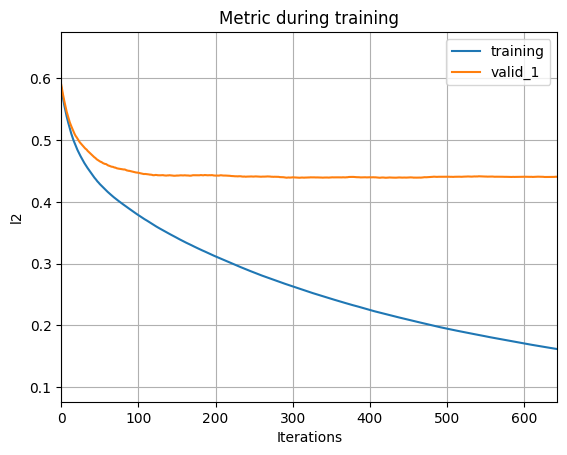

----> || Train Optimized QWK SCORE ::  0.814
----> || Val Optimized QWK SCORE ::  0.502
----> || Train Optimized Val QWK SCORE ::  0.484
----> || Val Optimized Train QWK SCORE ::  0.806
Fold 1 - Rounded Train QWK: 0.7126, Rounded Validation QWK: 0.3519


<Figure size 640x480 with 0 Axes>

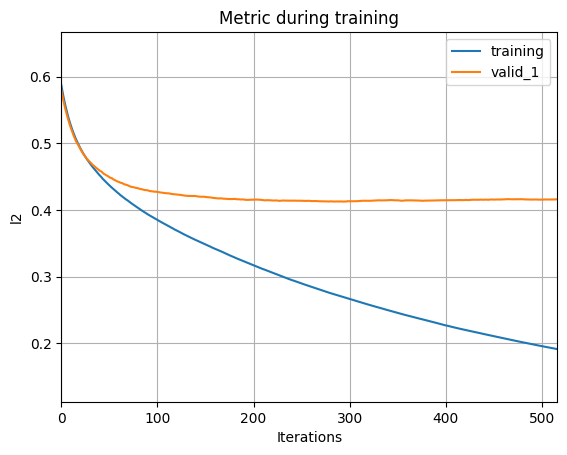

----> || Train Optimized QWK SCORE ::  0.753
----> || Val Optimized QWK SCORE ::  0.526
----> || Train Optimized Val QWK SCORE ::  0.498
----> || Val Optimized Train QWK SCORE ::  0.737
Fold 2 - Rounded Train QWK: 0.6364, Rounded Validation QWK: 0.4252


<Figure size 640x480 with 0 Axes>

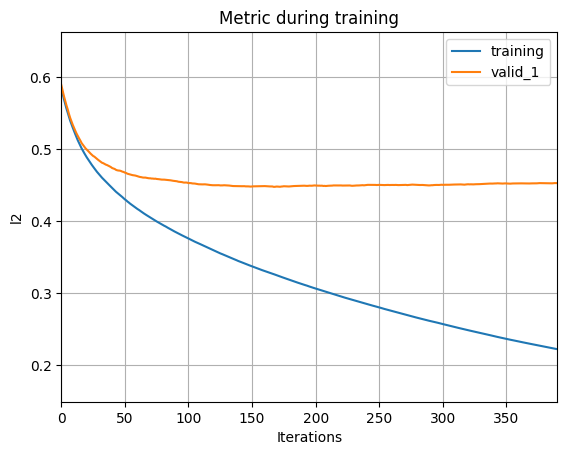

----> || Train Optimized QWK SCORE ::  0.670
----> || Val Optimized QWK SCORE ::  0.510
----> || Train Optimized Val QWK SCORE ::  0.467
----> || Val Optimized Train QWK SCORE ::  0.657
Fold 3 - Rounded Train QWK: 0.5563, Rounded Validation QWK: 0.3299


<Figure size 640x480 with 0 Axes>

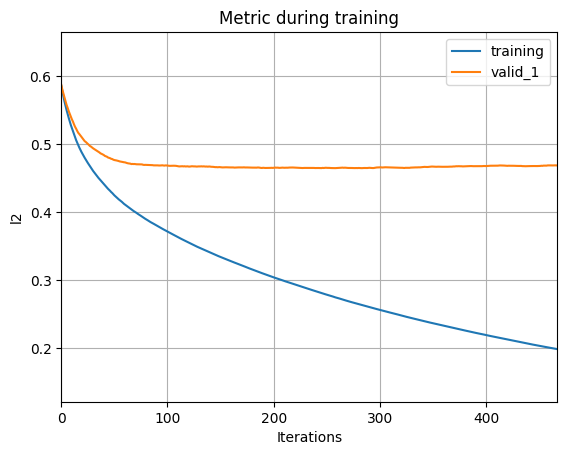

----> || Train Optimized QWK SCORE ::  0.727
----> || Val Optimized QWK SCORE ::  0.491
----> || Train Optimized Val QWK SCORE ::  0.479
----> || Val Optimized Train QWK SCORE ::  0.713
Fold 4 - Rounded Train QWK: 0.6299, Rounded Validation QWK: 0.3287


<Figure size 640x480 with 0 Axes>

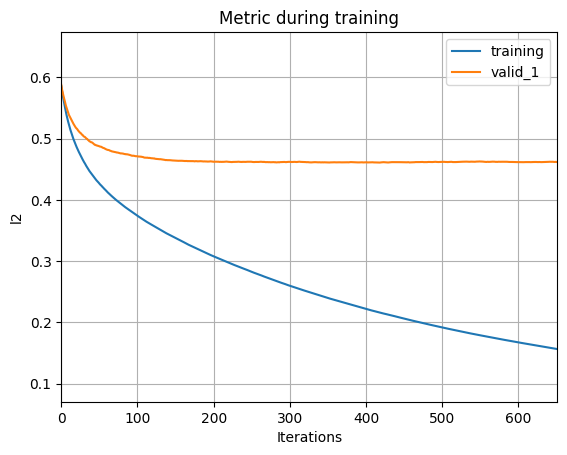

----> || Train Optimized QWK SCORE ::  0.808
----> || Val Optimized QWK SCORE ::  0.441
----> || Train Optimized Val QWK SCORE ::  0.429
----> || Val Optimized Train QWK SCORE ::  0.797
Fold 5 - Rounded Train QWK: 0.7280, Rounded Validation QWK: 0.3734
Mean Train QWK --> 0.7543
Mean Validation QWK ---> 0.4940
----> || Optimized QWK SCORE ::  0.486


In [88]:
lgb_models_list3, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds, lgb_optuna_study = lgb_feature_selection(
    train_selected_df3, test_selected_df3, 200
)

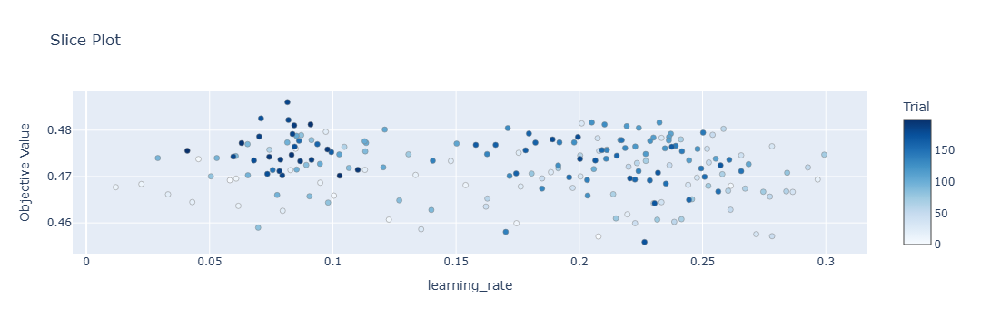

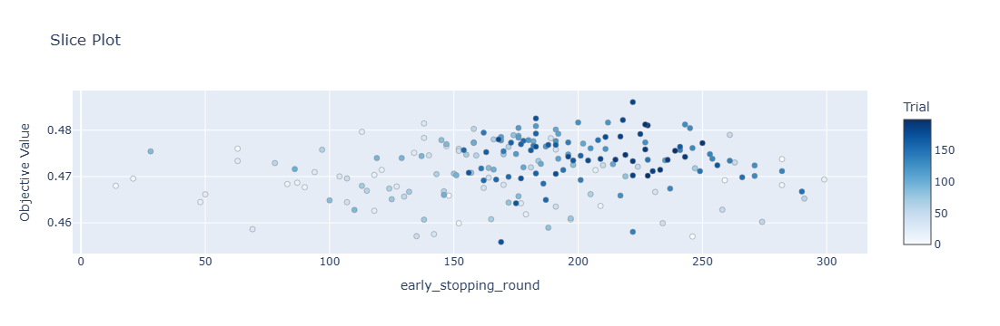

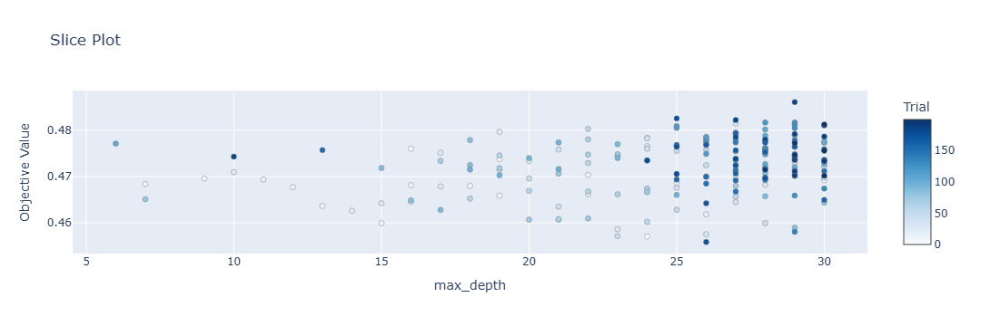

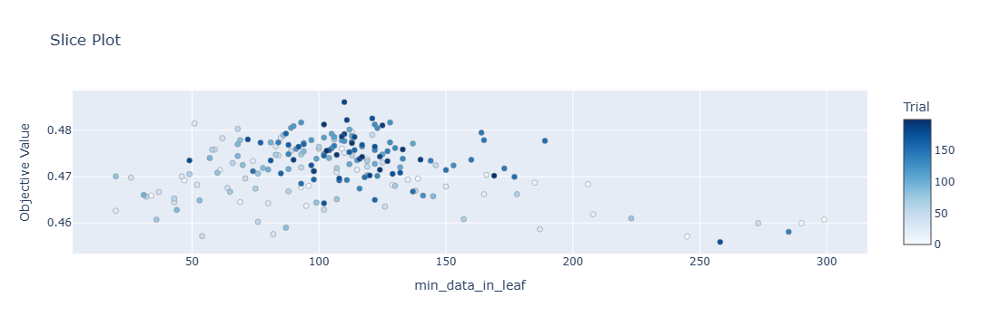

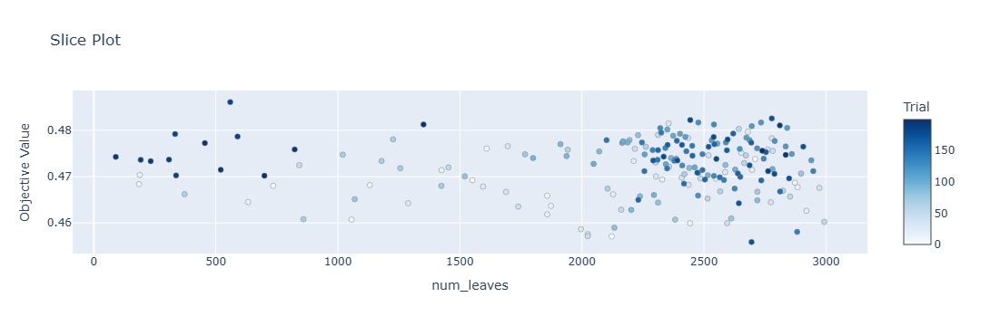

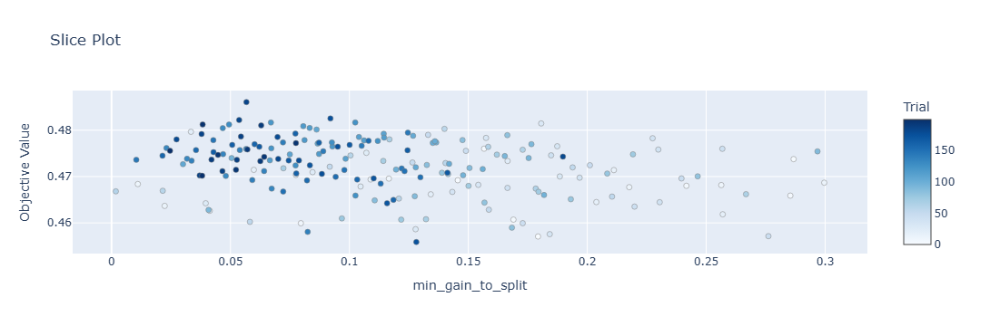

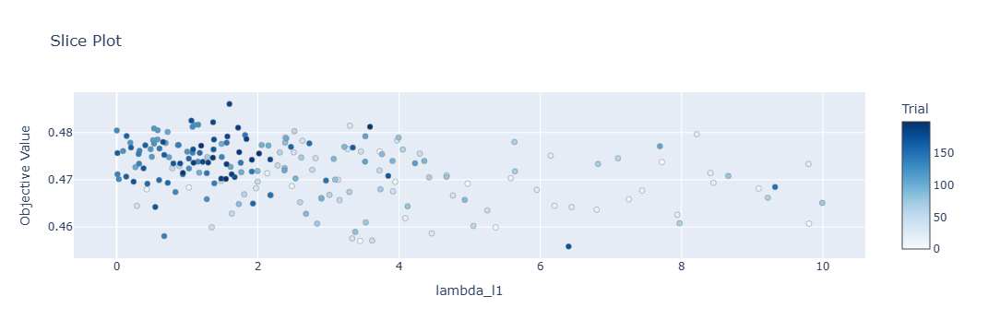

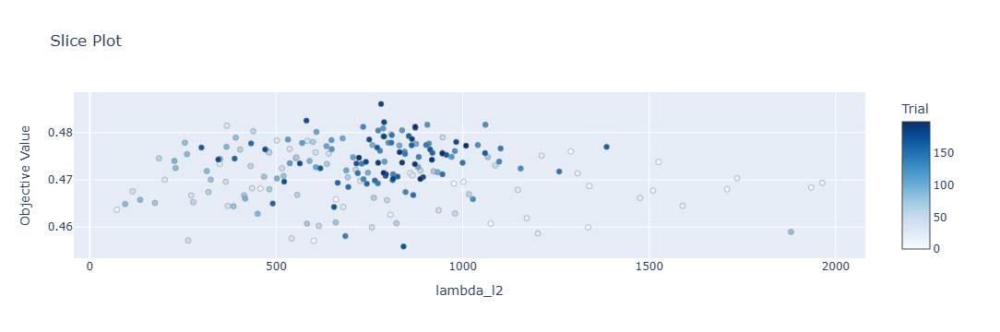

In [89]:
for param in lgb_optuna_study.best_params.keys():
    fig = plot_slice(lgb_optuna_study, params=[param])
    fig.show()

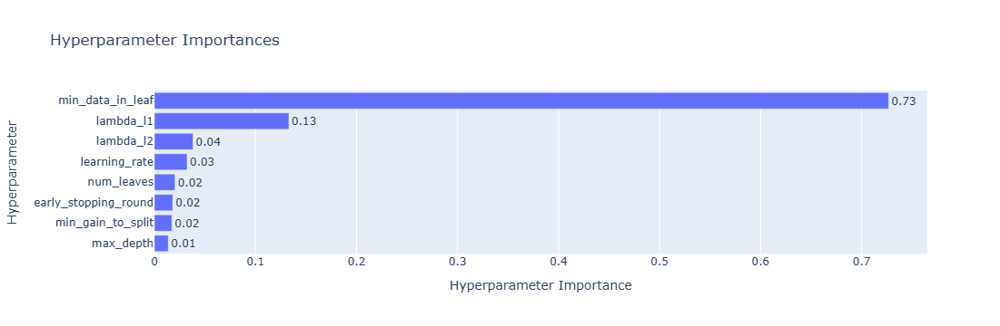

In [92]:
plot_param_importances(lgb_optuna_study)

In [93]:
lgb_optuna_study.best_params

{'learning_rate': 0.08158918103928106,
 'early_stopping_round': 222,
 'max_depth': 29,
 'min_data_in_leaf': 110,
 'num_leaves': 559,
 'min_gain_to_split': 0.056699833191931684,
 'lambda_l1': 1.5969539973875135,
 'lambda_l2': 781.0968198912663}

In [94]:
cols = train_selected_df3.drop(['id', 'sii'], axis=1).columns
importance_list = []
for model in lgb_models_list3:
    importance_list.append(model.feature_importances_)

importance_mean = np.mean(importance_list, axis=0)
imp_df = pd.DataFrame(sorted(zip(cols, importance_mean)), columns=['Feature', 'Importance']).sort_values('Importance', ascending=False)
unimportant_df = imp_df[imp_df['Importance'] < imp_df['Importance'].quantile(0.5)]
unimportant_cols = unimportant_df['Feature'].tolist()

In [95]:
train_selected_df4 = train_selected_df3.drop(unimportant_cols, axis=1)
print(train_selected_df4.shape)
train_selected_df4.head()

(2736, 212)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Time_Mins,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_SRL,FGC-FGC_TL,BIA-BIA_BMC,BIA-BIA_FFMI,BIA-BIA_Fat,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,enmo_std,anglez_max,light_1%,X_weekday_3_min,X_weekday_3_max,X_weekday_4_mean,X_weekday_4_entropy,X_weekday_5_entropy,X_weekday_6_max,Y_weekday_2_entropy,Y_weekday_3_min,Y_weekday_4_entropy,Y_weekday_6_std,Y_weekday_6_entropy,Y_weekday_7_1%,Y_weekday_7_entropy,Z_weekday_1_min,Z_weekday_2_1%,Z_weekday_2_90%,Z_weekday_2_max,Z_weekday_3_std,Z_weekday_3_entropy,Z_weekday_4_std,Z_weekday_4_25%,Z_weekday_5_std,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_max,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_6_max,enmo_weekday_7_20%,anglez_weekday_3_entropy,light_weekday_3_max,light_weekday_4_mean,light_weekday_4_max,light_weekday_4_entropy,battery_use_since_wear_weekday_1_std,battery_use_since_wear_weekday_2_30%,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_max,battery_use_since_wear_weekday_7_35%,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_1_sum,X_time_of_day_hour_window_1_entropy,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_3_entropy,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_5_sum,X_time_of_day_hour_window_5_entropy,X_time_of_day_hour_window_6_mean,X_time_of_day_hour_window_6_entropy,X_time_of_day_hour_window_7_1%,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_17_max,X_time_of_day_hour_window_20_min,X_time_of_day_hour_window_22_max,X_time_of_day_hour_window_22_sum,X_time_of_day_hour_window_23_mean,Y_time_of_day_hour_window_0_mean,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_2_mean,Y_time_of_day_hour_window_2_std,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_4_std,Y_time_of_day_hour_window_4_1%,Y_time_of_day_hour_window_4_65%,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_mean,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_7_mean,Y_time_of_day_hour_window_7_1%,Y_time_of_day_hour_window_7_sum,Y_time_of_day_hour_window_7_entropy,Y_time_of_day_hour_window_8_mean,Y_time_of_day_hour_window_9_sum,Y_time_of_day_hour_window_9_entropy,Y_time_of_day_hour_window_10_mean,Y_time_of_day_hour_window_10_entropy,Y_time_of_day_hour_window_11_mean,Y_time_of_day_hour_window_12_std,Y_time_of_day_hour_window_13_3%,Y_time_of_day_hour_window_13_max,Y_time_of_day_hour_window_15_min,Y_time_of_day_hour_window_19_mean,Y_time_of_day_hour_window_19_sum,Y_time_of_day_hour_window_20_sum,Y_time_of_day_hour_window_21_sum,Y_time_of_day_hour_window_21_entropy,Y_time_of_day_hour_window_22_min,Y_time_of_day_hour_window_23_sum,Z_time_of_day_hour_window_0_min,Z_time_of_day_hour_window_1_mean,Z_time_of_day_hour_window_1_sum,Z_time_of_day_hour_window_2_mean,Z_time_of_day_hour_window_2_std,Z_time_of_day_hour_window_3_std,Z_time_of_day_hour_window_5_mean,Z_time_of_day_hour_window_5_std,Z_time_of_day_hour_window_5_sum,Z_time_of_day_hour_window_7_entropy,Z_time_of_day_hour_window_9_max,Z_time_of_day_hour_window_9_sum,Z_time_of_day_hour_window_10_mean,Z_time_of_day_hour_window_10_std,Z_time_of_day_hour_window_10_max,Z_time_of_day_hour_window_12_entropy,Z_time_of_day_hour_window_13_min,Z_time_of_day_hour_window_13_max,Z_time_of_day_hour_window_15_std,Z_time_of_day_hour_window_15_entropy,Z_time_of_day_hour_window_16_max,Z_time_of_day_hour_window_20_mean,Z_time_of_day_hour_window_20_min,Z_time_of_day_hour_window_20_max,Z_time_of_day_hour_window_21_mean,Z_time_of_day_hour_window_22_min,Z_ti

In [96]:
test_selected_df4 = test_selected_df3.drop(unimportant_cols, axis=1)
print(test_selected_df4.shape)
test_selected_df4.head()

(20, 211)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Time_Mins,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_SRL,FGC-FGC_TL,BIA-BIA_BMC,BIA-BIA_FFMI,BIA-BIA_Fat,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,enmo_std,anglez_max,light_1%,X_weekday_3_min,X_weekday_3_max,X_weekday_4_mean,X_weekday_4_entropy,X_weekday_5_entropy,X_weekday_6_max,Y_weekday_2_entropy,Y_weekday_3_min,Y_weekday_4_entropy,Y_weekday_6_std,Y_weekday_6_entropy,Y_weekday_7_1%,Y_weekday_7_entropy,Z_weekday_1_min,Z_weekday_2_1%,Z_weekday_2_90%,Z_weekday_2_max,Z_weekday_3_std,Z_weekday_3_entropy,Z_weekday_4_std,Z_weekday_4_25%,Z_weekday_5_std,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_max,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_6_max,enmo_weekday_7_20%,anglez_weekday_3_entropy,light_weekday_3_max,light_weekday_4_mean,light_weekday_4_max,light_weekday_4_entropy,battery_use_since_wear_weekday_1_std,battery_use_since_wear_weekday_2_30%,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_max,battery_use_since_wear_weekday_7_35%,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_1_sum,X_time_of_day_hour_window_1_entropy,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_3_entropy,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_5_sum,X_time_of_day_hour_window_5_entropy,X_time_of_day_hour_window_6_mean,X_time_of_day_hour_window_6_entropy,X_time_of_day_hour_window_7_1%,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_17_max,X_time_of_day_hour_window_20_min,X_time_of_day_hour_window_22_max,X_time_of_day_hour_window_22_sum,X_time_of_day_hour_window_23_mean,Y_time_of_day_hour_window_0_mean,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_2_mean,Y_time_of_day_hour_window_2_std,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_4_std,Y_time_of_day_hour_window_4_1%,Y_time_of_day_hour_window_4_65%,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_mean,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_7_mean,Y_time_of_day_hour_window_7_1%,Y_time_of_day_hour_window_7_sum,Y_time_of_day_hour_window_7_entropy,Y_time_of_day_hour_window_8_mean,Y_time_of_day_hour_window_9_sum,Y_time_of_day_hour_window_9_entropy,Y_time_of_day_hour_window_10_mean,Y_time_of_day_hour_window_10_entropy,Y_time_of_day_hour_window_11_mean,Y_time_of_day_hour_window_12_std,Y_time_of_day_hour_window_13_3%,Y_time_of_day_hour_window_13_max,Y_time_of_day_hour_window_15_min,Y_time_of_day_hour_window_19_mean,Y_time_of_day_hour_window_19_sum,Y_time_of_day_hour_window_20_sum,Y_time_of_day_hour_window_21_sum,Y_time_of_day_hour_window_21_entropy,Y_time_of_day_hour_window_22_min,Y_time_of_day_hour_window_23_sum,Z_time_of_day_hour_window_0_min,Z_time_of_day_hour_window_1_mean,Z_time_of_day_hour_window_1_sum,Z_time_of_day_hour_window_2_mean,Z_time_of_day_hour_window_2_std,Z_time_of_day_hour_window_3_std,Z_time_of_day_hour_window_5_mean,Z_time_of_day_hour_window_5_std,Z_time_of_day_hour_window_5_sum,Z_time_of_day_hour_window_7_entropy,Z_time_of_day_hour_window_9_max,Z_time_of_day_hour_window_9_sum,Z_time_of_day_hour_window_10_mean,Z_time_of_day_hour_window_10_std,Z_time_of_day_hour_window_10_max,Z_time_of_day_hour_window_12_entropy,Z_time_of_day_hour_window_13_min,Z_time_of_day_hour_window_13_max,Z_time_of_day_hour_window_15_std,Z_time_of_day_hour_window_15_entropy,Z_time_of_day_hour_window_16_max,Z_time_of_day_hour_window_20_mean,Z_time_of_day_hour_window_20_min,Z_time_of_day_hour_window_20_max,Z_time_of_day_hour_window_21_mean,Z_time_of_day_hour_window_22_min,Z_ti

Optimizing: 100%|█████████████████████████████████████████████████████████████████| 250/250 [26:57<00:00,  6.47s/trial]


<Figure size 640x480 with 0 Axes>

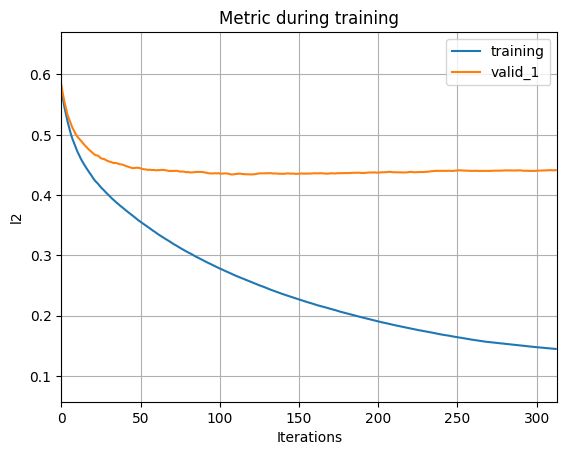

----> || Train Optimized QWK SCORE ::  0.764
----> || Val Optimized QWK SCORE ::  0.528
----> || Train Optimized Val QWK SCORE ::  0.504
----> || Val Optimized Train QWK SCORE ::  0.754
Fold 1 - Rounded Train QWK: 0.6594, Rounded Validation QWK: 0.3533


<Figure size 640x480 with 0 Axes>

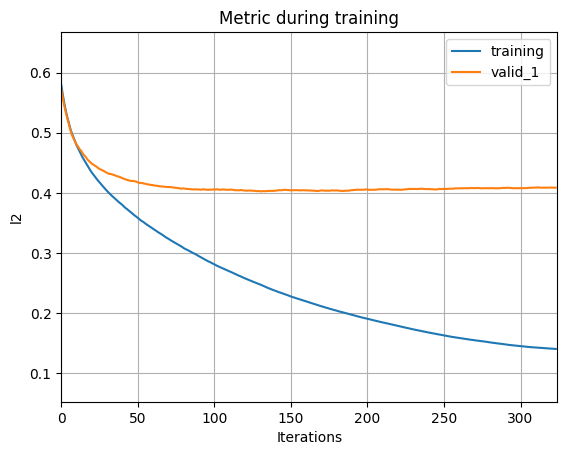

----> || Train Optimized QWK SCORE ::  0.777
----> || Val Optimized QWK SCORE ::  0.537
----> || Train Optimized Val QWK SCORE ::  0.519
----> || Val Optimized Train QWK SCORE ::  0.771
Fold 2 - Rounded Train QWK: 0.6735, Rounded Validation QWK: 0.4467


<Figure size 640x480 with 0 Axes>

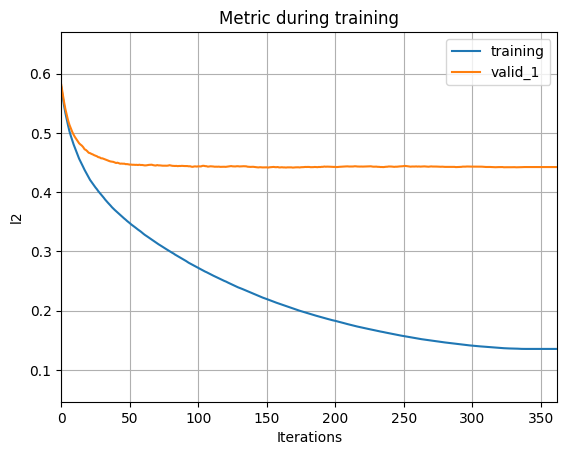

----> || Train Optimized QWK SCORE ::  0.821
----> || Val Optimized QWK SCORE ::  0.505
----> || Train Optimized Val QWK SCORE ::  0.472
----> || Val Optimized Train QWK SCORE ::  0.808
Fold 3 - Rounded Train QWK: 0.7212, Rounded Validation QWK: 0.3937


<Figure size 640x480 with 0 Axes>

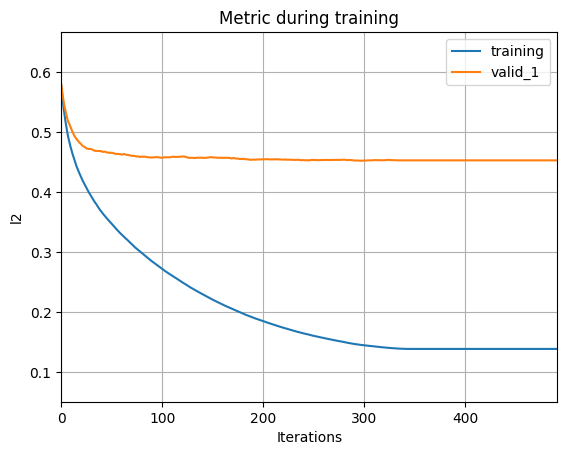

----> || Train Optimized QWK SCORE ::  0.881
----> || Val Optimized QWK SCORE ::  0.514
----> || Train Optimized Val QWK SCORE ::  0.419
----> || Val Optimized Train QWK SCORE ::  0.853
Fold 4 - Rounded Train QWK: 0.8256, Rounded Validation QWK: 0.3803


<Figure size 640x480 with 0 Axes>

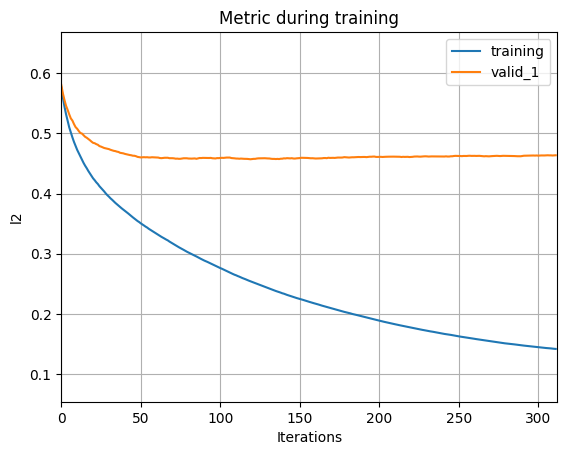

----> || Train Optimized QWK SCORE ::  0.768
----> || Val Optimized QWK SCORE ::  0.443
----> || Train Optimized Val QWK SCORE ::  0.421
----> || Val Optimized Train QWK SCORE ::  0.757
Fold 5 - Rounded Train QWK: 0.6647, Rounded Validation QWK: 0.3807
Mean Train QWK --> 0.8021
Mean Validation QWK ---> 0.5053
----> || Optimized QWK SCORE ::  0.498


In [97]:
lgb_models_list4, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds, lgb_optuna_study = lgb_feature_selection(
    train_selected_df4, test_selected_df4, 250
)

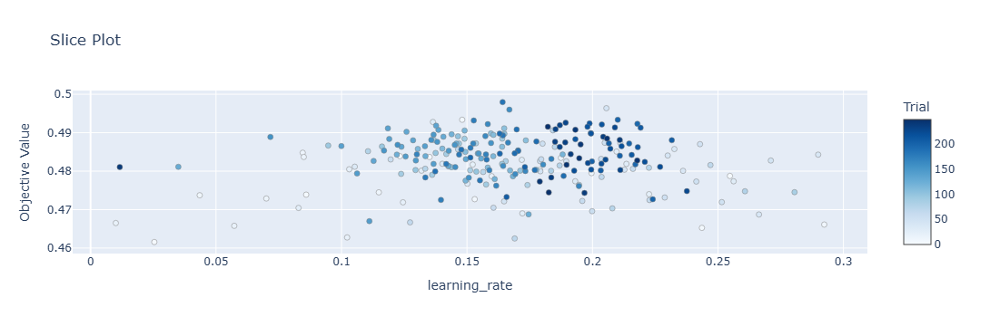

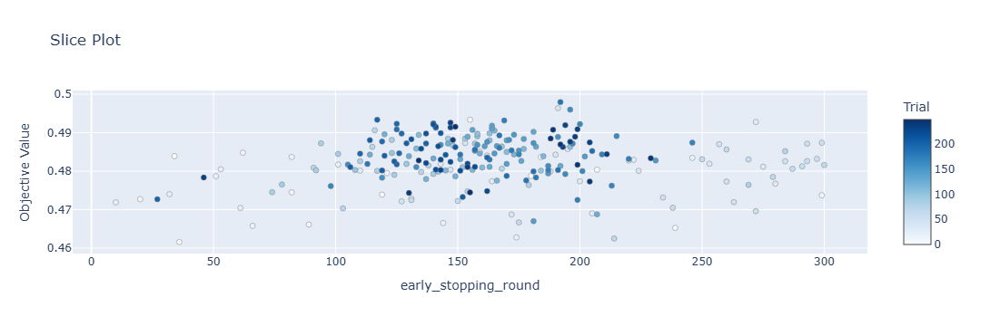

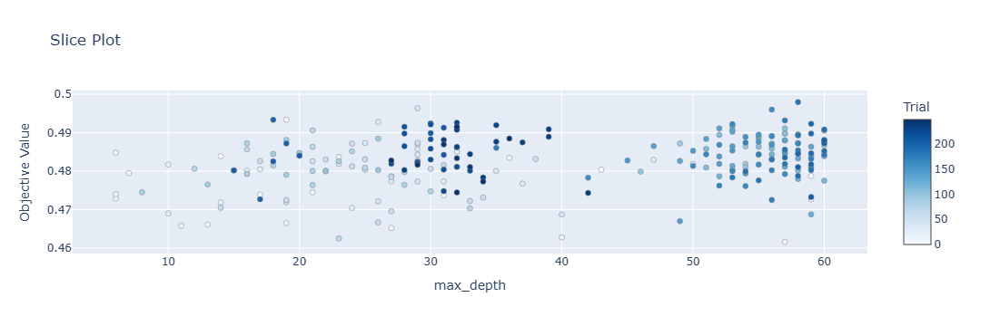

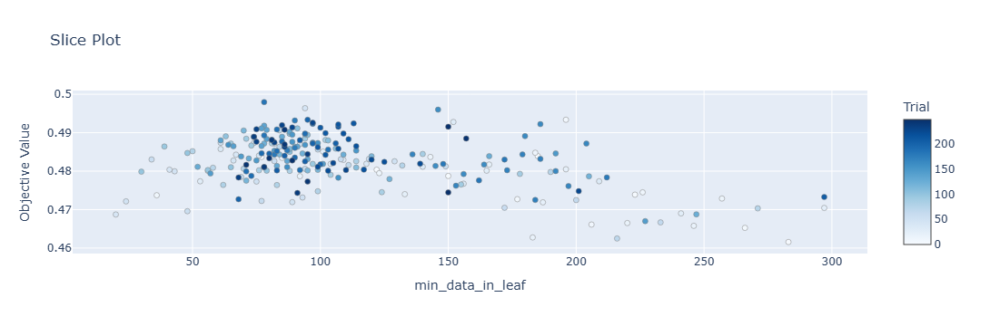

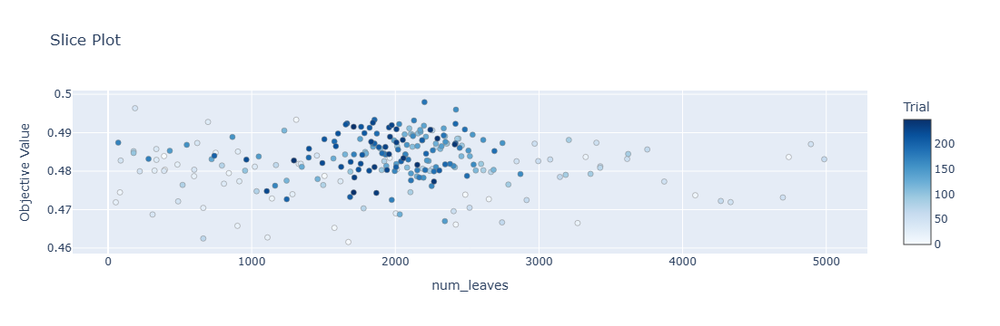

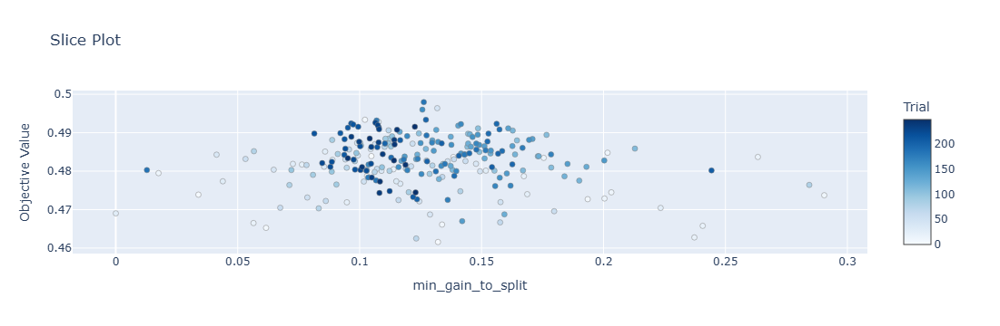

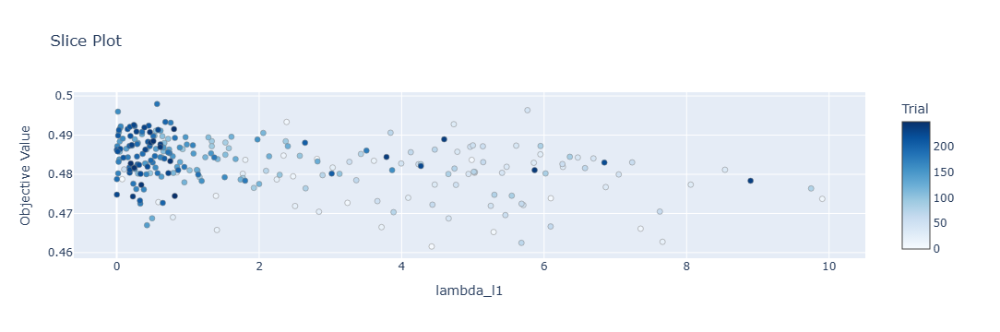

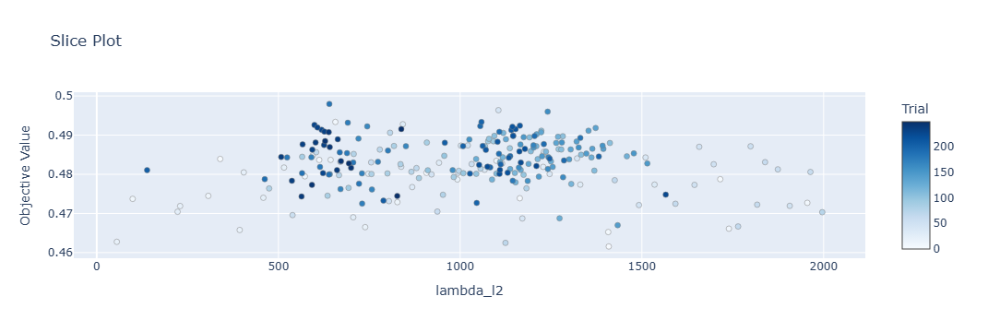

In [98]:
for param in lgb_optuna_study.best_params.keys():
    fig = plot_slice(lgb_optuna_study, params=[param])
    fig.show()

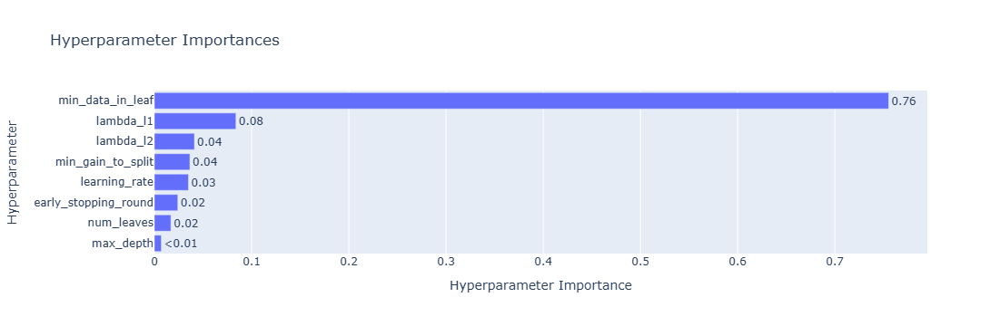

In [100]:
plot_param_importances(lgb_optuna_study)

In [101]:
lgb_optuna_study.best_params

{'learning_rate': 0.1641912437295294,
 'early_stopping_round': 192,
 'max_depth': 58,
 'min_data_in_leaf': 78,
 'num_leaves': 2203,
 'min_gain_to_split': 0.12631394678335306,
 'lambda_l1': 0.5667142393675708,
 'lambda_l2': 640.0455249555231}

In [114]:
cols = train_selected_df4.drop(['id', 'sii'], axis=1).columns
importance_list = []
for model in lgb_models_list4:
    importance_list.append(model.feature_importances_)

importance_mean = np.mean(importance_list, axis=0)
imp_df = pd.DataFrame(sorted(zip(cols, importance_mean)), columns=['Feature', 'Importance']).sort_values('Importance', ascending=False)
unimportant_df = imp_df[imp_df['Importance'] < imp_df['Importance'].quantile(0.1)]
unimportant_cols = unimportant_df['Feature'].tolist()

In [115]:
train_selected_df5 = train_selected_df4.drop(unimportant_cols, axis=1)
print(train_selected_df5.shape)
train_selected_df5.head()

(2736, 191)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Time_Mins,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_SRL,FGC-FGC_TL,BIA-BIA_BMC,BIA-BIA_FFMI,BIA-BIA_Fat,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,enmo_std,anglez_max,light_1%,X_weekday_3_min,X_weekday_3_max,X_weekday_4_mean,X_weekday_4_entropy,X_weekday_5_entropy,X_weekday_6_max,Y_weekday_2_entropy,Y_weekday_3_min,Y_weekday_4_entropy,Y_weekday_6_std,Y_weekday_7_1%,Y_weekday_7_entropy,Z_weekday_1_min,Z_weekday_2_1%,Z_weekday_2_90%,Z_weekday_3_std,Z_weekday_3_entropy,Z_weekday_4_25%,Z_weekday_5_std,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_max,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_6_max,anglez_weekday_3_entropy,light_weekday_4_mean,light_weekday_4_max,light_weekday_4_entropy,battery_use_since_wear_weekday_1_std,battery_use_since_wear_weekday_2_30%,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_max,battery_use_since_wear_weekday_7_35%,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_1_sum,X_time_of_day_hour_window_1_entropy,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_5_sum,X_time_of_day_hour_window_5_entropy,X_time_of_day_hour_window_6_entropy,X_time_of_day_hour_window_7_1%,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_17_max,X_time_of_day_hour_window_20_min,X_time_of_day_hour_window_22_max,X_time_of_day_hour_window_22_sum,X_time_of_day_hour_window_23_mean,Y_time_of_day_hour_window_0_mean,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_2_mean,Y_time_of_day_hour_window_2_std,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_4_std,Y_time_of_day_hour_window_4_1%,Y_time_of_day_hour_window_4_65%,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_7_mean,Y_time_of_day_hour_window_7_1%,Y_time_of_day_hour_window_7_sum,Y_time_of_day_hour_window_7_entropy,Y_time_of_day_hour_window_8_mean,Y_time_of_day_hour_window_9_sum,Y_time_of_day_hour_window_9_entropy,Y_time_of_day_hour_window_10_mean,Y_time_of_day_hour_window_10_entropy,Y_time_of_day_hour_window_11_mean,Y_time_of_day_hour_window_12_std,Y_time_of_day_hour_window_13_3%,Y_time_of_day_hour_window_13_max,Y_time_of_day_hour_window_15_min,Y_time_of_day_hour_window_19_sum,Y_time_of_day_hour_window_20_sum,Y_time_of_day_hour_window_21_sum,Y_time_of_day_hour_window_21_entropy,Y_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_0_min,Z_time_of_day_hour_window_1_mean,Z_time_of_day_hour_window_1_sum,Z_time_of_day_hour_window_2_std,Z_time_of_day_hour_window_3_std,Z_time_of_day_hour_window_5_mean,Z_time_of_day_hour_window_5_sum,Z_time_of_day_hour_window_7_entropy,Z_time_of_day_hour_window_9_max,Z_time_of_day_hour_window_9_sum,Z_time_of_day_hour_window_10_std,Z_time_of_day_hour_window_10_max,Z_time_of_day_hour_window_12_entropy,Z_time_of_day_hour_window_13_min,Z_time_of_day_hour_window_15_std,Z_time_of_day_hour_window_15_entropy,Z_time_of_day_hour_window_16_max,Z_time_of_day_hour_window_20_mean,Z_time_of_day_hour_window_20_min,Z_time_of_day_hour_window_20_max,Z_time_of_day_hour_window_21_mean,Z_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_22_max,Z_time_of_day_hour_window_23_mean,Z_time_of_day_hour_window_23_std,Z_time_of_day_hour_window_23_min,enmo_time_of_day_hour_window_1_std,enmo_time_of_day_hour_window_5_25%,enmo_time_of_day_hour_window_6_mean,enmo_time_of_day_hour_window_6_sum,enmo_time_of_day_hour_window_8_sum,enmo_time_of_day_hour_window_10_mean,enmo_time_of_day_hour_window_15_10%,enmo_time_of_day_hour_window_17_1%,e

In [116]:
test_selected_df5 = test_selected_df4.drop(unimportant_cols, axis=1)
print(test_selected_df5.shape)
test_selected_df5.head()

(20, 190)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Time_Mins,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_SRL,FGC-FGC_TL,BIA-BIA_BMC,BIA-BIA_FFMI,BIA-BIA_Fat,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,enmo_std,anglez_max,light_1%,X_weekday_3_min,X_weekday_3_max,X_weekday_4_mean,X_weekday_4_entropy,X_weekday_5_entropy,X_weekday_6_max,Y_weekday_2_entropy,Y_weekday_3_min,Y_weekday_4_entropy,Y_weekday_6_std,Y_weekday_7_1%,Y_weekday_7_entropy,Z_weekday_1_min,Z_weekday_2_1%,Z_weekday_2_90%,Z_weekday_3_std,Z_weekday_3_entropy,Z_weekday_4_25%,Z_weekday_5_std,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_max,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_6_max,anglez_weekday_3_entropy,light_weekday_4_mean,light_weekday_4_max,light_weekday_4_entropy,battery_use_since_wear_weekday_1_std,battery_use_since_wear_weekday_2_30%,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_max,battery_use_since_wear_weekday_7_35%,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_1_sum,X_time_of_day_hour_window_1_entropy,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_5_sum,X_time_of_day_hour_window_5_entropy,X_time_of_day_hour_window_6_entropy,X_time_of_day_hour_window_7_1%,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_17_max,X_time_of_day_hour_window_20_min,X_time_of_day_hour_window_22_max,X_time_of_day_hour_window_22_sum,X_time_of_day_hour_window_23_mean,Y_time_of_day_hour_window_0_mean,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_2_mean,Y_time_of_day_hour_window_2_std,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_4_std,Y_time_of_day_hour_window_4_1%,Y_time_of_day_hour_window_4_65%,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_7_mean,Y_time_of_day_hour_window_7_1%,Y_time_of_day_hour_window_7_sum,Y_time_of_day_hour_window_7_entropy,Y_time_of_day_hour_window_8_mean,Y_time_of_day_hour_window_9_sum,Y_time_of_day_hour_window_9_entropy,Y_time_of_day_hour_window_10_mean,Y_time_of_day_hour_window_10_entropy,Y_time_of_day_hour_window_11_mean,Y_time_of_day_hour_window_12_std,Y_time_of_day_hour_window_13_3%,Y_time_of_day_hour_window_13_max,Y_time_of_day_hour_window_15_min,Y_time_of_day_hour_window_19_sum,Y_time_of_day_hour_window_20_sum,Y_time_of_day_hour_window_21_sum,Y_time_of_day_hour_window_21_entropy,Y_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_0_min,Z_time_of_day_hour_window_1_mean,Z_time_of_day_hour_window_1_sum,Z_time_of_day_hour_window_2_std,Z_time_of_day_hour_window_3_std,Z_time_of_day_hour_window_5_mean,Z_time_of_day_hour_window_5_sum,Z_time_of_day_hour_window_7_entropy,Z_time_of_day_hour_window_9_max,Z_time_of_day_hour_window_9_sum,Z_time_of_day_hour_window_10_std,Z_time_of_day_hour_window_10_max,Z_time_of_day_hour_window_12_entropy,Z_time_of_day_hour_window_13_min,Z_time_of_day_hour_window_15_std,Z_time_of_day_hour_window_15_entropy,Z_time_of_day_hour_window_16_max,Z_time_of_day_hour_window_20_mean,Z_time_of_day_hour_window_20_min,Z_time_of_day_hour_window_20_max,Z_time_of_day_hour_window_21_mean,Z_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_22_max,Z_time_of_day_hour_window_23_mean,Z_time_of_day_hour_window_23_std,Z_time_of_day_hour_window_23_min,enmo_time_of_day_hour_window_1_std,enmo_time_of_day_hour_window_5_25%,enmo_time_of_day_hour_window_6_mean,enmo_time_of_day_hour_window_6_sum,enmo_time_of_day_hour_window_8_sum,enmo_time_of_day_hour_window_10_mean,enmo_time_of_day_hour_window_15_10%,enmo_time_of_day_hour_window_17_1%,e

Optimizing: 100%|█████████████████████████████████████████████████████████████████| 300/300 [52:35<00:00, 10.52s/trial]


<Figure size 640x480 with 0 Axes>

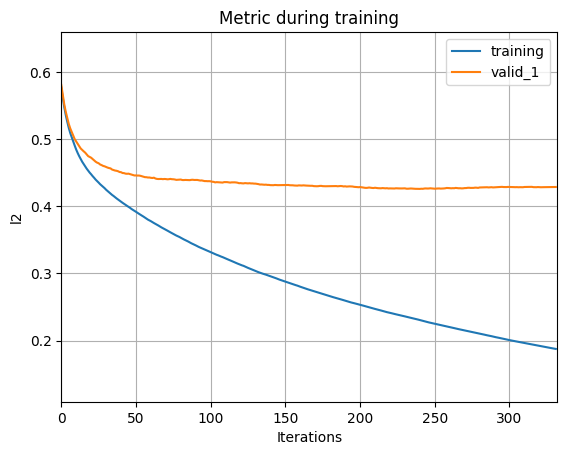

----> || Train Optimized QWK SCORE ::  0.793
----> || Val Optimized QWK SCORE ::  0.521
----> || Train Optimized Val QWK SCORE ::  0.497
----> || Val Optimized Train QWK SCORE ::  0.775
Fold 1 - Rounded Train QWK: 0.6971, Rounded Validation QWK: 0.3758


<Figure size 640x480 with 0 Axes>

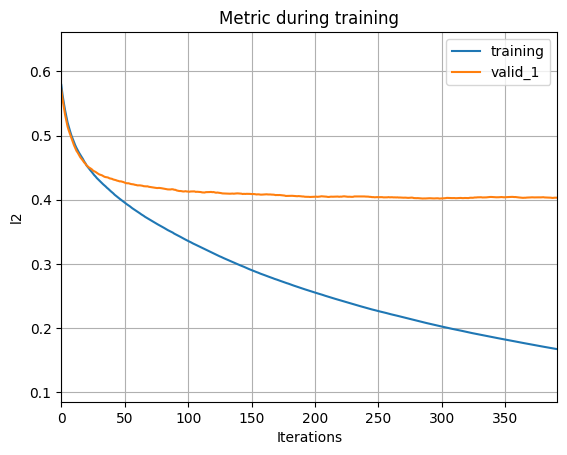

----> || Train Optimized QWK SCORE ::  0.821
----> || Val Optimized QWK SCORE ::  0.551
----> || Train Optimized Val QWK SCORE ::  0.517
----> || Val Optimized Train QWK SCORE ::  0.800
Fold 2 - Rounded Train QWK: 0.7312, Rounded Validation QWK: 0.4794


<Figure size 640x480 with 0 Axes>

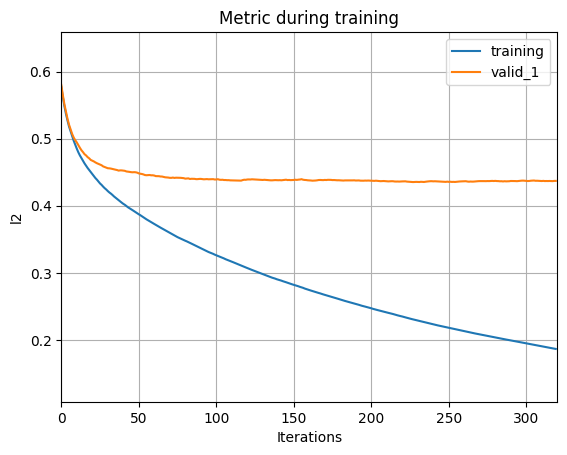

----> || Train Optimized QWK SCORE ::  0.794
----> || Val Optimized QWK SCORE ::  0.524
----> || Train Optimized Val QWK SCORE ::  0.506
----> || Val Optimized Train QWK SCORE ::  0.783
Fold 3 - Rounded Train QWK: 0.6945, Rounded Validation QWK: 0.3916


<Figure size 640x480 with 0 Axes>

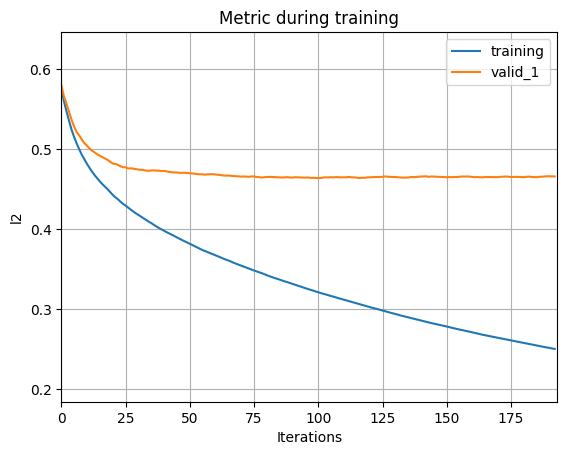

----> || Train Optimized QWK SCORE ::  0.675
----> || Val Optimized QWK SCORE ::  0.378
----> || Train Optimized Val QWK SCORE ::  0.422
----> || Val Optimized Train QWK SCORE ::  0.548
Fold 4 - Rounded Train QWK: 0.5592, Rounded Validation QWK: 0.3648


<Figure size 640x480 with 0 Axes>

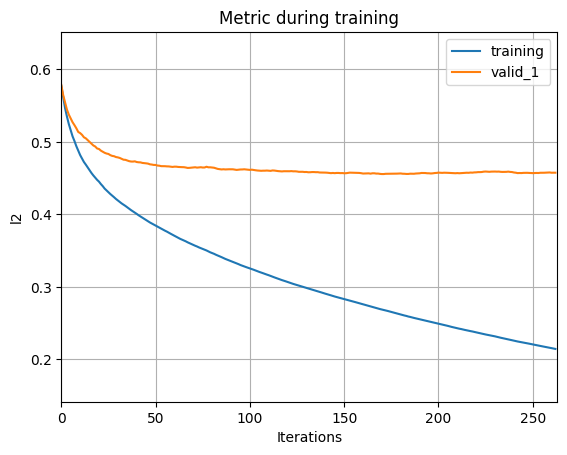

----> || Train Optimized QWK SCORE ::  0.744
----> || Val Optimized QWK SCORE ::  0.431
----> || Train Optimized Val QWK SCORE ::  0.428
----> || Val Optimized Train QWK SCORE ::  0.706
Fold 5 - Rounded Train QWK: 0.6443, Rounded Validation QWK: 0.3784
Mean Train QWK --> 0.7653
Mean Validation QWK ---> 0.4810
----> || Optimized QWK SCORE ::  0.503


In [117]:
lgb_models_list5, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds, lgb_optuna_study = lgb_feature_selection(
    train_selected_df5, test_selected_df5, 300
)

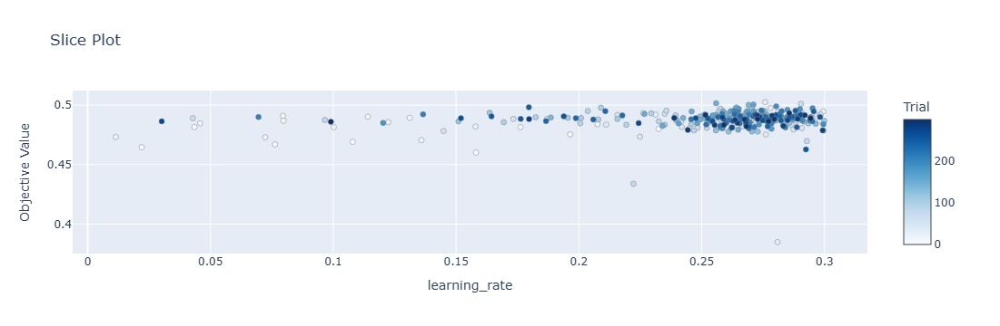

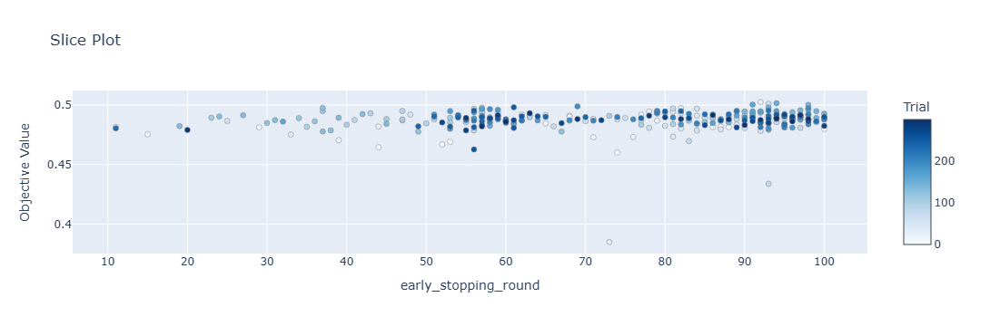

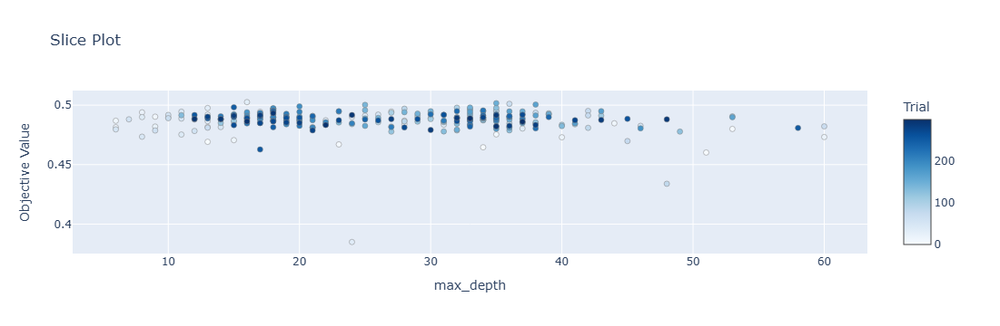

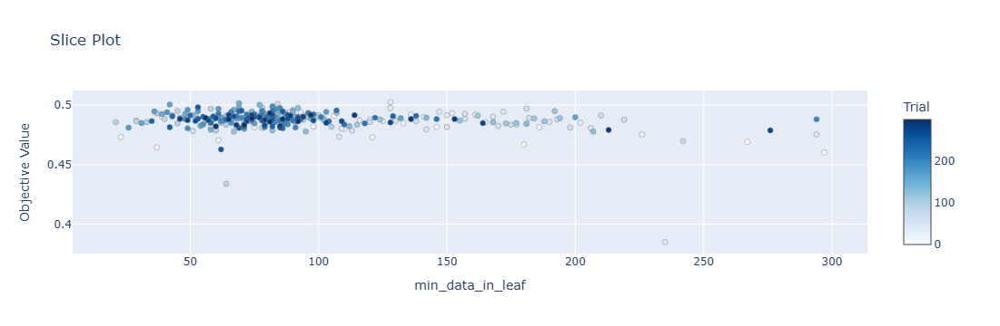

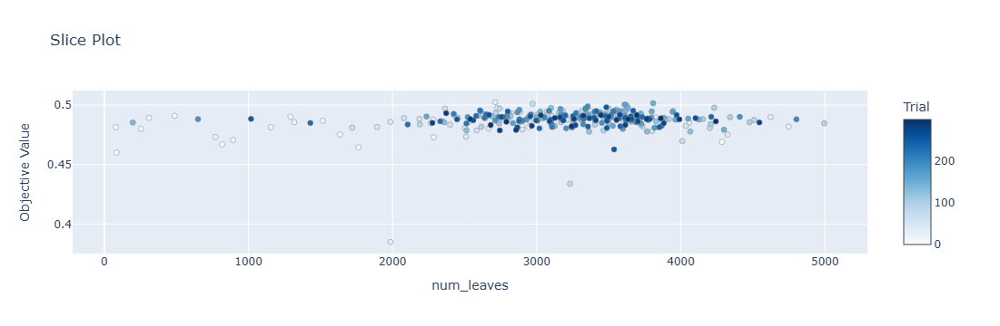

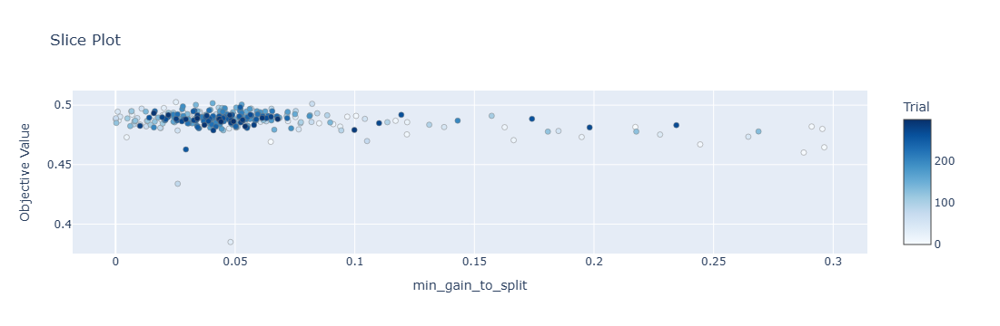

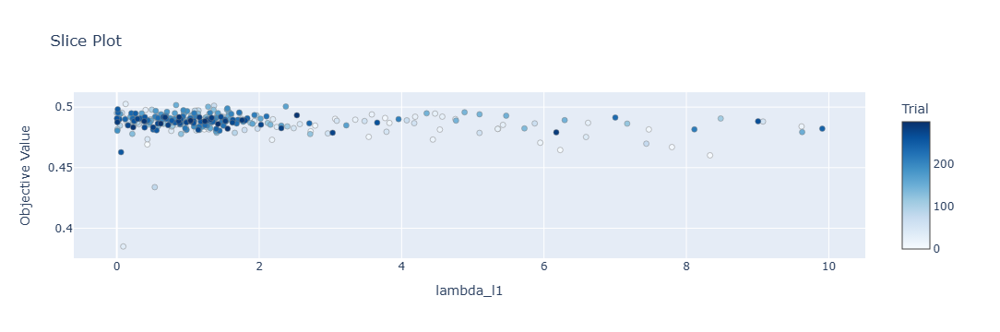

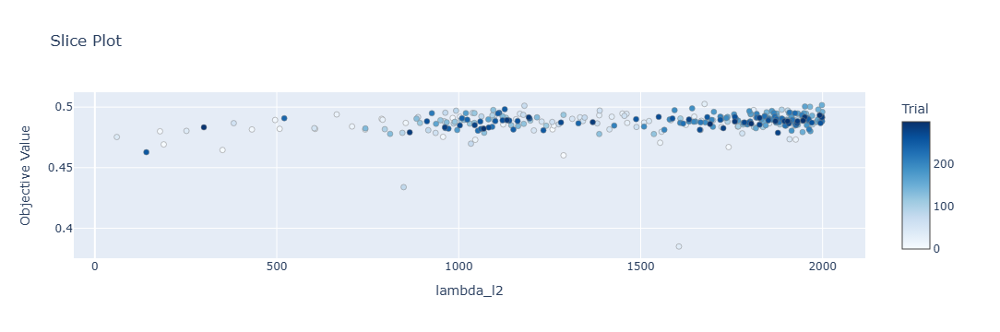

In [118]:
for param in lgb_optuna_study.best_params.keys():
    fig = plot_slice(lgb_optuna_study, params=[param])
    fig.show()

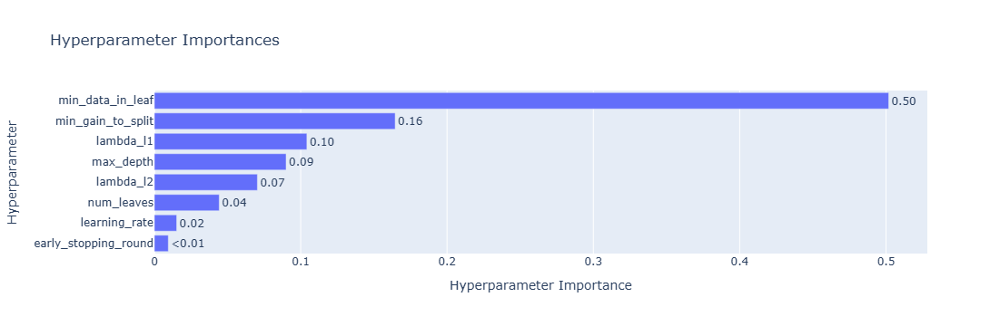

In [120]:
plot_param_importances(lgb_optuna_study)

In [121]:
lgb_optuna_study.best_params

{'learning_rate': 0.2758432486020966,
 'early_stopping_round': 92,
 'max_depth': 16,
 'min_data_in_leaf': 128,
 'num_leaves': 2711,
 'min_gain_to_split': 0.025229605540535063,
 'lambda_l1': 0.12467382568314633,
 'lambda_l2': 1675.6455149133144}

In [122]:
cols = train_selected_df5.drop(['id', 'sii'], axis=1).columns
importance_list = []
for model in lgb_models_list5:
    importance_list.append(model.feature_importances_)

importance_mean = np.mean(importance_list, axis=0)
imp_df = pd.DataFrame(sorted(zip(cols, importance_mean)), columns=['Feature', 'Importance']).sort_values('Importance', ascending=False)
unimportant_df = imp_df[imp_df['Importance'] < imp_df['Importance'].quantile(0.1)]
unimportant_cols = unimportant_df['Feature'].tolist()

In [123]:
train_selected_df6 = train_selected_df5.drop(unimportant_cols, axis=1)
print(train_selected_df6.shape)
train_selected_df6.head()

(2736, 173)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-HeartRate,Physical-Systolic_BP,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_SRL,FGC-FGC_TL,BIA-BIA_BMC,BIA-BIA_FFMI,BIA-BIA_Fat,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,enmo_std,anglez_max,light_1%,X_weekday_3_min,X_weekday_4_mean,X_weekday_4_entropy,X_weekday_5_entropy,X_weekday_6_max,Y_weekday_4_entropy,Y_weekday_6_std,Y_weekday_7_1%,Y_weekday_7_entropy,Z_weekday_1_min,Z_weekday_2_1%,Z_weekday_2_90%,Z_weekday_3_std,Z_weekday_3_entropy,Z_weekday_4_25%,Z_weekday_5_std,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_max,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_6_max,anglez_weekday_3_entropy,light_weekday_4_mean,light_weekday_4_max,light_weekday_4_entropy,battery_use_since_wear_weekday_2_30%,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_max,battery_use_since_wear_weekday_7_35%,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_1_sum,X_time_of_day_hour_window_1_entropy,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_5_sum,X_time_of_day_hour_window_5_entropy,X_time_of_day_hour_window_6_entropy,X_time_of_day_hour_window_7_1%,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_20_min,X_time_of_day_hour_window_22_max,X_time_of_day_hour_window_22_sum,X_time_of_day_hour_window_23_mean,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_2_mean,Y_time_of_day_hour_window_2_std,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_4_std,Y_time_of_day_hour_window_4_1%,Y_time_of_day_hour_window_4_65%,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_7_1%,Y_time_of_day_hour_window_7_sum,Y_time_of_day_hour_window_7_entropy,Y_time_of_day_hour_window_8_mean,Y_time_of_day_hour_window_9_sum,Y_time_of_day_hour_window_9_entropy,Y_time_of_day_hour_window_10_mean,Y_time_of_day_hour_window_10_entropy,Y_time_of_day_hour_window_11_mean,Y_time_of_day_hour_window_12_std,Y_time_of_day_hour_window_13_3%,Y_time_of_day_hour_window_13_max,Y_time_of_day_hour_window_15_min,Y_time_of_day_hour_window_19_sum,Y_time_of_day_hour_window_20_sum,Y_time_of_day_hour_window_21_sum,Y_time_of_day_hour_window_21_entropy,Y_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_0_min,Z_time_of_day_hour_window_1_mean,Z_time_of_day_hour_window_1_sum,Z_time_of_day_hour_window_2_std,Z_time_of_day_hour_window_3_std,Z_time_of_day_hour_window_5_mean,Z_time_of_day_hour_window_5_sum,Z_time_of_day_hour_window_9_max,Z_time_of_day_hour_window_9_sum,Z_time_of_day_hour_window_10_max,Z_time_of_day_hour_window_12_entropy,Z_time_of_day_hour_window_13_min,Z_time_of_day_hour_window_15_std,Z_time_of_day_hour_window_15_entropy,Z_time_of_day_hour_window_16_max,Z_time_of_day_hour_window_20_mean,Z_time_of_day_hour_window_20_min,Z_time_of_day_hour_window_20_max,Z_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_22_max,Z_time_of_day_hour_window_23_mean,Z_time_of_day_hour_window_23_std,Z_time_of_day_hour_window_23_min,enmo_time_of_day_hour_window_1_std,enmo_time_of_day_hour_window_5_25%,enmo_time_of_day_hour_window_6_sum,enmo_time_of_day_hour_window_8_sum,enmo_time_of_day_hour_window_10_mean,enmo_time_of_day_hour_window_15_10%,enmo_time_of_day_hour_window_19_10%,enmo_time_of_day_hour_window_20_10%,enmo_time_of_day_hour_window_21_mean,enmo_time_of_day_hour_window_21_sum,anglez_time_of_day_hour_window_4_entropy,anglez_time_of_day_hour_window_12_min,anglez_time_of_day_hour_window_15_entropy,light_time_of_day_hour_window_5_70%,light_time_of_day_hour_window_7_max,light_time_of_day_hour_window_8_mean,light_time_of_da

In [124]:
test_selected_df6 = test_selected_df5.drop(unimportant_cols, axis=1)
print(test_selected_df6.shape)
test_selected_df6.head()

(20, 172)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-HeartRate,Physical-Systolic_BP,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_SRL,FGC-FGC_TL,BIA-BIA_BMC,BIA-BIA_FFMI,BIA-BIA_Fat,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,enmo_std,anglez_max,light_1%,X_weekday_3_min,X_weekday_4_mean,X_weekday_4_entropy,X_weekday_5_entropy,X_weekday_6_max,Y_weekday_4_entropy,Y_weekday_6_std,Y_weekday_7_1%,Y_weekday_7_entropy,Z_weekday_1_min,Z_weekday_2_1%,Z_weekday_2_90%,Z_weekday_3_std,Z_weekday_3_entropy,Z_weekday_4_25%,Z_weekday_5_std,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_max,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_6_max,anglez_weekday_3_entropy,light_weekday_4_mean,light_weekday_4_max,light_weekday_4_entropy,battery_use_since_wear_weekday_2_30%,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_max,battery_use_since_wear_weekday_7_35%,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_1_sum,X_time_of_day_hour_window_1_entropy,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_5_sum,X_time_of_day_hour_window_5_entropy,X_time_of_day_hour_window_6_entropy,X_time_of_day_hour_window_7_1%,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_20_min,X_time_of_day_hour_window_22_max,X_time_of_day_hour_window_22_sum,X_time_of_day_hour_window_23_mean,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_2_mean,Y_time_of_day_hour_window_2_std,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_4_std,Y_time_of_day_hour_window_4_1%,Y_time_of_day_hour_window_4_65%,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_7_1%,Y_time_of_day_hour_window_7_sum,Y_time_of_day_hour_window_7_entropy,Y_time_of_day_hour_window_8_mean,Y_time_of_day_hour_window_9_sum,Y_time_of_day_hour_window_9_entropy,Y_time_of_day_hour_window_10_mean,Y_time_of_day_hour_window_10_entropy,Y_time_of_day_hour_window_11_mean,Y_time_of_day_hour_window_12_std,Y_time_of_day_hour_window_13_3%,Y_time_of_day_hour_window_13_max,Y_time_of_day_hour_window_15_min,Y_time_of_day_hour_window_19_sum,Y_time_of_day_hour_window_20_sum,Y_time_of_day_hour_window_21_sum,Y_time_of_day_hour_window_21_entropy,Y_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_0_min,Z_time_of_day_hour_window_1_mean,Z_time_of_day_hour_window_1_sum,Z_time_of_day_hour_window_2_std,Z_time_of_day_hour_window_3_std,Z_time_of_day_hour_window_5_mean,Z_time_of_day_hour_window_5_sum,Z_time_of_day_hour_window_9_max,Z_time_of_day_hour_window_9_sum,Z_time_of_day_hour_window_10_max,Z_time_of_day_hour_window_12_entropy,Z_time_of_day_hour_window_13_min,Z_time_of_day_hour_window_15_std,Z_time_of_day_hour_window_15_entropy,Z_time_of_day_hour_window_16_max,Z_time_of_day_hour_window_20_mean,Z_time_of_day_hour_window_20_min,Z_time_of_day_hour_window_20_max,Z_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_22_max,Z_time_of_day_hour_window_23_mean,Z_time_of_day_hour_window_23_std,Z_time_of_day_hour_window_23_min,enmo_time_of_day_hour_window_1_std,enmo_time_of_day_hour_window_5_25%,enmo_time_of_day_hour_window_6_sum,enmo_time_of_day_hour_window_8_sum,enmo_time_of_day_hour_window_10_mean,enmo_time_of_day_hour_window_15_10%,enmo_time_of_day_hour_window_19_10%,enmo_time_of_day_hour_window_20_10%,enmo_time_of_day_hour_window_21_mean,enmo_time_of_day_hour_window_21_sum,anglez_time_of_day_hour_window_4_entropy,anglez_time_of_day_hour_window_12_min,anglez_time_of_day_hour_window_15_entropy,light_time_of_day_hour_window_5_70%,light_time_of_day_hour_window_7_max,light_time_of_day_hour_window_8_mean,light_time_of_da



Optimizing:   0%|                                                                           | 0/350 [00:00<?, ?trial/s]

Optimizing:   0%|▏                                                                  | 1/350 [00:06<37:50,  6.51s/trial]

Optimizing:   1%|▍                                                                  | 2/350 [00:09<24:38,  4.25s/trial]

Optimizing:   1%|▌                                                                  | 3/350 [00:12<21:46,  3.76s/trial]

Optimizing:   1%|▊                                                                  | 4/350 [00:14<18:36,  3.23s/trial]

Optimizing:   1%|▉                                                                  | 5/350 [00:18<19:43,  3.43s/trial]

Optimizing:   2%|█▏                                                                 | 6/350 [00:25<26:40,  4.65s/trial]

Optimizing:   2%|█▎                                                                 | 7/350 [00:30<27:07,  4.75s/trial]

Optimizing:   2%|█▌           

<Figure size 640x480 with 0 Axes>

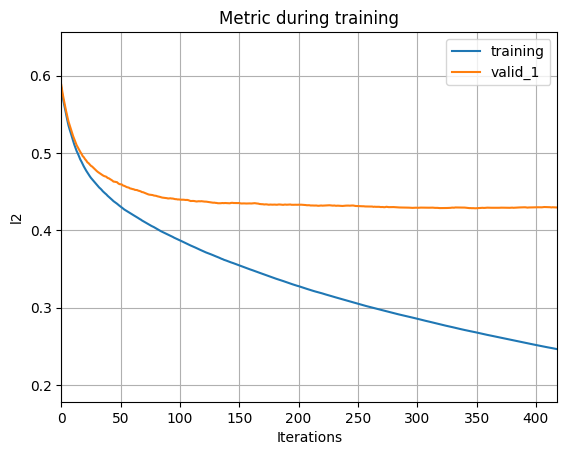

----> || Train Optimized QWK SCORE ::  0.752
----> || Val Optimized QWK SCORE ::  0.393
----> || Train Optimized Val QWK SCORE ::  0.508
----> || Val Optimized Train QWK SCORE ::  0.631
Fold 1 - Rounded Train QWK: 0.6388, Rounded Validation QWK: 0.3914


<Figure size 640x480 with 0 Axes>

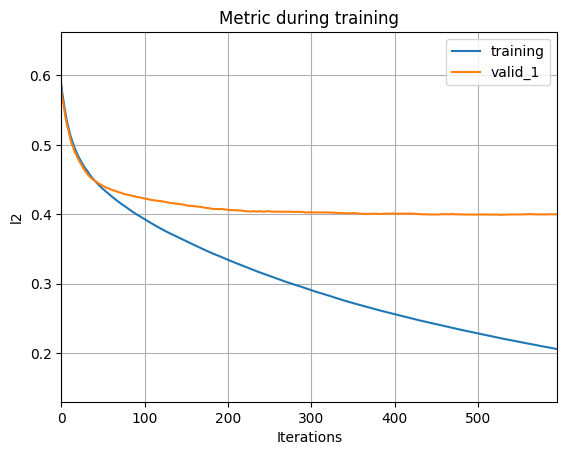

----> || Train Optimized QWK SCORE ::  0.801
----> || Val Optimized QWK SCORE ::  0.534
----> || Train Optimized Val QWK SCORE ::  0.532
----> || Val Optimized Train QWK SCORE ::  0.780
Fold 2 - Rounded Train QWK: 0.7134, Rounded Validation QWK: 0.4675


<Figure size 640x480 with 0 Axes>

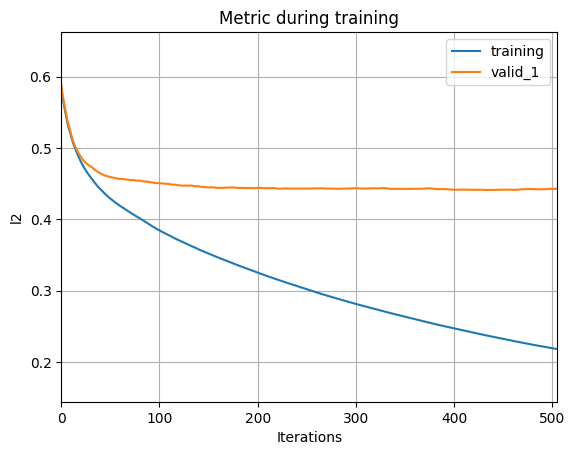

----> || Train Optimized QWK SCORE ::  0.786
----> || Val Optimized QWK SCORE ::  0.505
----> || Train Optimized Val QWK SCORE ::  0.494
----> || Val Optimized Train QWK SCORE ::  0.780
Fold 3 - Rounded Train QWK: 0.6842, Rounded Validation QWK: 0.3870


<Figure size 640x480 with 0 Axes>

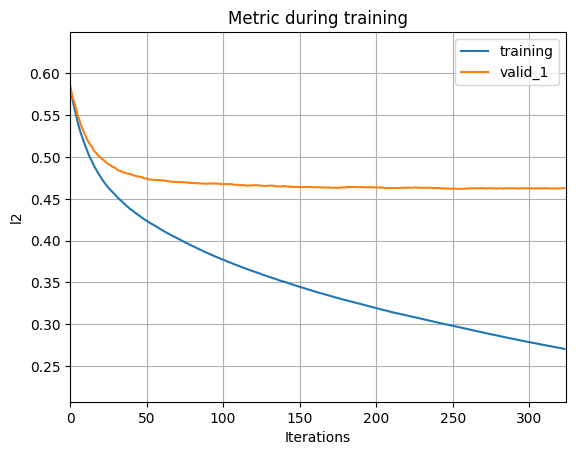

----> || Train Optimized QWK SCORE ::  0.704
----> || Val Optimized QWK SCORE ::  0.461
----> || Train Optimized Val QWK SCORE ::  0.456
----> || Val Optimized Train QWK SCORE ::  0.619
Fold 4 - Rounded Train QWK: 0.6121, Rounded Validation QWK: 0.3588


<Figure size 640x480 with 0 Axes>

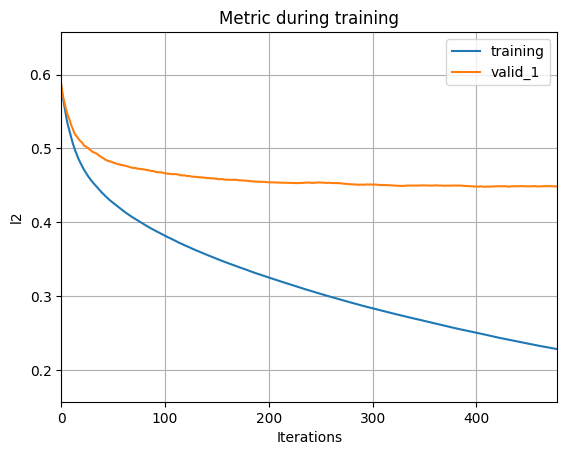

----> || Train Optimized QWK SCORE ::  0.767
----> || Val Optimized QWK SCORE ::  0.432
----> || Train Optimized Val QWK SCORE ::  0.433
----> || Val Optimized Train QWK SCORE ::  0.694
Fold 5 - Rounded Train QWK: 0.6733, Rounded Validation QWK: 0.4127
Mean Train QWK --> 0.7620
Mean Validation QWK ---> 0.4652
----> || Optimized QWK SCORE ::  0.501


In [128]:
lgb_models_list6, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds, lgb_optuna_study = lgb_feature_selection(
    train_selected_df6, test_selected_df6, 350
)

In [130]:
lgb_optuna_study.best_params

{'learning_rate': 0.17771718523359079,
 'early_stopping_round': 68,
 'max_depth': 35,
 'min_data_in_leaf': 169,
 'num_leaves': 3795,
 'min_gain_to_split': 0.03232559532065761,
 'lambda_l1': 0.6380714987756109,
 'lambda_l2': 1755.6606142349938}

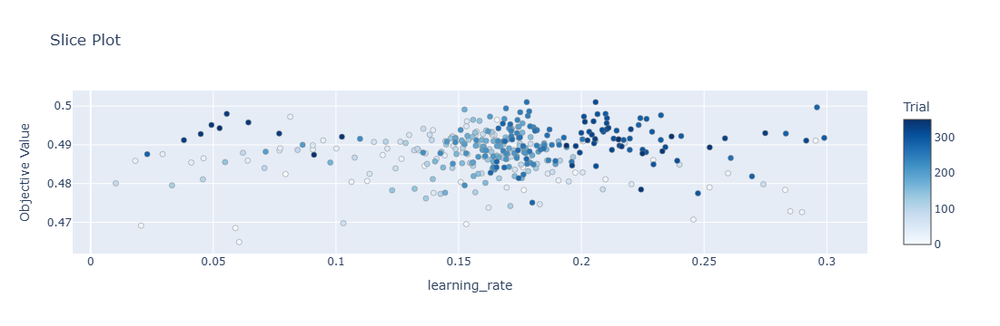

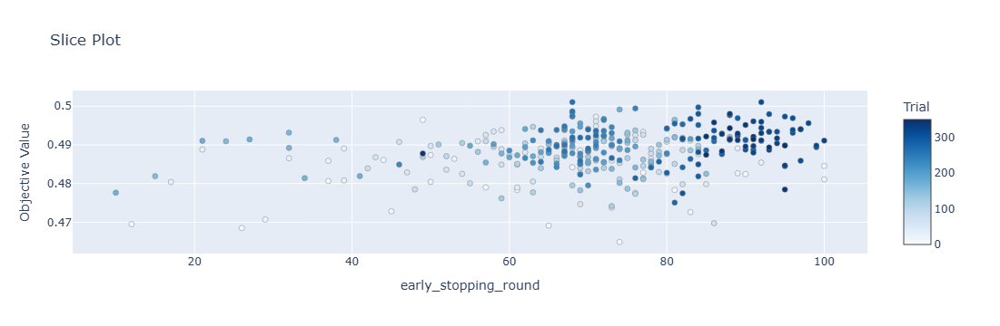

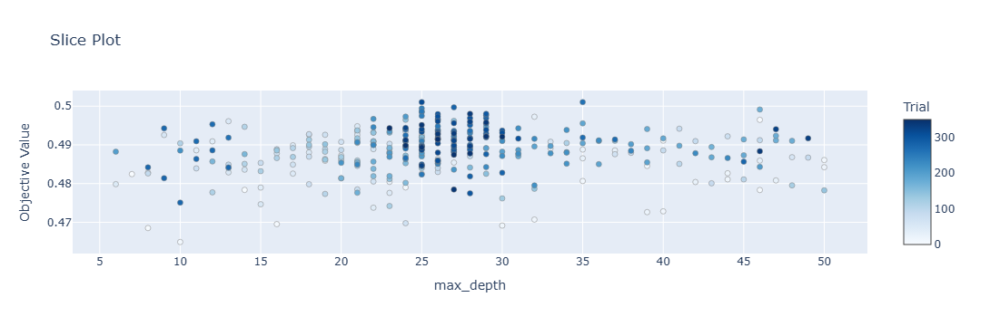

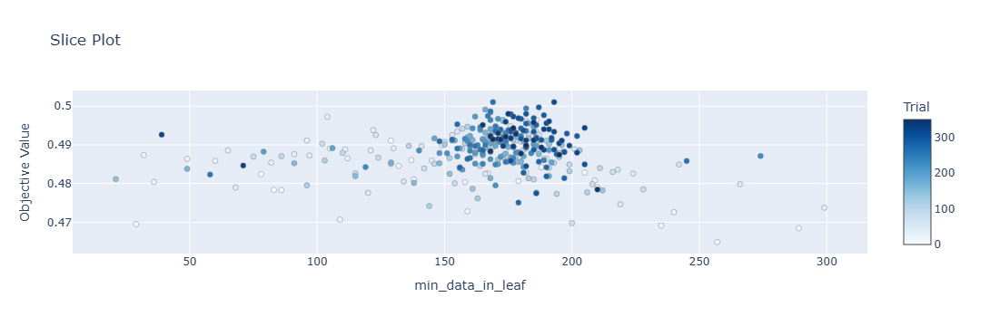

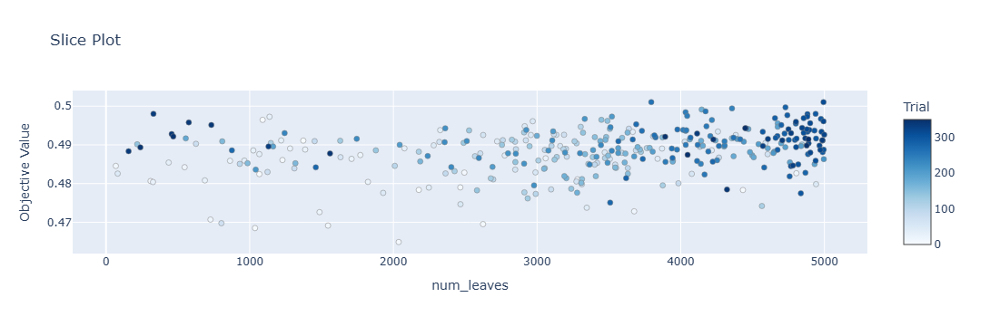

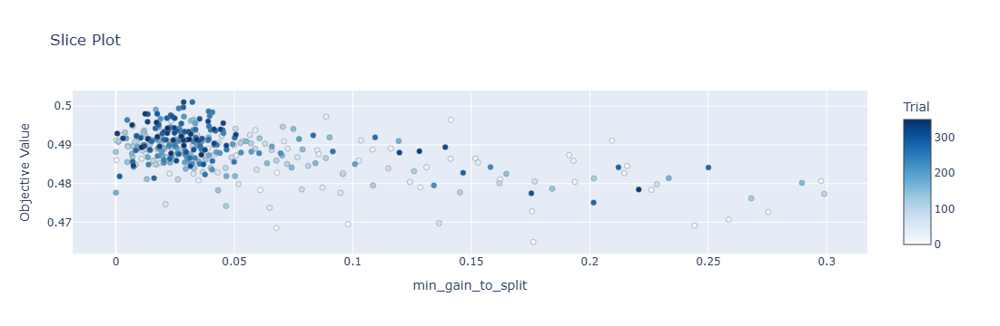

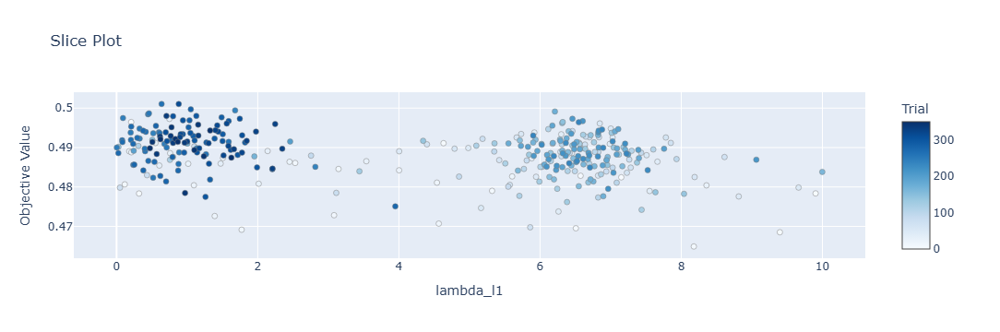

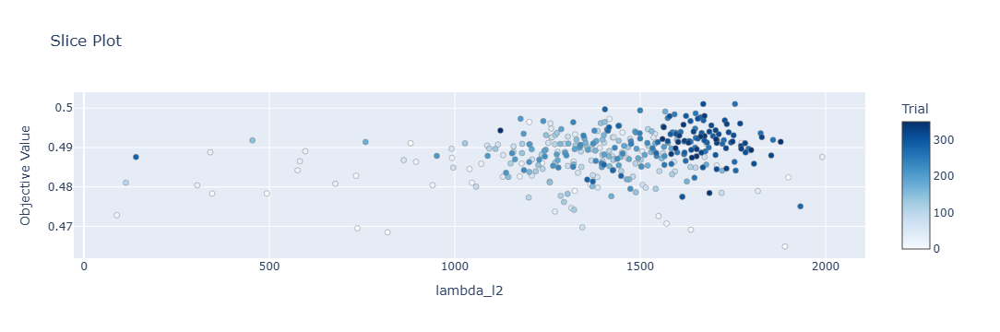

In [129]:
for param in lgb_optuna_study.best_params.keys():
    fig = plot_slice(lgb_optuna_study, params=[param])
    fig.show()

Exception ignored in: <function Booster.__del__ at 0x0000028E87B2F9C0>
Traceback (most recent call last):
  File "I:\Kaggle\kaggle_venvs\ml\Lib\site-packages\lightgbm\basic.py", line 3713, in __del__
    _safe_call(_LIB.LGBM_BoosterFree(self._handle))
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
OSError: exception: access violation reading 0x0000000100000021
Optimizing:   1%|▌                                                            | 3/350 [56:49<109:32:55, 1136.53s/trial]


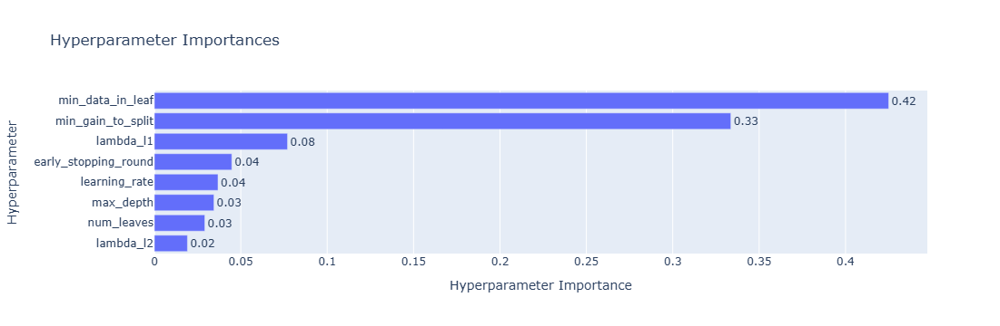

In [132]:
plot_param_importances(lgb_optuna_study)

In [133]:
cols = train_selected_df6.drop(['id', 'sii'], axis=1).columns
importance_list = []
for model in lgb_models_list6:
    importance_list.append(model.feature_importances_)

importance_mean = np.mean(importance_list, axis=0)
imp_df = pd.DataFrame(sorted(zip(cols, importance_mean)), columns=['Feature', 'Importance']).sort_values('Importance', ascending=False)
unimportant_df = imp_df[imp_df['Importance'] < imp_df['Importance'].quantile(0.1)]
unimportant_cols = unimportant_df['Feature'].tolist()

In [134]:
train_selected_df7 = train_selected_df6.drop(unimportant_cols, axis=1)
print(train_selected_df7.shape)
train_selected_df7.head()

(2736, 161)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-HeartRate,Physical-Systolic_BP,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_SRL,FGC-FGC_TL,BIA-BIA_BMC,BIA-BIA_FFMI,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,enmo_std,anglez_max,light_1%,X_weekday_3_min,X_weekday_4_mean,X_weekday_4_entropy,X_weekday_6_max,Y_weekday_4_entropy,Y_weekday_7_1%,Y_weekday_7_entropy,Z_weekday_1_min,Z_weekday_2_1%,Z_weekday_2_90%,Z_weekday_3_std,Z_weekday_3_entropy,Z_weekday_4_25%,Z_weekday_5_std,Z_weekday_6_mean,Z_weekday_6_std,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_6_max,anglez_weekday_3_entropy,light_weekday_4_mean,light_weekday_4_max,light_weekday_4_entropy,battery_use_since_wear_weekday_2_30%,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_max,battery_use_since_wear_weekday_7_35%,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_1_sum,X_time_of_day_hour_window_1_entropy,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_5_entropy,X_time_of_day_hour_window_6_entropy,X_time_of_day_hour_window_7_1%,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_20_min,X_time_of_day_hour_window_22_max,X_time_of_day_hour_window_22_sum,X_time_of_day_hour_window_23_mean,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_2_std,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_4_std,Y_time_of_day_hour_window_4_65%,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_7_1%,Y_time_of_day_hour_window_7_sum,Y_time_of_day_hour_window_7_entropy,Y_time_of_day_hour_window_8_mean,Y_time_of_day_hour_window_9_sum,Y_time_of_day_hour_window_9_entropy,Y_time_of_day_hour_window_10_mean,Y_time_of_day_hour_window_10_entropy,Y_time_of_day_hour_window_11_mean,Y_time_of_day_hour_window_12_std,Y_time_of_day_hour_window_13_3%,Y_time_of_day_hour_window_13_max,Y_time_of_day_hour_window_15_min,Y_time_of_day_hour_window_19_sum,Y_time_of_day_hour_window_20_sum,Y_time_of_day_hour_window_21_sum,Y_time_of_day_hour_window_21_entropy,Y_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_0_min,Z_time_of_day_hour_window_1_mean,Z_time_of_day_hour_window_3_std,Z_time_of_day_hour_window_5_mean,Z_time_of_day_hour_window_5_sum,Z_time_of_day_hour_window_9_max,Z_time_of_day_hour_window_9_sum,Z_time_of_day_hour_window_10_max,Z_time_of_day_hour_window_13_min,Z_time_of_day_hour_window_15_std,Z_time_of_day_hour_window_15_entropy,Z_time_of_day_hour_window_16_max,Z_time_of_day_hour_window_20_mean,Z_time_of_day_hour_window_20_min,Z_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_22_max,Z_time_of_day_hour_window_23_mean,Z_time_of_day_hour_window_23_std,Z_time_of_day_hour_window_23_min,enmo_time_of_day_hour_window_1_std,enmo_time_of_day_hour_window_5_25%,enmo_time_of_day_hour_window_6_sum,enmo_time_of_day_hour_window_8_sum,enmo_time_of_day_hour_window_10_mean,enmo_time_of_day_hour_window_15_10%,enmo_time_of_day_hour_window_19_10%,enmo_time_of_day_hour_window_20_10%,enmo_time_of_day_hour_window_21_mean,enmo_time_of_day_hour_window_21_sum,anglez_time_of_day_hour_window_4_entropy,anglez_time_of_day_hour_window_12_min,anglez_time_of_day_hour_window_15_entropy,light_time_of_day_hour_window_5_70%,light_time_of_day_hour_window_7_max,light_time_of_day_hour_window_8_mean,light_time_of_day_hour_window_8_std,light_time_of_day_hour_window_10_max,light_time_of_day_hour_window_12_1%,light_time_of_day_hour_window_13_max,light_time_of_day_hour_window_15_3%,light_time_of_day_hour_window_15_40%,light_time_of_day_hour_window_15_max,light_time_of_day_hour_window_16_3%,light_time_of_day_

In [135]:
test_selected_df7 = test_selected_df6.drop(unimportant_cols, axis=1)
print(test_selected_df7.shape)
test_selected_df7.head()

(20, 160)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-HeartRate,Physical-Systolic_BP,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_SRL,FGC-FGC_TL,BIA-BIA_BMC,BIA-BIA_FFMI,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,enmo_std,anglez_max,light_1%,X_weekday_3_min,X_weekday_4_mean,X_weekday_4_entropy,X_weekday_6_max,Y_weekday_4_entropy,Y_weekday_7_1%,Y_weekday_7_entropy,Z_weekday_1_min,Z_weekday_2_1%,Z_weekday_2_90%,Z_weekday_3_std,Z_weekday_3_entropy,Z_weekday_4_25%,Z_weekday_5_std,Z_weekday_6_mean,Z_weekday_6_std,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_6_max,anglez_weekday_3_entropy,light_weekday_4_mean,light_weekday_4_max,light_weekday_4_entropy,battery_use_since_wear_weekday_2_30%,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_max,battery_use_since_wear_weekday_7_35%,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_1_sum,X_time_of_day_hour_window_1_entropy,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_5_entropy,X_time_of_day_hour_window_6_entropy,X_time_of_day_hour_window_7_1%,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_20_min,X_time_of_day_hour_window_22_max,X_time_of_day_hour_window_22_sum,X_time_of_day_hour_window_23_mean,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_2_std,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_4_std,Y_time_of_day_hour_window_4_65%,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_7_1%,Y_time_of_day_hour_window_7_sum,Y_time_of_day_hour_window_7_entropy,Y_time_of_day_hour_window_8_mean,Y_time_of_day_hour_window_9_sum,Y_time_of_day_hour_window_9_entropy,Y_time_of_day_hour_window_10_mean,Y_time_of_day_hour_window_10_entropy,Y_time_of_day_hour_window_11_mean,Y_time_of_day_hour_window_12_std,Y_time_of_day_hour_window_13_3%,Y_time_of_day_hour_window_13_max,Y_time_of_day_hour_window_15_min,Y_time_of_day_hour_window_19_sum,Y_time_of_day_hour_window_20_sum,Y_time_of_day_hour_window_21_sum,Y_time_of_day_hour_window_21_entropy,Y_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_0_min,Z_time_of_day_hour_window_1_mean,Z_time_of_day_hour_window_3_std,Z_time_of_day_hour_window_5_mean,Z_time_of_day_hour_window_5_sum,Z_time_of_day_hour_window_9_max,Z_time_of_day_hour_window_9_sum,Z_time_of_day_hour_window_10_max,Z_time_of_day_hour_window_13_min,Z_time_of_day_hour_window_15_std,Z_time_of_day_hour_window_15_entropy,Z_time_of_day_hour_window_16_max,Z_time_of_day_hour_window_20_mean,Z_time_of_day_hour_window_20_min,Z_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_22_max,Z_time_of_day_hour_window_23_mean,Z_time_of_day_hour_window_23_std,Z_time_of_day_hour_window_23_min,enmo_time_of_day_hour_window_1_std,enmo_time_of_day_hour_window_5_25%,enmo_time_of_day_hour_window_6_sum,enmo_time_of_day_hour_window_8_sum,enmo_time_of_day_hour_window_10_mean,enmo_time_of_day_hour_window_15_10%,enmo_time_of_day_hour_window_19_10%,enmo_time_of_day_hour_window_20_10%,enmo_time_of_day_hour_window_21_mean,enmo_time_of_day_hour_window_21_sum,anglez_time_of_day_hour_window_4_entropy,anglez_time_of_day_hour_window_12_min,anglez_time_of_day_hour_window_15_entropy,light_time_of_day_hour_window_5_70%,light_time_of_day_hour_window_7_max,light_time_of_day_hour_window_8_mean,light_time_of_day_hour_window_8_std,light_time_of_day_hour_window_10_max,light_time_of_day_hour_window_12_1%,light_time_of_day_hour_window_13_max,light_time_of_day_hour_window_15_3%,light_time_of_day_hour_window_15_40%,light_time_of_day_hour_window_15_max,light_time_of_day_hour_window_16_3%,light_time_of_day_

Optimizing: 100%|███████████████████████████████████████████████████████████████| 300/300 [3:38:13<00:00, 43.64s/trial]


<Figure size 640x480 with 0 Axes>

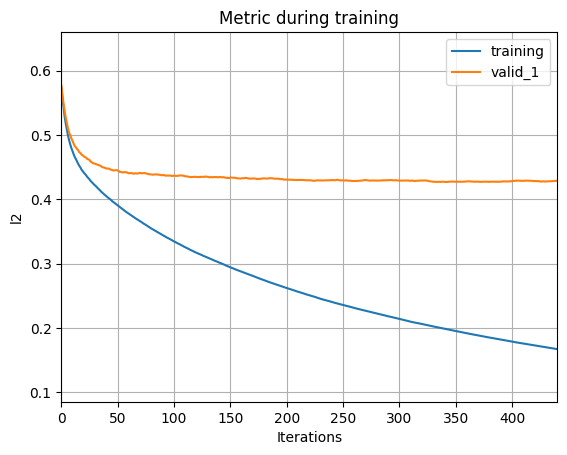

----> || Train Optimized QWK SCORE ::  0.829
----> || Val Optimized QWK SCORE ::  0.529
----> || Train Optimized Val QWK SCORE ::  0.508
----> || Val Optimized Train QWK SCORE ::  0.798
Fold 1 - Rounded Train QWK: 0.7354, Rounded Validation QWK: 0.4074


<Figure size 640x480 with 0 Axes>

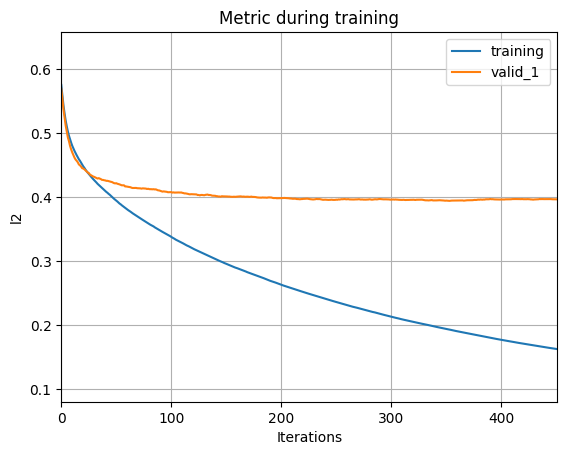

----> || Train Optimized QWK SCORE ::  0.828
----> || Val Optimized QWK SCORE ::  0.568
----> || Train Optimized Val QWK SCORE ::  0.550
----> || Val Optimized Train QWK SCORE ::  0.826
Fold 2 - Rounded Train QWK: 0.7500, Rounded Validation QWK: 0.4905


<Figure size 640x480 with 0 Axes>

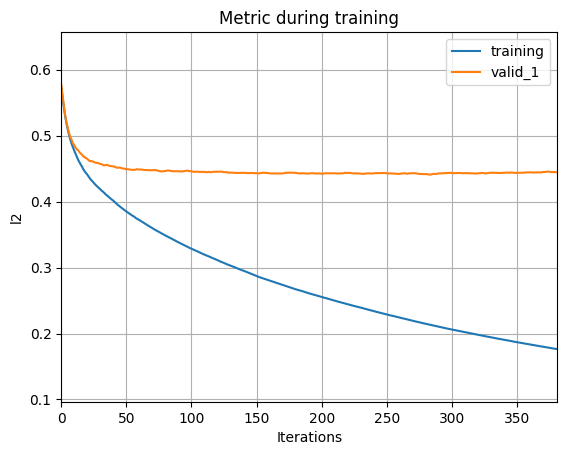

----> || Train Optimized QWK SCORE ::  0.812
----> || Val Optimized QWK SCORE ::  0.509
----> || Train Optimized Val QWK SCORE ::  0.500
----> || Val Optimized Train QWK SCORE ::  0.790
Fold 3 - Rounded Train QWK: 0.7103, Rounded Validation QWK: 0.4155


<Figure size 640x480 with 0 Axes>

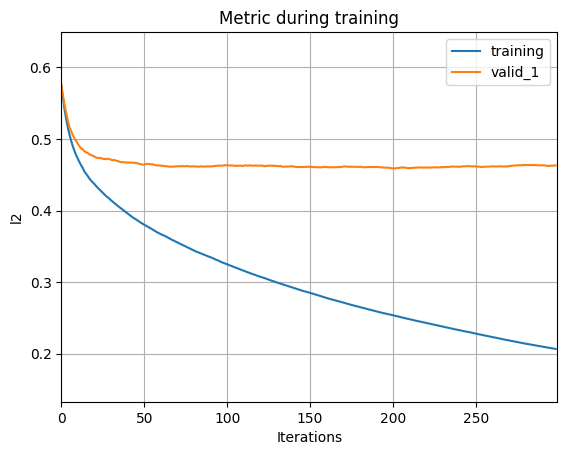

----> || Train Optimized QWK SCORE ::  0.767
----> || Val Optimized QWK SCORE ::  0.466
----> || Train Optimized Val QWK SCORE ::  0.470
----> || Val Optimized Train QWK SCORE ::  0.737
Fold 4 - Rounded Train QWK: 0.6699, Rounded Validation QWK: 0.3810


<Figure size 640x480 with 0 Axes>

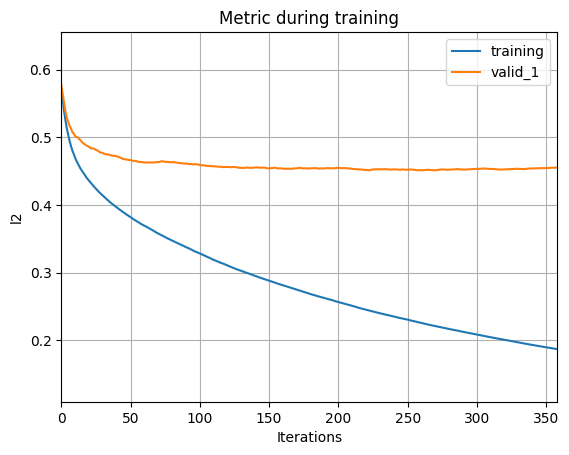

----> || Train Optimized QWK SCORE ::  0.809
----> || Val Optimized QWK SCORE ::  0.440
----> || Train Optimized Val QWK SCORE ::  0.445
----> || Val Optimized Train QWK SCORE ::  0.729
Fold 5 - Rounded Train QWK: 0.7053, Rounded Validation QWK: 0.3854
Mean Train QWK --> 0.8090
Mean Validation QWK ---> 0.5023
----> || Optimized QWK SCORE ::  0.502


In [160]:
lgb_models_list7, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds, lgb_optuna_study = lgb_feature_selection(
    train_selected_df7, test_selected_df7, 300
)

In [161]:
lgb_optuna_study.best_params

{'learning_rate': 0.286355766280258,
 'early_stopping_round': 97,
 'max_depth': 26,
 'min_data_in_leaf': 198,
 'num_leaves': 7710,
 'min_gain_to_split': 0.01797544418253491,
 'lambda_l1': 2.0663687897893257,
 'lambda_l2': 1188.3413094663483}

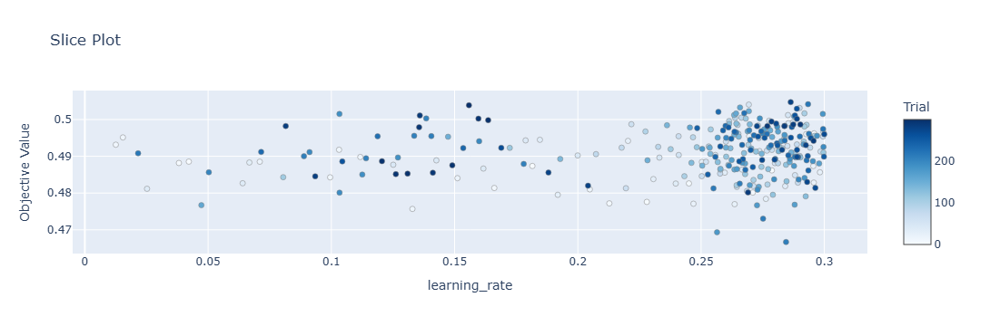

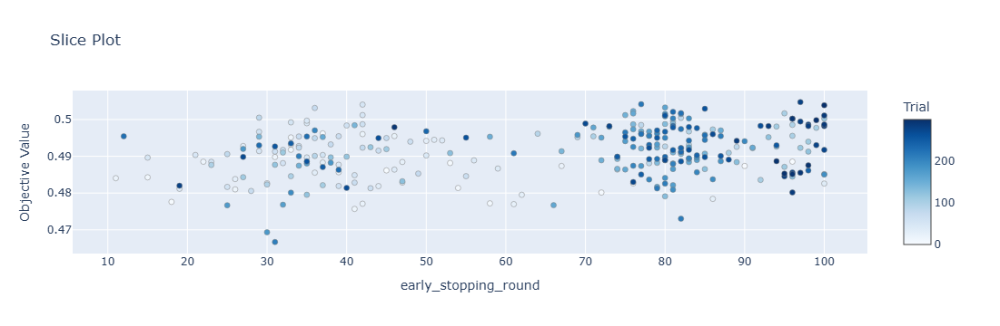

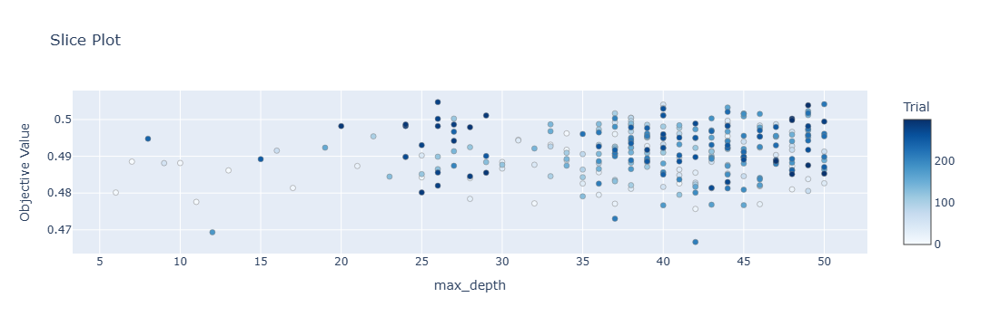

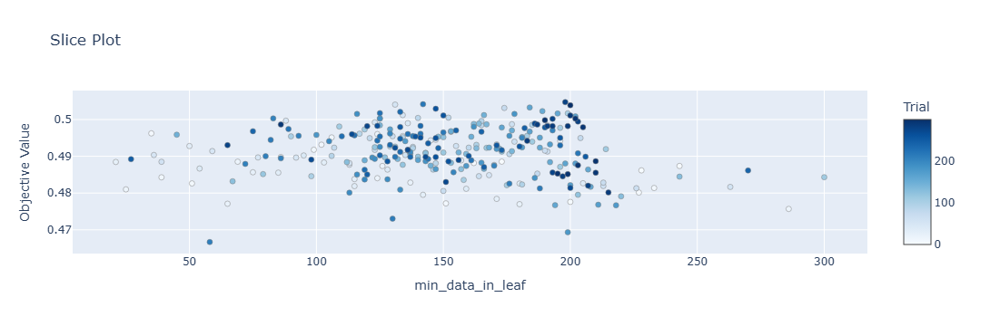

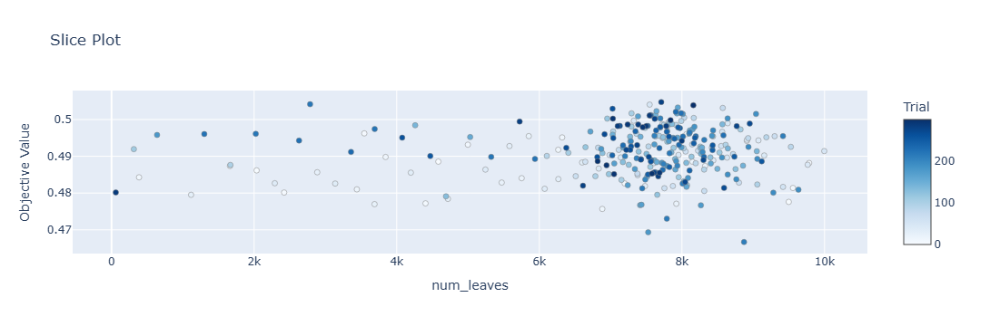

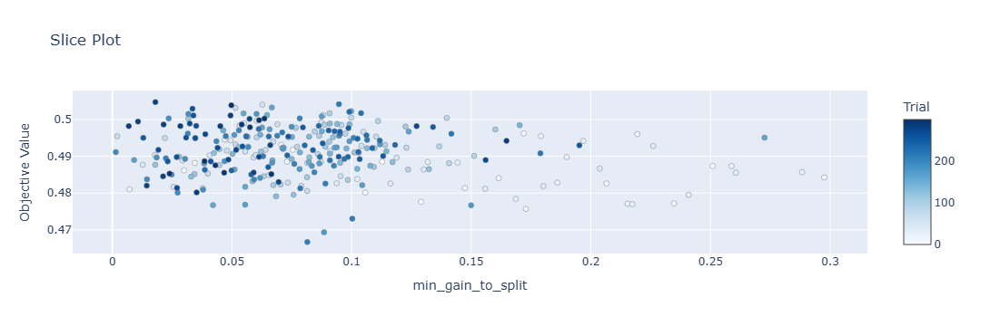

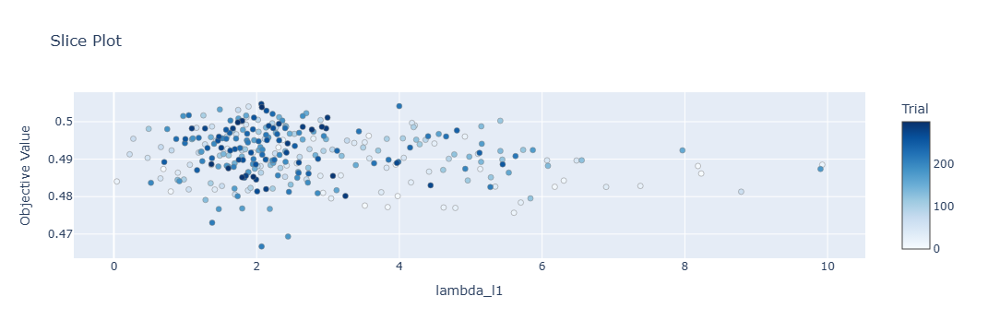

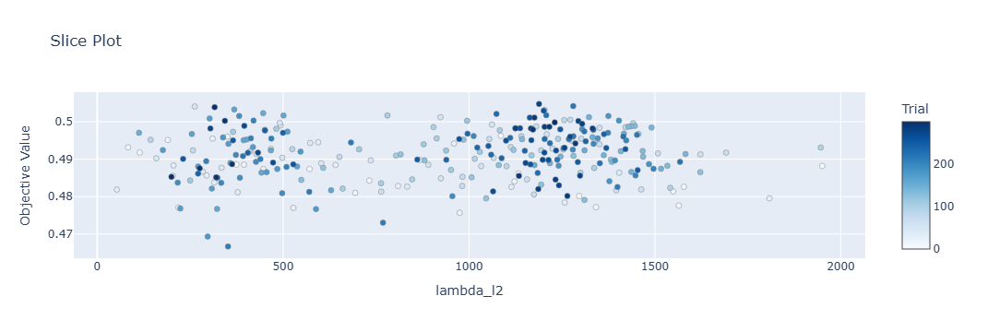

In [162]:
for param in lgb_optuna_study.best_params.keys():
    fig = plot_slice(lgb_optuna_study, params=[param])
    fig.show()

Exception ignored in: <function Booster.__del__ at 0x0000028E87B2F9C0>
Traceback (most recent call last):
  File "I:\Kaggle\kaggle_venvs\ml\Lib\site-packages\lightgbm\basic.py", line 3713, in __del__
    _safe_call(_LIB.LGBM_BoosterFree(self._handle))
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
OSError: exception: access violation writing 0x00007FF9FAC87328


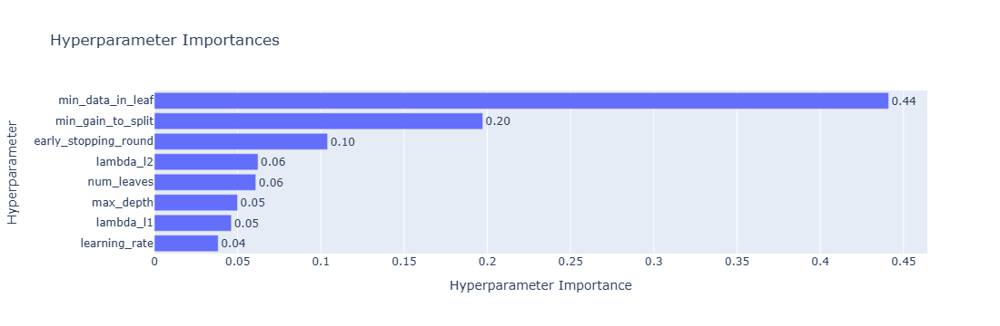

In [163]:
plot_param_importances(lgb_optuna_study)

In [165]:
cols = train_selected_df7.drop(['id', 'sii'], axis=1).columns
importance_list = []
for model in lgb_models_list7:
    importance_list.append(model.feature_importances_)

importance_mean = np.mean(importance_list, axis=0)
imp_df = pd.DataFrame(sorted(zip(cols, importance_mean)), columns=['Feature', 'Importance']).sort_values('Importance', ascending=False)
unimportant_df = imp_df[imp_df['Importance'] < imp_df['Importance'].quantile(0.1)]
unimportant_cols = unimportant_df['Feature'].tolist()

In [166]:
train_selected_df8 = train_selected_df7.drop(unimportant_cols, axis=1)
print(train_selected_df8.shape)
train_selected_df8.head()

(2736, 146)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Waist_Circumference,Physical-HeartRate,Physical-Systolic_BP,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_SRL,FGC-FGC_TL,BIA-BIA_BMC,BIA-BIA_FFMI,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,enmo_std,anglez_max,light_1%,X_weekday_3_min,X_weekday_4_mean,X_weekday_6_max,Y_weekday_7_1%,Y_weekday_7_entropy,Z_weekday_1_min,Z_weekday_2_1%,Z_weekday_2_90%,Z_weekday_3_std,Z_weekday_4_25%,Z_weekday_5_std,Z_weekday_6_mean,Z_weekday_6_std,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_6_max,anglez_weekday_3_entropy,light_weekday_4_mean,light_weekday_4_max,light_weekday_4_entropy,battery_use_since_wear_weekday_2_30%,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_max,battery_use_since_wear_weekday_7_35%,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_1_sum,X_time_of_day_hour_window_1_entropy,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_6_entropy,X_time_of_day_hour_window_7_1%,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_20_min,X_time_of_day_hour_window_22_max,X_time_of_day_hour_window_22_sum,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_2_std,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_4_std,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_7_1%,Y_time_of_day_hour_window_7_sum,Y_time_of_day_hour_window_7_entropy,Y_time_of_day_hour_window_8_mean,Y_time_of_day_hour_window_9_sum,Y_time_of_day_hour_window_9_entropy,Y_time_of_day_hour_window_10_mean,Y_time_of_day_hour_window_11_mean,Y_time_of_day_hour_window_12_std,Y_time_of_day_hour_window_13_3%,Y_time_of_day_hour_window_19_sum,Y_time_of_day_hour_window_20_sum,Y_time_of_day_hour_window_21_entropy,Y_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_0_min,Z_time_of_day_hour_window_1_mean,Z_time_of_day_hour_window_5_mean,Z_time_of_day_hour_window_5_sum,Z_time_of_day_hour_window_9_max,Z_time_of_day_hour_window_9_sum,Z_time_of_day_hour_window_10_max,Z_time_of_day_hour_window_13_min,Z_time_of_day_hour_window_15_std,Z_time_of_day_hour_window_15_entropy,Z_time_of_day_hour_window_16_max,Z_time_of_day_hour_window_20_mean,Z_time_of_day_hour_window_20_min,Z_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_22_max,Z_time_of_day_hour_window_23_std,Z_time_of_day_hour_window_23_min,enmo_time_of_day_hour_window_1_std,enmo_time_of_day_hour_window_5_25%,enmo_time_of_day_hour_window_6_sum,enmo_time_of_day_hour_window_8_sum,enmo_time_of_day_hour_window_10_mean,enmo_time_of_day_hour_window_15_10%,enmo_time_of_day_hour_window_19_10%,enmo_time_of_day_hour_window_20_10%,enmo_time_of_day_hour_window_21_mean,enmo_time_of_day_hour_window_21_sum,anglez_time_of_day_hour_window_4_entropy,anglez_time_of_day_hour_window_12_min,anglez_time_of_day_hour_window_15_entropy,light_time_of_day_hour_window_5_70%,light_time_of_day_hour_window_7_max,light_time_of_day_hour_window_8_mean,light_time_of_day_hour_window_8_std,light_time_of_day_hour_window_10_max,light_time_of_day_hour_window_12_1%,light_time_of_day_hour_window_13_max,light_time_of_day_hour_window_15_3%,light_time_of_day_hour_window_15_40%,light_time_of_day_hour_window_15_max,light_time_of_day_hour_window_16_3%,light_time_of_day_hour_window_19_35%,light_time_of_day_hour_window_19_max,light_time_of_day_hour_window_20_std,light_time_of_day_hour_window_21_mean,light_time_of_day_hour_window_21_45%,light_time_of_day_hour_window_22_1%,battery_use_since_wear_time_of_day_hour_window_0_1%,battery_use_since_wear_time_of_day_hour_window_6_mean,battery_use_since_wear_time_of_day_hour_window_8_mean,battery_use_sinc

In [167]:
test_selected_df8 = test_selected_df7.drop(unimportant_cols, axis=1)
print(test_selected_df8.shape)
test_selected_df8.head()

(20, 145)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Waist_Circumference,Physical-HeartRate,Physical-Systolic_BP,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_SRL,FGC-FGC_TL,BIA-BIA_BMC,BIA-BIA_FFMI,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,enmo_std,anglez_max,light_1%,X_weekday_3_min,X_weekday_4_mean,X_weekday_6_max,Y_weekday_7_1%,Y_weekday_7_entropy,Z_weekday_1_min,Z_weekday_2_1%,Z_weekday_2_90%,Z_weekday_3_std,Z_weekday_4_25%,Z_weekday_5_std,Z_weekday_6_mean,Z_weekday_6_std,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_6_max,anglez_weekday_3_entropy,light_weekday_4_mean,light_weekday_4_max,light_weekday_4_entropy,battery_use_since_wear_weekday_2_30%,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_max,battery_use_since_wear_weekday_7_35%,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_1_sum,X_time_of_day_hour_window_1_entropy,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_6_entropy,X_time_of_day_hour_window_7_1%,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_20_min,X_time_of_day_hour_window_22_max,X_time_of_day_hour_window_22_sum,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_2_std,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_4_std,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_7_1%,Y_time_of_day_hour_window_7_sum,Y_time_of_day_hour_window_7_entropy,Y_time_of_day_hour_window_8_mean,Y_time_of_day_hour_window_9_sum,Y_time_of_day_hour_window_9_entropy,Y_time_of_day_hour_window_10_mean,Y_time_of_day_hour_window_11_mean,Y_time_of_day_hour_window_12_std,Y_time_of_day_hour_window_13_3%,Y_time_of_day_hour_window_19_sum,Y_time_of_day_hour_window_20_sum,Y_time_of_day_hour_window_21_entropy,Y_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_0_min,Z_time_of_day_hour_window_1_mean,Z_time_of_day_hour_window_5_mean,Z_time_of_day_hour_window_5_sum,Z_time_of_day_hour_window_9_max,Z_time_of_day_hour_window_9_sum,Z_time_of_day_hour_window_10_max,Z_time_of_day_hour_window_13_min,Z_time_of_day_hour_window_15_std,Z_time_of_day_hour_window_15_entropy,Z_time_of_day_hour_window_16_max,Z_time_of_day_hour_window_20_mean,Z_time_of_day_hour_window_20_min,Z_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_22_max,Z_time_of_day_hour_window_23_std,Z_time_of_day_hour_window_23_min,enmo_time_of_day_hour_window_1_std,enmo_time_of_day_hour_window_5_25%,enmo_time_of_day_hour_window_6_sum,enmo_time_of_day_hour_window_8_sum,enmo_time_of_day_hour_window_10_mean,enmo_time_of_day_hour_window_15_10%,enmo_time_of_day_hour_window_19_10%,enmo_time_of_day_hour_window_20_10%,enmo_time_of_day_hour_window_21_mean,enmo_time_of_day_hour_window_21_sum,anglez_time_of_day_hour_window_4_entropy,anglez_time_of_day_hour_window_12_min,anglez_time_of_day_hour_window_15_entropy,light_time_of_day_hour_window_5_70%,light_time_of_day_hour_window_7_max,light_time_of_day_hour_window_8_mean,light_time_of_day_hour_window_8_std,light_time_of_day_hour_window_10_max,light_time_of_day_hour_window_12_1%,light_time_of_day_hour_window_13_max,light_time_of_day_hour_window_15_3%,light_time_of_day_hour_window_15_40%,light_time_of_day_hour_window_15_max,light_time_of_day_hour_window_16_3%,light_time_of_day_hour_window_19_35%,light_time_of_day_hour_window_19_max,light_time_of_day_hour_window_20_std,light_time_of_day_hour_window_21_mean,light_time_of_day_hour_window_21_45%,light_time_of_day_hour_window_22_1%,battery_use_since_wear_time_of_day_hour_window_0_1%,battery_use_since_wear_time_of_day_hour_window_6_mean,battery_use_since_wear_time_of_day_hour_window_8_mean,battery_use_sinc

In [185]:
selected_cols = test_selected_df8.columns.tolist()
selected_cols_df = pd.DataFrame({'col':selected_cols})
selected_cols_df.to_csv(path + 'selected_cols.csv', index=False)


Optimizing: 100%|█████████████████████████████████████████████████████████████████████| 3/3 [01:36<00:00, 32.02s/trial]


<Figure size 640x480 with 0 Axes>

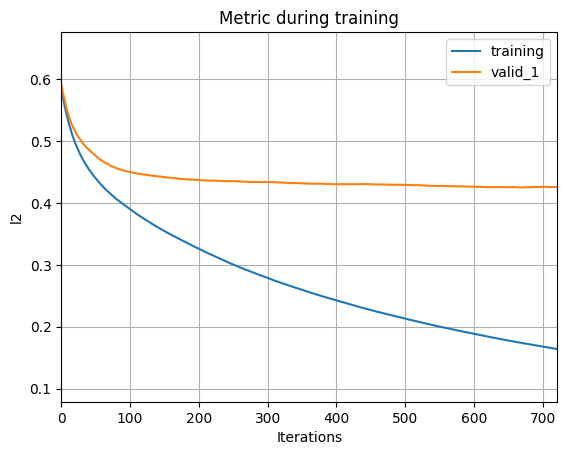

----> || Train Optimized QWK SCORE ::  0.859
----> || Val Optimized QWK SCORE ::  0.523
----> || Train Optimized Val QWK SCORE ::  0.490
----> || Val Optimized Train QWK SCORE ::  0.806
Fold 1 - Rounded Train QWK: 0.7709, Rounded Validation QWK: 0.4096


<Figure size 640x480 with 0 Axes>

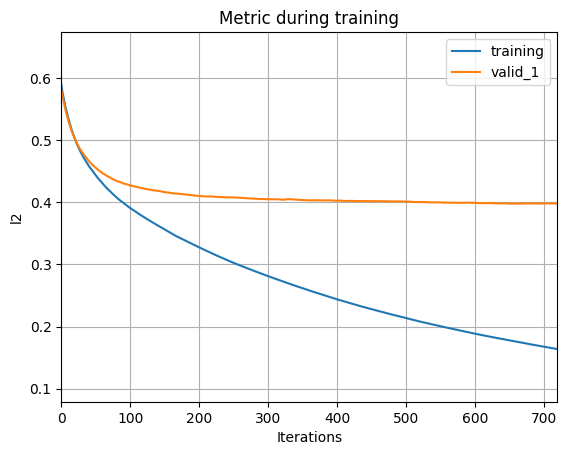

----> || Train Optimized QWK SCORE ::  0.865
----> || Val Optimized QWK SCORE ::  0.549
----> || Train Optimized Val QWK SCORE ::  0.529
----> || Val Optimized Train QWK SCORE ::  0.821
Fold 2 - Rounded Train QWK: 0.7727, Rounded Validation QWK: 0.4752


<Figure size 640x480 with 0 Axes>

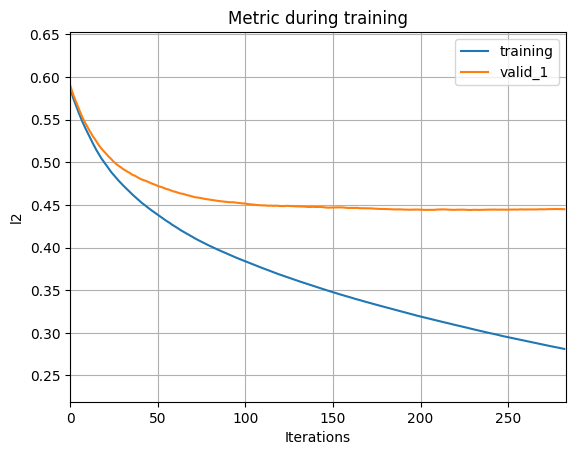

----> || Train Optimized QWK SCORE ::  0.715
----> || Val Optimized QWK SCORE ::  0.494
----> || Train Optimized Val QWK SCORE ::  0.461
----> || Val Optimized Train QWK SCORE ::  0.688
Fold 3 - Rounded Train QWK: 0.5818, Rounded Validation QWK: 0.3704


<Figure size 640x480 with 0 Axes>

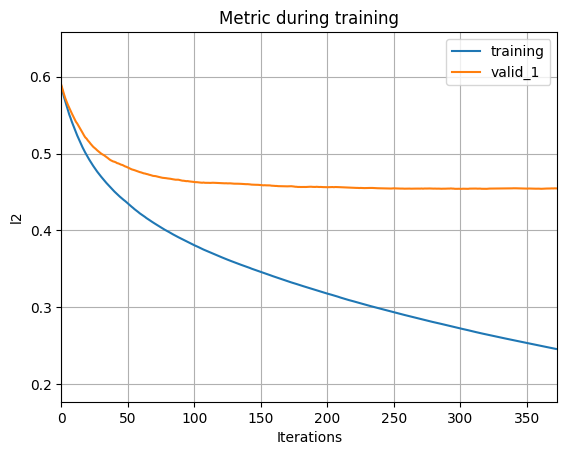

----> || Train Optimized QWK SCORE ::  0.761
----> || Val Optimized QWK SCORE ::  0.493
----> || Train Optimized Val QWK SCORE ::  0.442
----> || Val Optimized Train QWK SCORE ::  0.721
Fold 4 - Rounded Train QWK: 0.6515, Rounded Validation QWK: 0.3717


<Figure size 640x480 with 0 Axes>

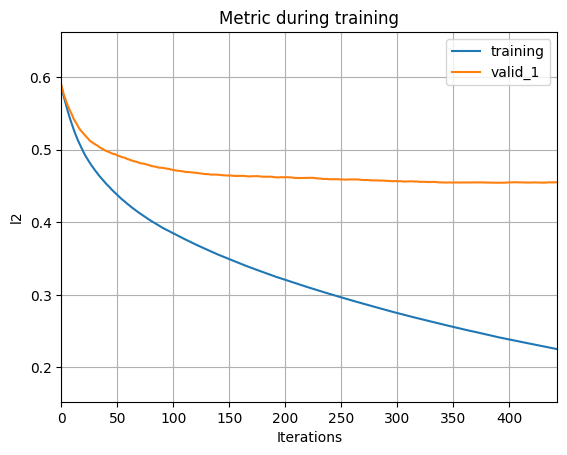

----> || Train Optimized QWK SCORE ::  0.782
----> || Val Optimized QWK SCORE ::  0.441
----> || Train Optimized Val QWK SCORE ::  0.423
----> || Val Optimized Train QWK SCORE ::  0.721
Fold 5 - Rounded Train QWK: 0.6813, Rounded Validation QWK: 0.3824
Mean Train QWK --> 0.7965
Mean Validation QWK ---> 0.4998
----> || Optimized QWK SCORE ::  0.494


In [182]:
lgb_models_list8, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds, lgb_optuna_study = lgb_feature_selection(
    train_selected_df8, test_selected_df8, 3
)

In [ ]:
# https://www.kaggle.com/code/ichigoe/lb0-494-with-tabnet
# Edited by Max (Jongyun Han)
def lgb_train(params, train_data, test_data):
    X = train_data.drop(['id', 'sii'], axis=1)
    y = train_data['sii']

    test_data_copy = test_data.copy()
    test_data = test_data.drop('id', axis=1)

    SKF = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=SEED)
    
    train_S = []
    test_S = []
    
    oof_non_rounded = np.zeros(len(y), dtype=float) 
    oof_rounded = np.zeros(len(y), dtype=int) 
    test_preds = np.zeros((len(test_data), n_splits))

    models_list = []

    #for fold, (train_idx, test_idx) in enumerate(tqdm(SKF.split(X, y), desc="Training Folds", total=n_splits)):
    for fold, (train_idx, test_idx) in enumerate(SKF.split(X, y)):
        X_train, X_val = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[test_idx]
        
        lgb_callbacks = [
            lgb.log_evaluation(period=20)
        ]

        model = LGBMRegressor(
            **params
        )
        
        model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_val, y_val)])#, callbacks=lgb_callbacks)

        plt.figure()
        lgb.plot_metric(model)
        plt.show()
        
        y_train_pred = model.predict(X_train)
        y_val_pred = model.predict(X_val)

        oof_non_rounded[test_idx] = y_val_pred
        y_val_pred_rounded = y_val_pred.round(0).astype(int)
        oof_rounded[test_idx] = y_val_pred_rounded

        train_KappaOPtimizer = minimize(evaluate_predictions,
                                  x0=[0.5, 1.5, 2.5], args=(y_train, y_train_pred), 
                                  method='Nelder-Mead')
        assert train_KappaOPtimizer.success, "Train Optimization did not converge."

        train_pred_tuned = threshold_Rounder(y_train_pred, train_KappaOPtimizer.x)
        train_Kappa = quadratic_weighted_kappa(y_train, train_pred_tuned)

        print(f"----> || Train Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {train_Kappa:.3f}{Style.RESET_ALL}")

        val_KappaOPtimizer = minimize(evaluate_predictions,
                                  x0=[0.5, 1.5, 2.5], args=(y_val, y_val_pred), 
                                  method='Nelder-Mead')
        assert val_KappaOPtimizer.success, "Val Optimization did not converge."

        val_pred_tuned = threshold_Rounder(y_val_pred, val_KappaOPtimizer.x)
        val_Kappa = quadratic_weighted_kappa(y_val, val_pred_tuned)

        print(f"----> || Val Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {val_Kappa:.3f}{Style.RESET_ALL}")

        train_optimized_val_pred_tuned = threshold_Rounder(y_val_pred, train_KappaOPtimizer.x)
        train_optimized_val_Kappa = quadratic_weighted_kappa(y_val, train_optimized_val_pred_tuned)

        print(f"----> || Train Optimized Val QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {train_optimized_val_Kappa:.3f}{Style.RESET_ALL}")

        val_optimized_train_pred_tuned = threshold_Rounder(y_train_pred, val_KappaOPtimizer.x)
        val_optimized_train_Kappa = quadratic_weighted_kappa(y_train, val_optimized_train_pred_tuned)

        print(f"----> || Val Optimized Train QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {val_optimized_train_Kappa:.3f}{Style.RESET_ALL}")

        rounded_train_kappa = quadratic_weighted_kappa(y_train, y_train_pred.round(0).astype(int))
        rounded_val_kappa = quadratic_weighted_kappa(y_val, y_val_pred_rounded)        

        train_S.append(train_Kappa)
        test_S.append(val_Kappa)
        
        test_preds[:, fold] = model.predict(test_data)
        
        print(f"Fold {fold+1} - Rounded Train QWK: {rounded_train_kappa:.4f}, Rounded Validation QWK: {rounded_val_kappa:.4f}")
        #clear_output(wait=True)

        models_list.append(model)

    print(f"Mean Train QWK --> {np.mean(train_S):.4f}")
    print(f"Mean Validation QWK ---> {np.mean(test_S):.4f}")

    KappaOPtimizer = minimize(evaluate_predictions,
                              x0=[0.5, 1.5, 2.5], args=(y, oof_non_rounded), 
                              method='Nelder-Mead')
    assert KappaOPtimizer.success, "Optimization did not converge."
    
    oof_tuned = threshold_Rounder(oof_non_rounded, KappaOPtimizer.x)
    tKappa = quadratic_weighted_kappa(y, oof_tuned)

    print(f"----> || Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {tKappa:.3f}{Style.RESET_ALL}")

    tpm = test_preds.mean(axis=1)
    tpTuned = threshold_Rounder(tpm, KappaOPtimizer.x)
    
    submission = pd.DataFrame({
        'id': test_data_copy['id'],
        'sii': tpTuned
    })

    return models_list, submission, oof_non_rounded, tpm

In [ ]:
lgb_params = {
    'verbosity': -1,
    'seed': SEED,
    'learning_rate': 0.01,
    'num_iterations': 3000,
    'early_stopping_round': 10,
    'max_depth': 12,
    'min_data_in_leaf': 40,
    'num_leaves': 20,
    'min_gain_to_split': 0.05,
    'feature_fraction': 0.8,
    #'bagging_fraction': 0.784,
    #'bagging_freq': 4,
    'lambda_l1': 2,
    'lambda_l2': 50,
    'device': 'gpu'
}

lgb_models_list, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds = lgb_train(lgb_params, train_final_df, test_final_df)

In [ ]:
# https://www.kaggle.com/code/ichigoe/lb0-494-with-tabnet
# Edited by Max (Jongyun Han)
def catboost_feature_selection(train_data, test_data, optuna_n_trials=100):
    X = train_data.drop(['id', 'sii'], axis=1)
    y = train_data['sii']

    test_data_copy = test_data.copy()
    test_data = test_data.drop('id', axis=1)

    SKF = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=SEED)
    
    train_S = []
    test_S = []
    
    oof_non_rounded = np.zeros(len(y), dtype=float) 
    oof_rounded = np.zeros(len(y), dtype=int) 
    test_preds = np.zeros((len(test_data), n_splits))

    models_list = []

    base_params = {
        'iterations': 3000,
        'random_seed': SEED,
        'verbose': 0,
        'task_type': 'GPU',
        'use_best_model': True,
        'boosting_type': 'Plain'
    }

    def objective(trial):
        
        params_to_tune = {
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.03),
            'depth': trial.suggest_int('depth', 6, 9),
            'l2_leaf_reg': trial.suggest_int('l2_leaf_reg', 10, 70),
            'early_stopping_rounds': trial.suggest_int('early_stopping_rounds', 20, 40)
        }
    
        #for fold, (train_idx, test_idx) in enumerate(tqdm(SKF.split(X, y), desc="Training Folds", total=n_splits)):
        for fold, (train_idx, test_idx) in enumerate(SKF.split(X, y)):
            X_train, X_val = X.iloc[train_idx], X.iloc[test_idx]
            y_train, y_val = y.iloc[train_idx], y.iloc[test_idx]
    
            model = CatBoostRegressor(
                **base_params,
                **params_to_tune
            )
            
            model.fit(X_train, y_train, eval_set=(X_val, y_val))#, plot=True)
    
            y_train_pred = model.predict(X_train)
            y_val_pred = model.predict(X_val)
    
            oof_non_rounded[test_idx] = y_val_pred
            y_val_pred_rounded = y_val_pred.round(0).astype(int)
            oof_rounded[test_idx] = y_val_pred_rounded
    
            train_KappaOPtimizer = minimize(evaluate_predictions,
                                      x0=[0.5, 1.5, 2.5], args=(y_train, y_train_pred), 
                                      method='Nelder-Mead')
            assert train_KappaOPtimizer.success, "Train Optimization did not converge."
    
            train_pred_tuned = threshold_Rounder(y_train_pred, train_KappaOPtimizer.x)
            train_Kappa = quadratic_weighted_kappa(y_train, train_pred_tuned)
    
            #print(f"----> || Train Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {train_Kappa:.3f}{Style.RESET_ALL}")
    
            val_KappaOPtimizer = minimize(evaluate_predictions,
                                      x0=[0.5, 1.5, 2.5], args=(y_val, y_val_pred), 
                                      method='Nelder-Mead')
            assert val_KappaOPtimizer.success, "Val Optimization did not converge."
    
            val_pred_tuned = threshold_Rounder(y_val_pred, val_KappaOPtimizer.x)
            val_Kappa = quadratic_weighted_kappa(y_val, val_pred_tuned)
    
            #print(f"----> || Val Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {val_Kappa:.3f}{Style.RESET_ALL}")
    
            train_optimized_val_pred_tuned = threshold_Rounder(y_val_pred, train_KappaOPtimizer.x)
            train_optimized_val_Kappa = quadratic_weighted_kappa(y_val, train_optimized_val_pred_tuned)
    
            #print(f"----> || Train Optimized Val QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {train_optimized_val_Kappa:.3f}{Style.RESET_ALL}")
    
            val_optimized_train_pred_tuned = threshold_Rounder(y_train_pred, val_KappaOPtimizer.x)
            val_optimized_train_Kappa = quadratic_weighted_kappa(y_train, val_optimized_train_pred_tuned)
    
            #print(f"----> || Val Optimized Train QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {val_optimized_train_Kappa:.3f}{Style.RESET_ALL}")
    
            rounded_train_kappa = quadratic_weighted_kappa(y_train, y_train_pred.round(0).astype(int))
            rounded_val_kappa = quadratic_weighted_kappa(y_val, y_val_pred_rounded)        
    
            train_S.append(train_Kappa)
            test_S.append(val_Kappa)
            
            test_preds[:, fold] = model.predict(test_data)
            
            #print(f"Fold {fold+1} - Rounded Train QWK: {rounded_train_kappa:.4f}, Rounded Validation QWK: {rounded_val_kappa:.4f}")
            #clear_output(wait=True)
    
            models_list.append(model)
    
        #print(f"Mean Train QWK --> {np.mean(train_S):.4f}")
        #print(f"Mean Validation QWK ---> {np.mean(test_S):.4f}")
    
        KappaOPtimizer = minimize(evaluate_predictions,
                                  x0=[0.5, 1.5, 2.5], args=(y, oof_non_rounded), 
                                  method='Nelder-Mead')
        assert KappaOPtimizer.success, "Optimization did not converge."
        
        oof_tuned = threshold_Rounder(oof_non_rounded, KappaOPtimizer.x)
        tKappa = quadratic_weighted_kappa(y, oof_tuned)
    
        print(f"----> || Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {tKappa:.3f}{Style.RESET_ALL}")
    
        tpm = test_preds.mean(axis=1)
        tpTuned = threshold_Rounder(tpm, KappaOPtimizer.x)
        
        submission = pd.DataFrame({
            'id': test_data_copy['id'],
            'sii': tpTuned
        })
    
        return tKappa

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=optuna_n_trials)  # You can increase n_trials for better results

    return study

In [ ]:
catboost_optuna_study = catboost_feature_selection(train_final_df, test_final_df, 5)

In [ ]:
plot_optimization_history(catboost_optuna_study)

In [ ]:
plot_optimization_history(catboost_optuna_study)

In [ ]:
plot_parallel_coordinate(catboost_optuna_study)

In [ ]:
plot_slice(catboost_optuna_study)

In [ ]:
plot_param_importances(catboost_optuna_study)

In [ ]:
plot_rank(catboost_optuna_study)

In [ ]:
# https://www.kaggle.com/code/ichigoe/lb0-494-with-tabnet
# Edited by Max (Jongyun Han)
def catboost_train(train_data, test_data):
    X = train_data.drop(['id', 'sii'], axis=1)
    y = train_data['sii']

    test_data_copy = test_data.copy()
    test_data = test_data.drop('id', axis=1)

    SKF = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=SEED)
    
    train_S = []
    test_S = []
    
    oof_non_rounded = np.zeros(len(y), dtype=float) 
    oof_rounded = np.zeros(len(y), dtype=int) 
    test_preds = np.zeros((len(test_data), n_splits))

    models_list = []

    catboost_params = {
        'learning_rate': 0.02,
        'depth': 9,
        'iterations': 2000,
        'random_seed': SEED,
        'verbose': 0,
        'l2_leaf_reg': 15,
        'task_type': 'GPU',
        'use_best_model': True,
        'early_stopping_rounds': 30,
        'boosting_type': 'Ordered'
    }

    #for fold, (train_idx, test_idx) in enumerate(tqdm(SKF.split(X, y), desc="Training Folds", total=n_splits)):
    for fold, (train_idx, test_idx) in enumerate(SKF.split(X, y)):
        X_train, X_val = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[test_idx]

        model = CatBoostRegressor(
            **catboost_params
        )
        
        model.fit(X_train, y_train, eval_set=(X_val, y_val), plot=True)

        y_train_pred = model.predict(X_train)
        y_val_pred = model.predict(X_val)

        oof_non_rounded[test_idx] = y_val_pred
        y_val_pred_rounded = y_val_pred.round(0).astype(int)
        oof_rounded[test_idx] = y_val_pred_rounded

        train_KappaOPtimizer = minimize(evaluate_predictions,
                                  x0=[0.5, 1.5, 2.5], args=(y_train, y_train_pred), 
                                  method='Nelder-Mead')
        assert train_KappaOPtimizer.success, "Train Optimization did not converge."

        train_pred_tuned = threshold_Rounder(y_train_pred, train_KappaOPtimizer.x)
        train_Kappa = quadratic_weighted_kappa(y_train, train_pred_tuned)

        print(f"----> || Train Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {train_Kappa:.3f}{Style.RESET_ALL}")

        val_KappaOPtimizer = minimize(evaluate_predictions,
                                  x0=[0.5, 1.5, 2.5], args=(y_val, y_val_pred), 
                                  method='Nelder-Mead')
        assert val_KappaOPtimizer.success, "Val Optimization did not converge."

        val_pred_tuned = threshold_Rounder(y_val_pred, val_KappaOPtimizer.x)
        val_Kappa = quadratic_weighted_kappa(y_val, val_pred_tuned)

        print(f"----> || Val Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {val_Kappa:.3f}{Style.RESET_ALL}")

        train_optimized_val_pred_tuned = threshold_Rounder(y_val_pred, train_KappaOPtimizer.x)
        train_optimized_val_Kappa = quadratic_weighted_kappa(y_val, train_optimized_val_pred_tuned)

        print(f"----> || Train Optimized Val QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {train_optimized_val_Kappa:.3f}{Style.RESET_ALL}")

        val_optimized_train_pred_tuned = threshold_Rounder(y_train_pred, val_KappaOPtimizer.x)
        val_optimized_train_Kappa = quadratic_weighted_kappa(y_train, val_optimized_train_pred_tuned)

        print(f"----> || Val Optimized Train QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {val_optimized_train_Kappa:.3f}{Style.RESET_ALL}")

        rounded_train_kappa = quadratic_weighted_kappa(y_train, y_train_pred.round(0).astype(int))
        rounded_val_kappa = quadratic_weighted_kappa(y_val, y_val_pred_rounded)        

        train_S.append(train_Kappa)
        test_S.append(val_Kappa)
        
        test_preds[:, fold] = model.predict(test_data)
        
        print(f"Fold {fold+1} - Rounded Train QWK: {rounded_train_kappa:.4f}, Rounded Validation QWK: {rounded_val_kappa:.4f}")
        #clear_output(wait=True)

        models_list.append(model)

    print(f"Mean Train QWK --> {np.mean(train_S):.4f}")
    print(f"Mean Validation QWK ---> {np.mean(test_S):.4f}")

    KappaOPtimizer = minimize(evaluate_predictions,
                              x0=[0.5, 1.5, 2.5], args=(y, oof_non_rounded), 
                              method='Nelder-Mead')
    assert KappaOPtimizer.success, "Optimization did not converge."
    
    oof_tuned = threshold_Rounder(oof_non_rounded, KappaOPtimizer.x)
    tKappa = quadratic_weighted_kappa(y, oof_tuned)

    print(f"----> || Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {tKappa:.3f}{Style.RESET_ALL}")

    tpm = test_preds.mean(axis=1)
    tpTuned = threshold_Rounder(tpm, KappaOPtimizer.x)
    
    submission = pd.DataFrame({
        'id': test_data_copy['id'],
        'sii': tpTuned
    })

    return models_list, submission, oof_non_rounded, tpm

In [ ]:
cat_models_list, cat_submission_df, cat_raw_train_preds, cat_raw_test_preds = catboost_train(train_final_df, test_final_df)

In [ ]:
#submission_df.to_csv('submission.csv', index=False)